<a href="https://colab.research.google.com/github/TeDand/neuromorphic-classification/blob/main/fully_neuromorphic_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Notebook Setup

## Hardware Setup

In [ ]:
import tensorflow as tf

gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

gpu = tf.test.gpu_device_name()
print(gpu)

Sun Jun 19 19:16:18 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   56C    P8    11W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Mounting Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Setup

In [ ]:
import numpy as np
import tensorflow as tf
%matplotlib inline
!pip install -q nengo nengo_dl
import matplotlib.pyplot as plt
import nengo
import nengo_dl

seed = 0
np.random.seed(seed)
tf.random.set_seed(seed)

In [ ]:
import torch
from torchvision import transforms

def run_network(
    activation,
    params_file="keras_to_snn_params",
    n_steps=8,
    scale_firing_rates=1,
    synapse=None,
    n_test=400,
    dataset="nmnist",
    batch_size=20
):
    # convert the keras model to a nengo network
    nengo_converter = nengo_dl.Converter(
        model,
        swap_activations={tf.nn.relu: activation},
        scale_firing_rates=scale_firing_rates,
        synapse=synapse,
        max_to_avg_pool=True
    )

    with nengo_converter.net:
        # nengo_dl.configure_settings(simplifications=[])
        nengo_dl.configure_settings(planner=nengo_dl.graph_optimizer.noop_planner)

    # get input/output objects
    nengo_input = nengo_converter.inputs[inp]
    nengo_output = nengo_converter.outputs[out]

    # add a probe to the first convolutional layer to record activity.
    # we'll only record from a subset of neurons, to save memory.
    sample_neurons = np.linspace(
        0,
        np.prod(conv0.shape[1:]),
        1000,
        endpoint=False,
        dtype=np.int32,
    )
    with nengo_converter.net:
        conv0_probe = nengo.Probe(nengo_converter.layers[conv0][sample_neurons])

    # repeat inputs for some number of timesteps
    x_test_flat_rep = np.repeat(x_test_flat, n_steps, axis=1)

    # set some options to speed up simulation
    with nengo_converter.net:
        nengo_dl.configure_settings(stateful=False)

    # build network, load in trained weights, run inference on test images
    with nengo_dl.Simulator(
        nengo_converter.net, minibatch_size=batch_size, progress_bar=False
    ) as nengo_sim:
        nengo_sim.load_params(params_file)
        data = nengo_sim.predict({nengo_input: x_test_flat_rep})

    del x_test_flat_rep

    # compute accuracy on test data, using output of network on
    # last timestep
    predictions = np.argmax(data[nengo_output][:, -1], axis=-1)
    actual = np.argmax(y_test, axis=1)
    matches = np.array([predictions[i] == actual[i] for i in range(len(predictions))])
    # accuracy = (predictions == actual).mean()
    # print(f"Test accuracy: {100 * accuracy:.2f}%")
    print(f"Test Accuracy: {100 * matches.mean():.2f}%")

    # plot the results
    for ii in range(3):
        plt.figure(figsize=(12, 4))

        plt.subplot(1, 3, 1)
        plt.title("Input image")

        image = np.zeros((34, 34))
        if dataset == "nmnist":
          image = x_test_flat[ii, 0].reshape((8, 34, 34))[0]
        if dataset == "dvs":
          to_img = transforms.ToPILImage()
          img_tensor = torch.zeros([20, 3, 128, 128])
          img_tensor[:, 1] = torch.from_numpy(np.moveaxis(x_test_flat[ii, 0].reshape((20, 128, 128, 2)), -1, -3))[:, 0]
          img_tensor[:, 2] = torch.from_numpy(np.moveaxis(x_test_flat[ii, 0].reshape((20, 128, 128, 2)), -1, -3))[:, 1]
          image = to_img(img_tensor[0])
          # image = np.zeros(shape=(128, 128, 3))
          # image[:, :, 1] = x_test_flat[ii, 0].reshape((20, 128, 128, 2))[0][:, :, 0]
          # image[:, :, 2] = x_test_flat[ii, 0].reshape((20, 128, 128, 2))[0][:, :, 1]
          # image = (image * 255).astype(np.uint8)
        plt.imshow(image, cmap="gray")
        plt.axis("off")

        plt.subplot(1, 3, 2)
        scaled_data = data[conv0_probe][ii] * scale_firing_rates
        if isinstance(activation, nengo.SpikingRectifiedLinear):
            scaled_data *= 0.001
            rates = np.sum(scaled_data, axis=0) / (8 * n_steps * nengo_sim.dt)
            plt.ylabel("Number of spikes")
        else:
            rates = scaled_data
            plt.ylabel("Firing rates (Hz)")
        plt.xlabel("Timestep")
        plt.title(
            f"Neural activities (conv0 mean={rates.mean():.1f} Hz, "
            f"max={rates.max():.1f} Hz)"
        )
        plt.plot(scaled_data)

        plt.subplot(1, 3, 3)
        plt.title("Output predictions")
        plt.plot(tf.nn.softmax(data[nengo_output][ii]))
        plt.legend([str(j) for j in range(10 if dataset=="nmnist" else 11)], loc="upper left")
        plt.xlabel("Timestep")
        plt.ylabel("Probability")

        plt.tight_layout()

# NMNIST

## Working with Data


### Helper Functions

In [ ]:
from typing import NamedTuple
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import seaborn as sns
import pandas as pd

class Event(NamedTuple):
    x_location: int
    y_location: int
    polarity: int
    timestamp: int

def read_events(filepath):
  file = open(filepath, "rb")

  events = []

  # reading 5 bytes (40 bits) at a time
  event = int.from_bytes(file.read(5), byteorder="little", signed=False)

  i = 0
  while event:
    # interpreting binary data
    location_mask = 0b11111111
    x_location = location_mask & event
    y_location = location_mask & (event>>8)
    polarity = 0b1 & (event>>16)
    timestamp_mask = 0b11111111111111111111111
    timestamp = timestamp_mask & (event>>17)

    # appending to list of events
    events.append(Event(x_location, y_location, polarity, timestamp))

    # reading next event
    event = int.from_bytes(file.read(5), byteorder="little", signed=False)
    i += 1

  file.close()
  return events

def visualise_events(event_list):
  off_events = list(filter(lambda event: event.polarity == 0, event_list))
  on_events = list(filter(lambda event: event.polarity == 1, event_list))

  fig = plt.figure(figsize=(8,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.set_xlabel("x_location (pixels)")
  ax.set_ylabel("timestamp (ms)")
  ax.set_zlabel("y_location (pixels)")

  ax.scatter(
      [e.x_location for e in off_events],
      [e.timestamp for e in off_events],
      [e.y_location for e in off_events],
      c="blue",
      label="off events")

  ax.scatter(
      [e.x_location for e in on_events],
      [e.timestamp for e in on_events],
      [e.y_location for e in on_events],
      c="red",
      label="on events")

  ax.legend()
  plt.show()

def segment_events(event_list, segments, visualise):
  sorted_events = sorted(event_list, key=lambda e: e.timestamp, reverse=False)
  timestamp_range = sorted_events[-1].timestamp - sorted_events[0].timestamp
  if visualise:
    print("{0} -> {1} ms = {2} ms".format(sorted_events[0].timestamp, sorted_events[-1].timestamp, timestamp_range))

  segmented_events = []
  for i in range(segments):
    segmented_events.append(list(filter(
        lambda event: event.timestamp < (i+1)*(sorted_events[-1].timestamp/segments)
        and event.timestamp > (i)*(sorted_events[-1].timestamp/segments), events)))
    if i%3 == 1 and visualise == 1:
      visualise_events(segmented_events[-1])

  return segmented_events

def visualise_on_off_events(event_list):
  off_events = list(filter(lambda event: event.polarity == 0, event_list))
  on_events = list(filter(lambda event: event.polarity == 1, event_list))

  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
  ax1.set_xlabel("x_location (pixels)")
  ax1.set_ylabel("y_location (pixels)")
  ax2.set_xlabel("x_location (pixels)")
  ax2.set_ylabel("y_location (pixels)")

  ax1.set_title("On Events")

  ax1.scatter(
      [e.x_location for e in on_events],
      [e.y_location for e in on_events],
      c="red",
      label="on events")

  ax2.set_title("Off Events")

  ax2.scatter(
      [e.x_location for e in off_events],
      [e.y_location for e in off_events],
      c="blue",
      label="off events")

  ax1.grid()
  ax2.grid()

  plt.show()

def get_intensity(event_list, max_x, max_y):
  off_events = list(filter(lambda event: event.polarity == 0, event_list))
  on_events = list(filter(lambda event: event.polarity == 1, event_list))

  intensity = [[0 for _ in range(max_x + 1)] for _ in range(max_y + 1)]

  for e in on_events:
    intensity[e.x_location][e.y_location] += 1

  for e in off_events:
    intensity[e.x_location][e.y_location] -= 1

  return intensity


def visulaise_intensity_map(event_list, max_x, max_y):
  intensity = get_intensity(event_list, max_x, max_y)

  fig = plt.figure(figsize=(8,6))
  ax = fig.add_subplot(111)
  ax.set_xlabel("x_location (pixels)")
  ax.set_ylabel("y_location (pixels)")

  # Create a dataset
  df = pd.DataFrame(intensity)

  # Default heatmap
  ax = sns.heatmap(df)
  ax.invert_yaxis()
  # p1 = sns.heatmap(df)
  plt.show()

### Downloading Data

In [ ]:
# Loading N-MNIST dataset
import zipfile
!wget -O "MNIST_testing.zip" "https://data.mendeley.com/public-files/datasets/468j46mzdv/files/05a4d654-7e03-4c15-bdfa-9bb2bcbea494/file_downloaded"
with zipfile.ZipFile("MNIST_testing.zip", 'r') as zip_ref:
    zip_ref.extractall("/content/NMNIST")
!rm "MNIST_testing.zip"
!wget -O "MNIST_training.zip" "https://data.mendeley.com/public-files/datasets/468j46mzdv/files/39c25547-014b-4137-a934-9d29fa53c7a0/file_downloaded"
with zipfile.ZipFile("MNIST_training.zip", 'r') as zip_ref:
    zip_ref.extractall("/content/NMNIST")
!rm "MNIST_training.zip"

--2022-06-14 11:41:31--  https://data.mendeley.com/public-files/datasets/468j46mzdv/files/05a4d654-7e03-4c15-bdfa-9bb2bcbea494/file_downloaded
Resolving data.mendeley.com (data.mendeley.com)... 162.159.133.86, 162.159.130.86
Connecting to data.mendeley.com (data.mendeley.com)|162.159.133.86|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://md-datasets-public-files-prod.s3.eu-west-1.amazonaws.com/a99d0fee-a95b-4231-ad22-988fdb0a2411 [following]
--2022-06-14 11:41:32--  https://md-datasets-public-files-prod.s3.eu-west-1.amazonaws.com/a99d0fee-a95b-4231-ad22-988fdb0a2411
Resolving md-datasets-public-files-prod.s3.eu-west-1.amazonaws.com (md-datasets-public-files-prod.s3.eu-west-1.amazonaws.com)... 3.5.64.174
Connecting to md-datasets-public-files-prod.s3.eu-west-1.amazonaws.com (md-datasets-public-files-prod.s3.eu-west-1.amazonaws.com)|3.5.64.174|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 169674850 (162M) [application/x-z

In [ ]:
# !cp -r /content/NMNIST /content/drive/MyDrive

Each example is a separate binary file consisting of a list of events. Each event occupies 40 bits as described below:

- bit 39 - 32: Xaddress (in pixels)

- bit 31 - 24: Yaddress (in pixels)

- bit 23: Polarity (0 for OFF, 1 for ON)

- bit 22 - 0: Timestamp (in microseconds)

### Preprocessing Data

In [ ]:
from keras.utils import np_utils
import os
import pickle

max_no = 10000/20

x_train = []
y_train = []
print('Loading training samples')
for act_class in range(10):
  # print(' class {0}'.format(act_class))
  # directory = "/content/drive/MyDrive/NMNIST/Train/{0}".format(act_class)
  directory = "/content/NMNIST/Train/{0}/".format(act_class)
  # iterate over files in
  # that directory
  count = 0
  for sample in os.listdir(directory):
      f = os.path.join(directory, sample)
      # checking if it is a file
      if os.path.isfile(f) and count < 6 * max_no:
          # print(f)
          events = read_events(f)
          max_x = 33
          max_y = 33
          segmented_events = segment_events(events, 8, False)
          intensity_maps = []
          for segment in segmented_events:
            intensity_maps.append(get_intensity(segment, max_x, max_y))
          x_train.append(intensity_maps)
          y_train.append(np_utils.to_categorical(act_class, 10))
      else:
        pass
      count = count + 1
  # print('   {0} samples loaded'.format(number_of_samples))

x_test = []
y_test = []
print('Loading testing samples')
for act_class in range(10):
  # print(' class {0}'.format(act_class))
  # directory = "/content/drive/MyDrive/NMNIST/Test/{0}".format(act_class)
  directory = "/content/NMNIST/Test/{0}/".format(act_class)
  # iterate over files in
  # that directory
  count = 0
  for sample in os.listdir(directory):
      f = os.path.join(directory, sample)
      # checking if it is a file
      if os.path.isfile(f) and count < max_no:
          # print(f)
          events = read_events(f)
          max_x = 33
          max_y = 33
          segmented_events = segment_events(events, 8, False)
          intensity_maps = []
          for segment in segmented_events:
            intensity_maps.append(get_intensity(segment, max_x, max_y))
          x_test.append(intensity_maps)
          y_test.append(np_utils.to_categorical(act_class, 10))
      else:
        pass
      count = count + 1
  # print('   {0} samples loaded'.format(number_of_samples))

x_train = np.array(x_train)
y_train = np.array(y_train)
x_test = np.array(x_test)
y_test = np.array(y_test)
train_events = {"x": x_train, "y": y_train}
test_events = {"x": x_test, "y": y_test}
all_events = {"train": train_events, "test": test_events}

Loading training samples
Loading testing samples


### Saving Data

In [ ]:
open_file = open("/content/drive/MyDrive/NMNIST/event_list.pkl", "wb")
pickle.dump(all_events, open_file)
open_file.close()

### Loading Data

In [ ]:
import pickle
import numpy as np
from sklearn.model_selection import train_test_split

open_file = open("/content/drive/MyDrive/NMNIST/event_list.pkl", "rb")
events = pickle.load(open_file)
open_file.close()

x_train = events["train"]["x"]
x_train = x_train.reshape(x_train.shape[0], x_train.shape[1], x_train.shape[2], x_train.shape[3], 1)
train_set = x_train.astype('float32')
train_set -= np.mean(x_train)
train_set /= np.max(x_train)

x_test = events["test"]["x"]
x_test = x_test.reshape(x_test.shape[0], x_test.shape[1], x_test.shape[2], x_test.shape[3], 1)
test_set = x_test.astype('float32')
test_set -= np.mean(x_train)
test_set /= np.max(x_train)

x_train = train_set
x_test = test_set
del test_set
del train_set

y_train = events["train"]["y"]
y_test = events["test"]["y"]

# Spliting the dataset for testing and training
x_train, x_val, y_train, y_val =  train_test_split(x_train, y_train, test_size=0.2, random_state=4)

print('Image shape: {0}'.format(x_train.shape[1:]))
print('Output shape: {0}'.format(y_train.shape))
print('Total number of training samples: {0}'.format(x_train.shape[0]))
print('Total number of validation samples: {0}'.format(x_val.shape[0]))
print('Total number of test samples: {0}'.format(x_test.shape[0]))

Image shape: (8, 34, 34, 1)
Output shape: (24000, 10)
Total number of training samples: 24000
Total number of validation samples: 6000
Total number of test samples: 5000


In [ ]:
x_train_flat = x_train.reshape(x_train.shape[0], 1, x_train.shape[1] * x_train.shape[2] * x_train.shape[3] * x_train.shape[4])
x_val_flat = x_val.reshape(x_val.shape[0], 1, x_val.shape[1] * x_val.shape[2] * x_val.shape[3] * x_val.shape[4])
x_test_flat = x_test.reshape(x_test.shape[0], 1, x_test.shape[1] * x_test.shape[2] * x_test.shape[3] * x_test.shape[4])

y_train_time = y_train.reshape(y_train.shape[0], 1, y_train.shape[1])
y_val_time = y_val.reshape(y_val.shape[0], 1, y_val.shape[1])

print('Input shape: {0}'.format(x_train_flat.shape))
print('Output shape: {0}'.format(y_train_time.shape))

del x_train
del x_val
del x_test
del y_train
del y_val

Input shape: (24000, 1, 9248)
Output shape: (24000, 1, 10)


## Classification Networks

### 3D Convolutional Net

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
import numpy as np
from keras.layers.core import Dense, Dropout, Activation, Flatten
from keras.layers.convolutional import Convolution3D, MaxPooling3D
from tensorflow.keras.layers import BatchNormalization, Input, Reshape
from tensorflow.keras.optimizers import Adam
from keras.callbacks import TensorBoard, EarlyStopping
import keras
import tensorflow as tf

# Number of classes to predict
nb_classes = 10
# Number of convolutional filters to use at each layer
nb_filters = 16
# Level of pooling to perform at each layer (POOL x POOL)
nb_pool = 2
# Level of convolution to perform at each layer (CONV x CONV)
nb_conv = 5

# Defining the 3D Convolution Neural Network model
inp = Input(x_train_flat.shape[2])
reshape = Reshape([8,34,34,1])(inp)
conv0 = Convolution3D(nb_filters,kernel_size=nb_conv,input_shape=(8, 34, 34, 1), activation=tf.nn.relu, padding='same')(reshape)
# norm0 = BatchNormalization()(conv0)
conv1 = Convolution3D(nb_filters,kernel_size=nb_conv,input_shape=(8, 34, 34, 1), activation=tf.nn.relu,padding='same')(conv0)
# norm1 = BatchNormalization()(conv1)
pool0 = MaxPooling3D(pool_size=nb_pool)(conv1)

# drop0 = Dropout(0.25)(pool0)

conv2 = Convolution3D(nb_filters*2,kernel_size=nb_conv,activation=tf.nn.relu,padding='same')(pool0)
# norm2 = BatchNormalization()(conv2)
pool1 = MaxPooling3D(pool_size=nb_pool)(conv2)

# drop1 = Dropout(0.25)(pool1)

conv3 = Convolution3D(nb_filters*4,kernel_size=nb_conv,activation=tf.nn.relu,padding='same')(pool1)
# norm3 = BatchNormalization()(conv3)
conv4 = Convolution3D(nb_filters*4,kernel_size=nb_conv,activation=tf.nn.relu,padding='same')(conv3)
# norm4 = BatchNormalization()(conv4)
pool2 = MaxPooling3D(pool_size=nb_pool)(conv4)

# drop2 = Dropout(0.25)(pool2)

flat0 = Flatten()(pool2)
dense0 = Dense(128,kernel_initializer = 'he_normal',activation=tf.nn.relu)(flat0)
# norm5 = BatchNormalization()(dense0)
# drop3 = Dropout(0.5)(norm5)
out = Dense(nb_classes,kernel_initializer ='he_normal')(dense0)

model = tf.keras.Model(inputs=inp, outputs=out)

In [ ]:
converter = nengo_dl.Converter(
    model,
    swap_activations={tf.nn.relu: tf.nn.relu},
    scale_firing_rates=1,
    synapse=None,
    max_to_avg_pool=True
)

# turn off the optimizer completely, as to not change the number of tensors
with converter.net:
    # nengo_dl.configure_settings(simplifications=[])
    nengo_dl.configure_settings(planner=nengo_dl.graph_optimizer.noop_planner)

with tf.device(gpu):
  do_training = False
  if do_training:
      with nengo_dl.Simulator(converter.net, minibatch_size=20) as sim:
          # run training
          sim.compile(
              optimizer=tf.optimizers.Adam(0.0001),
              loss=tf.losses.CategoricalCrossentropy(from_logits=True),
              metrics=[tf.metrics.categorical_accuracy],
          )
          sim.fit(
              {converter.inputs[inp]: x_train_flat},
              {converter.outputs[out]: y_train_time},
              validation_data=(
                  {converter.inputs[inp]: x_val_flat},
                  {converter.outputs[out]: y_val_time},
              ),
              epochs=15,
          )

          # save the parameters to file
          sim.save_params("keras_to_snn_params")
  else:
    with nengo_dl.Simulator(converter.net, minibatch_size=20) as sim:
      # download pretrained weights
      sim.load_params("keras_to_snn_params")
      print("Loaded pretrained weights")

del x_train_flat
del x_val_flat
del y_train_time
del y_val_time

Build finished in 0:00:02                                                      
Optimization finished in 0:00:00                                               
Construction finished in 0:00:00                                               
Loaded pretrained weights


Test Accuracy: 96.44%


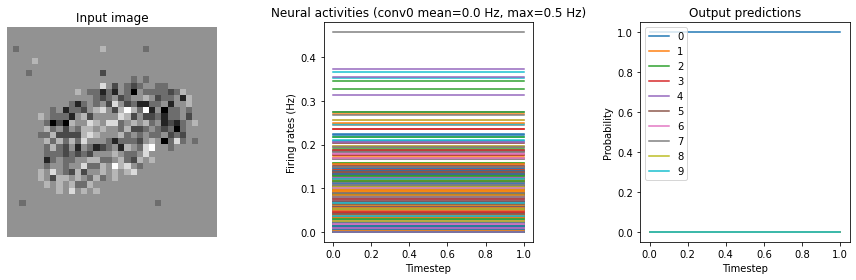

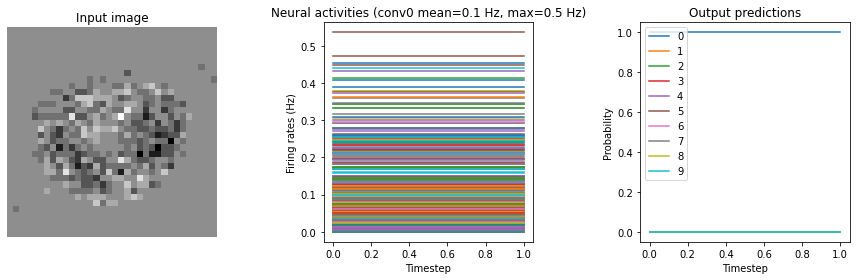

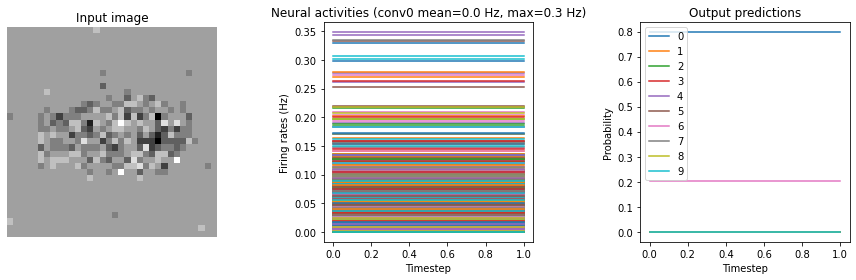

In [ ]:
run_network(activation=nengo.RectifiedLinear(), n_steps=2)

Test accuracy: 10.70%


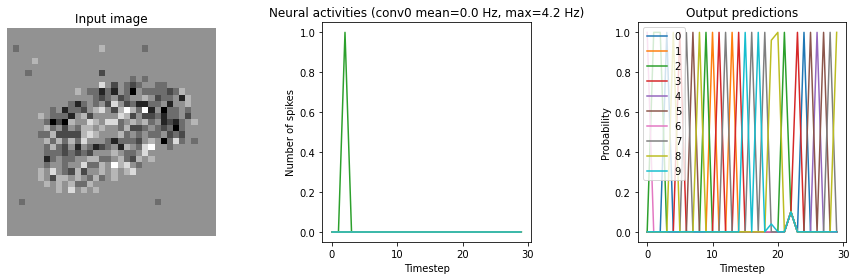

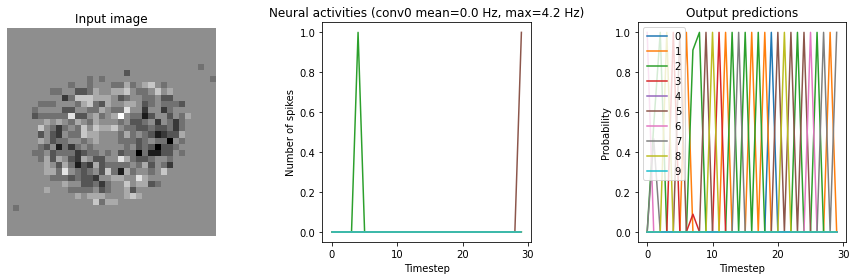

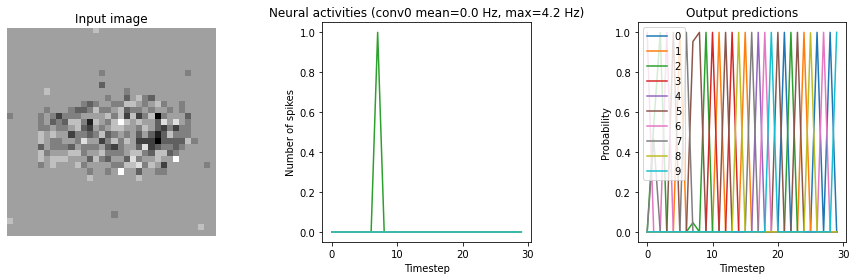

In [ ]:
run_network(activation=nengo.SpikingRectifiedLinear(), n_steps=30)

Test accuracy: 11.56%


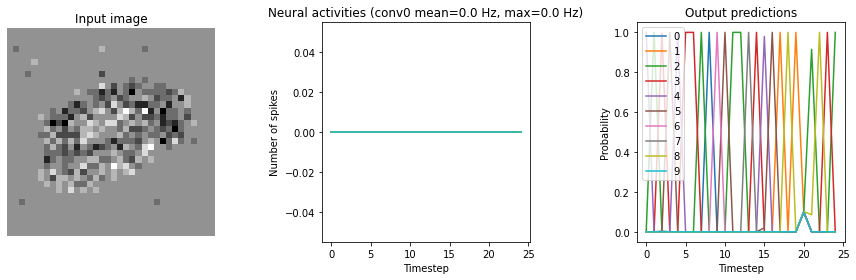

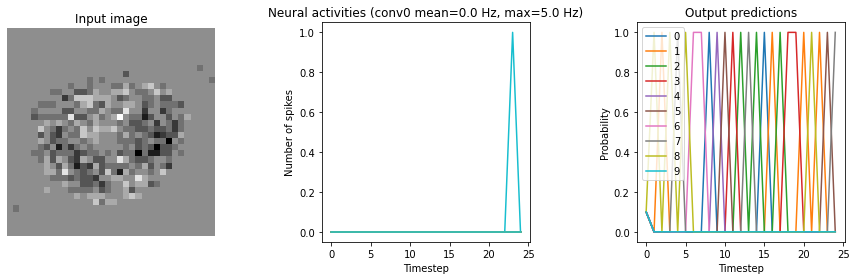

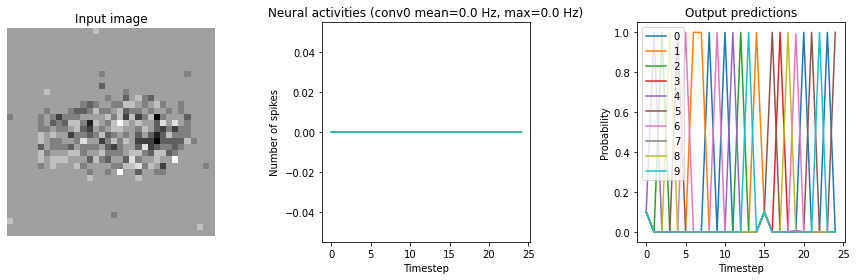

In [ ]:
run_network(activation=nengo.SpikingRectifiedLinear(), n_steps=25)

Synapse=0.001
Test accuracy: 10.18%


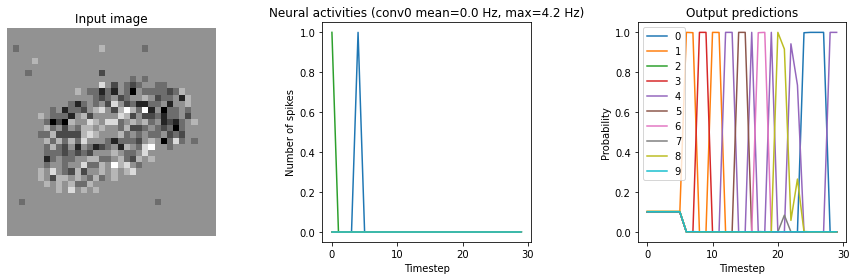

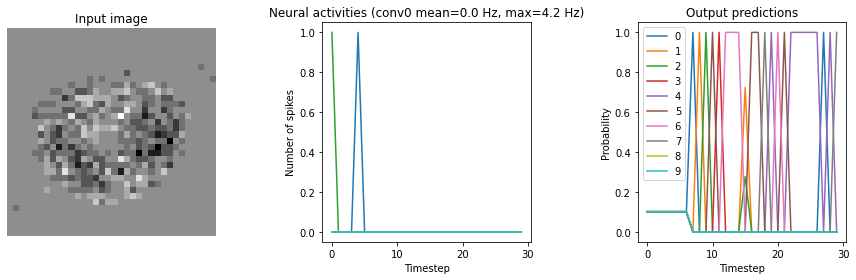

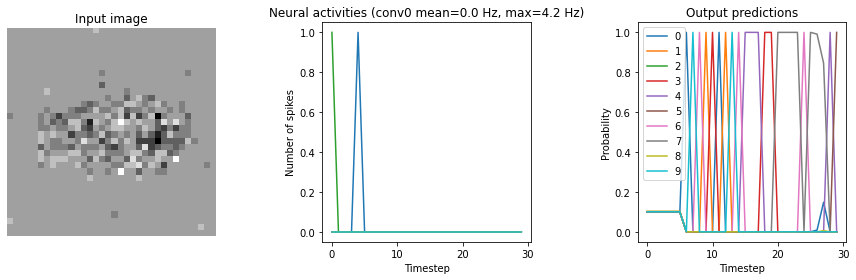

Synapse=0.005
Test accuracy: 12.96%


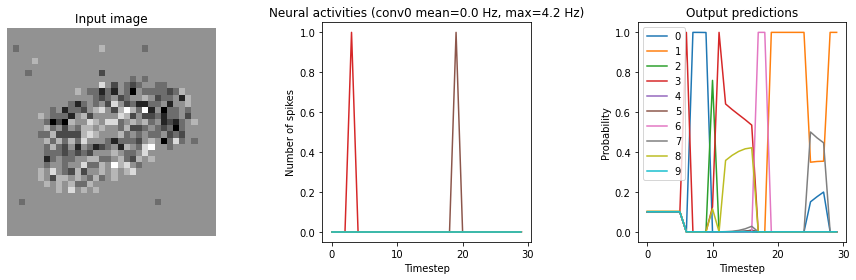

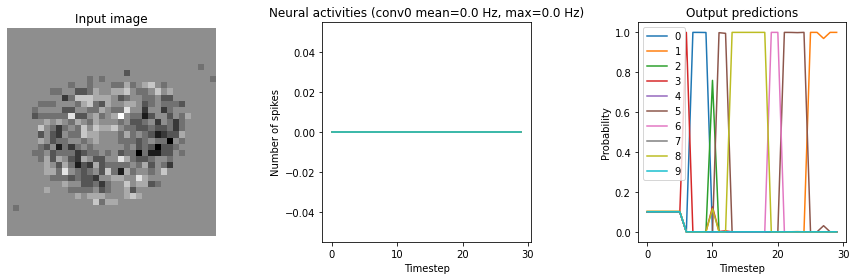

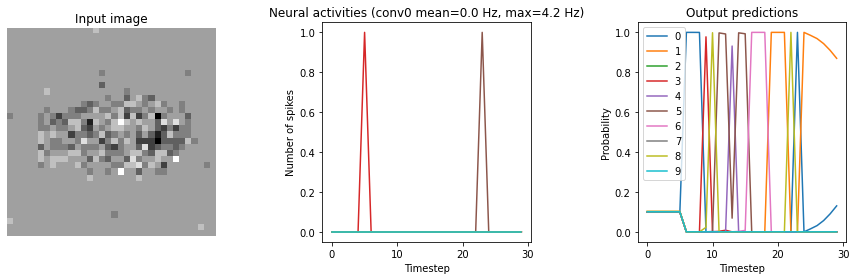

Synapse=0.010
Test accuracy: 11.14%


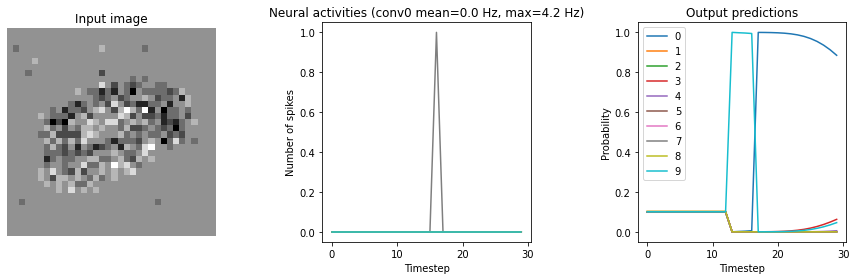

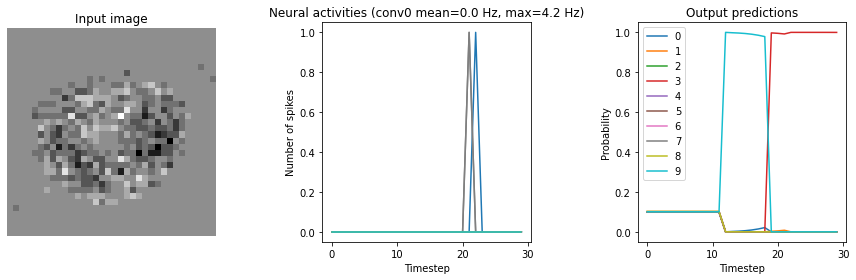

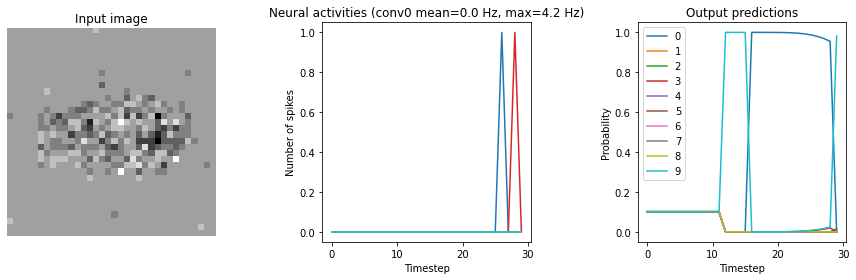

In [ ]:
for s in [0.001, 0.005, 0.010]:
    print(f"Synapse={s:.3f}")
    run_network(
        activation=nengo.SpikingRectifiedLinear(),
        synapse=s,
        n_steps=30
    )
    plt.show()

Scale=20
Test accuracy: 34.78%


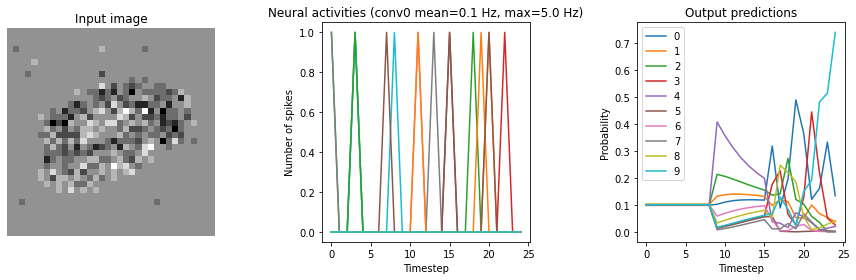

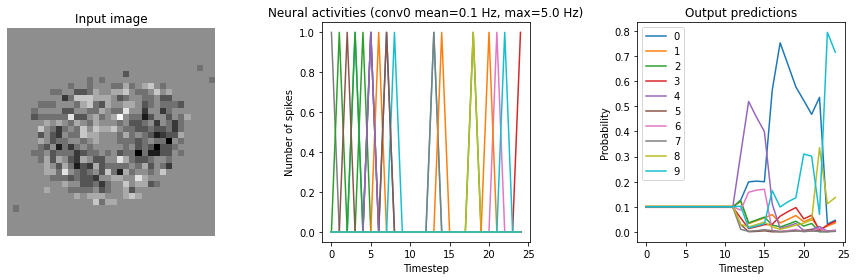

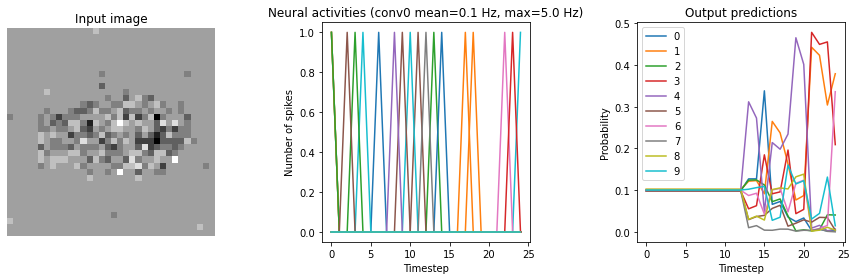

Scale=50
Test accuracy: 75.22%


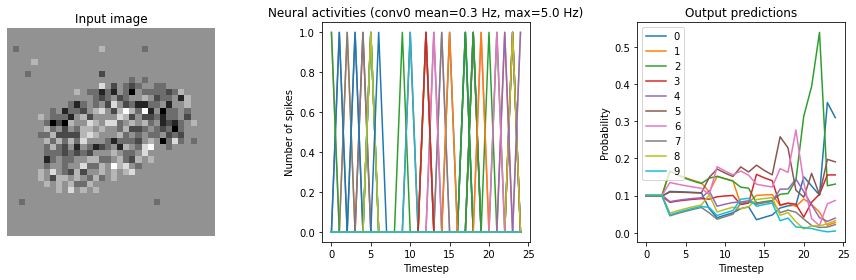

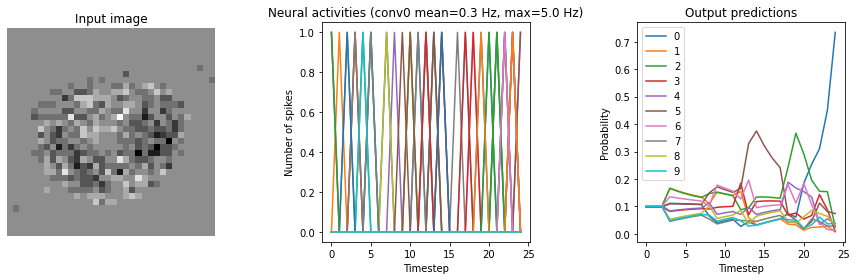

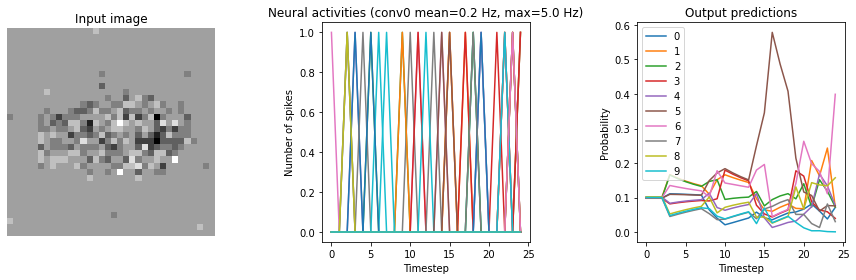

Scale=100
Test accuracy: 92.56%


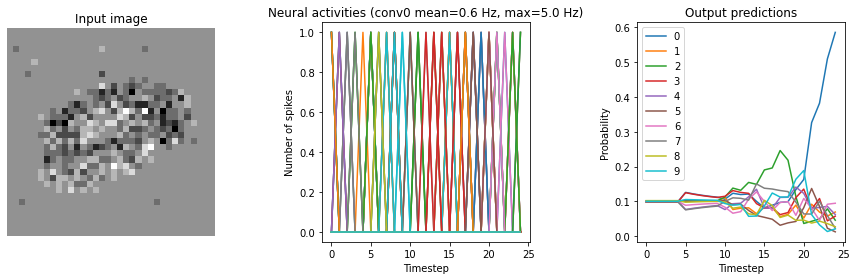

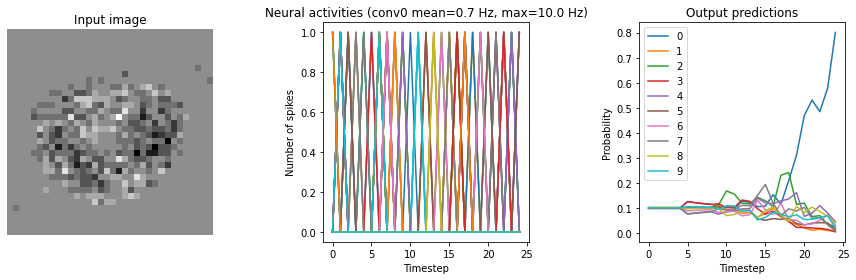

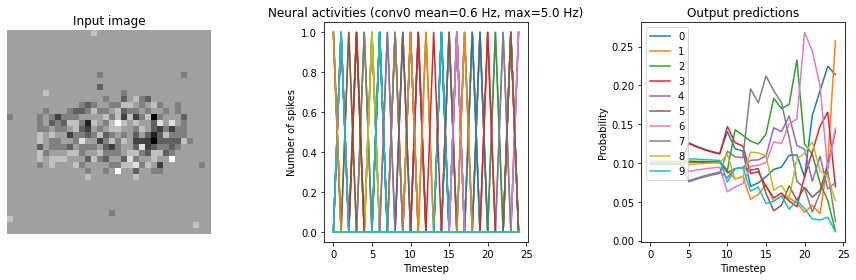

In [ ]:
for scale in [20, 50, 100]:
    print(f"Scale={scale}")
    run_network(
        activation=nengo.SpikingRectifiedLinear(),
        scale_firing_rates=scale,
        synapse=0.006,
        n_steps=25
    )
    plt.show()

Test accuracy: 94.80%


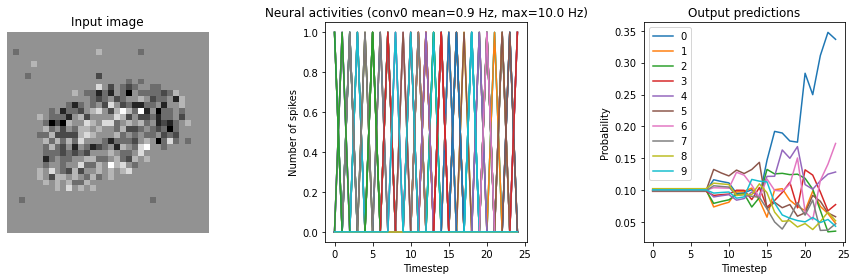

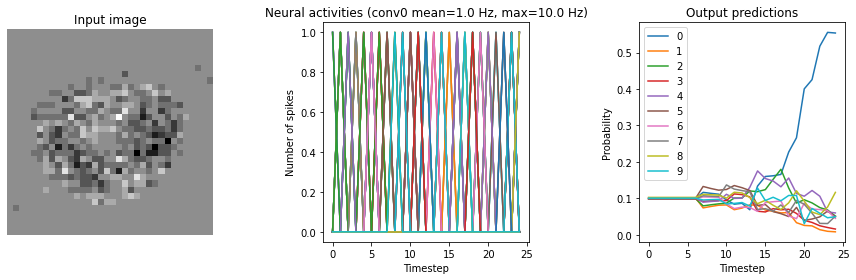

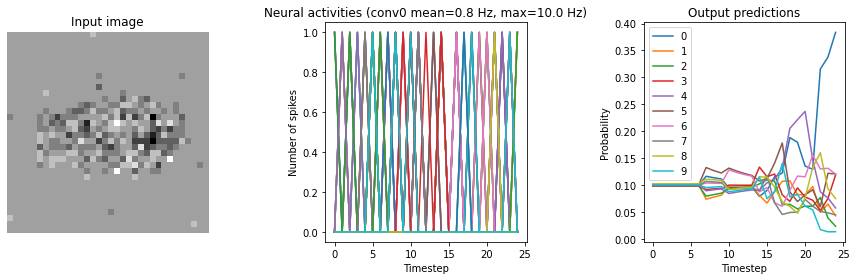

In [ ]:
run_network(
        activation=nengo.SpikingRectifiedLinear(),
        scale_firing_rates=150,
        synapse=0.006,
        n_steps=25
    )

Test Accuracy: 96.54%


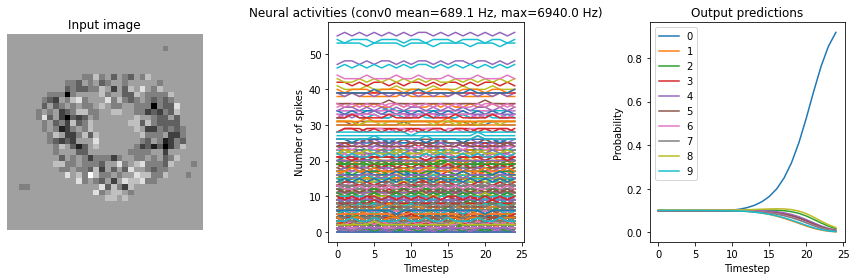

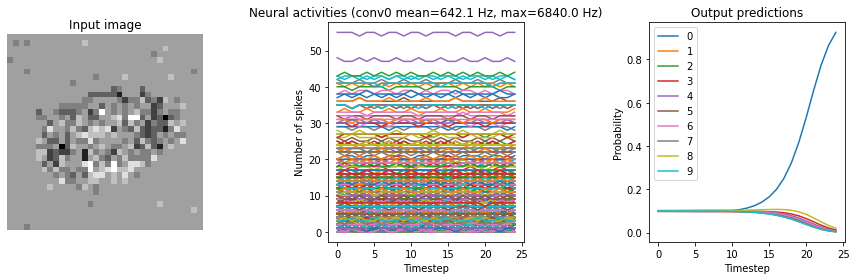

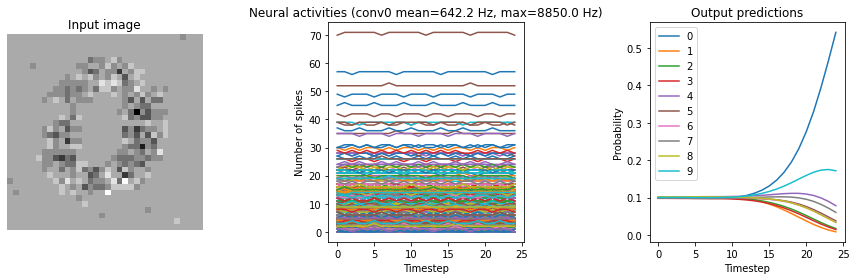

In [ ]:
run_network(
        activation=nengo.SpikingRectifiedLinear(),
        scale_firing_rates=99999,
        synapse=0.006,
        n_steps=25
    )

Test Accuracy: 96.60%


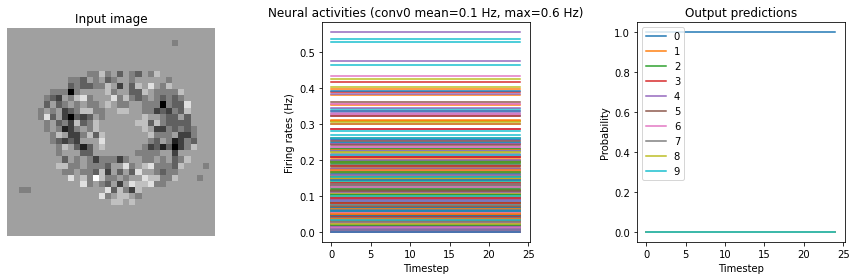

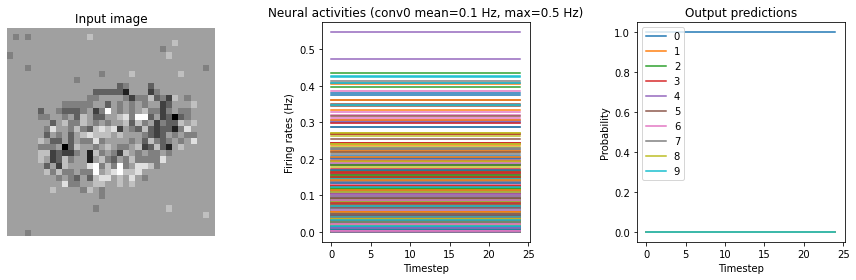

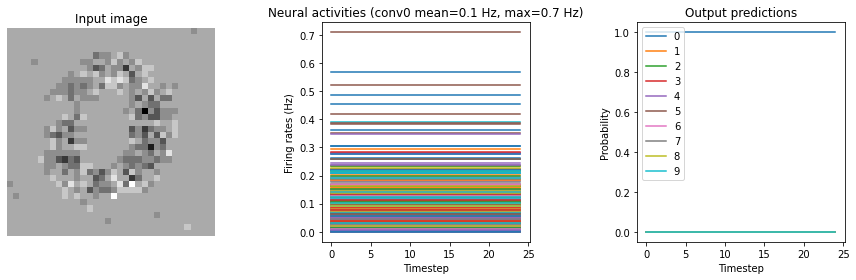

In [ ]:
run_network(
        activation=nengo.RectifiedLinear(),
        n_steps=25
    )

#### results

In [ ]:
activation = nengo.SpikingRectifiedLinear()
scale_firing_rates = 150
synapse = 0.006
n_steps = 30
params_file = "keras_to_snn_params"

nengo_converter = nengo_dl.Converter(
    model,
    swap_activations={tf.nn.relu: activation},
    scale_firing_rates=scale_firing_rates,
    synapse=synapse,
    max_to_avg_pool=True
)

with nengo_converter.net:
    nengo_dl.configure_settings(planner=nengo_dl.graph_optimizer.noop_planner)

# get input/output objects
nengo_input = nengo_converter.inputs[inp]
nengo_output = nengo_converter.outputs[out]

# # repeat inputs for some number of timesteps
x_test_flat_rep = np.repeat(x_test_flat, n_steps, axis=1)

# set some options to speed up simulation
with nengo_converter.net:
    nengo_dl.configure_settings(stateful=False)

# build network, load in trained weights, run inference on test images
with nengo_dl.Simulator(
    nengo_converter.net, minibatch_size=20, progress_bar=False
) as nengo_sim:
    nengo_sim.load_params(params_file)
    data = nengo_sim.predict({nengo_input: x_test_flat_rep})

# compute accuracy on test data, using output of network on
# last timestep
predictions = np.argmax(data[nengo_output][:, -1], axis=-1)
actual = np.argmax(y_test, axis=1)
accuracy = (predictions == actual).mean()
print(f"Test accuracy: {100 * accuracy:.2f}%")

Test accuracy: 96.24%


AttributeError: ignored

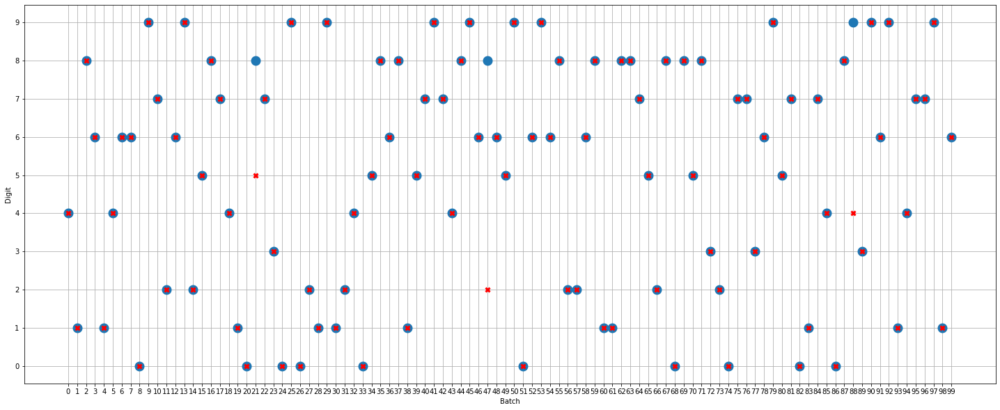

In [ ]:
import random

n_tests = 100

sampled_pred, sampled_act = zip(*random.sample(list(zip(predictions, actual)), n_tests))

plt.rcParams["figure.figsize"] = (25,10)
plt.plot(sampled_pred, 'o', mew=8, label="predictions")
plt.plot(sampled_act, 'rx', mew=3, label="actual")
plt.xlabel("Batch")
plt.xticks(list(range(0, n_tests)))
plt.ylabel("Digit")
plt.yticks(list(range(10)))
# plt.minorticks_on()
plt.grid(which="major")
# plt.grid(axis='x', which="minor")
for label in plt.xticks.get:
    label.set_visible(False)

plt.legend()
plt.show()
plt.rcParams["figure.figsize"] = plt.rcParamsDefault["figure.figsize"]

### Conv LSTM

In [ ]:
from numpy.core.numeric import outer
import tensorflow as tf
from tensorflow.keras import models, layers
from tensorflow.keras.optimizers import Adam
from keras.callbacks import EarlyStopping
from keras.callbacks import TensorBoard
import keras
from sklearn.model_selection import train_test_split

timesteps = 8
width = 34
height = 34
channels = 1
action_num = 10

inp = layers.Input(x_train_flat.shape[2])
reshape = layers.Reshape([timesteps,width,height,channels])(inp)

conv0 = layers.ConvLSTM2D(
    filters=64, kernel_size=(3, 3), padding="same", return_sequences=True, dropout=0.1, recurrent_dropout=0.1, activation=tf.nn.relu
)(reshape)

pool0 = layers.MaxPool3D(
    pool_size=(1, 2, 2), strides=(1, 2, 2), padding="same"
)(conv0)

# layers.BatchNormalization()

conv1 = layers.ConvLSTM2D(
    filters=32, kernel_size=(3, 3), padding="same", return_sequences=True, dropout=0.1, recurrent_dropout=0.1, activation=tf.nn.relu
)(pool0)

pool1 = layers.MaxPool3D(
    pool_size=(1, 2, 2), strides=(1, 2, 2), padding="same"
)(conv1)

# layers.BatchNormalization()

conv2 = layers.ConvLSTM2D(
    filters=16, kernel_size=(3, 3), padding="same", return_sequences=False, dropout=0.1, recurrent_dropout=0.1, activation=tf.nn.relu
)(pool1)

pool2 = layers.MaxPool2D(
    pool_size=(2, 2), strides=(2, 2), padding="same"
)(conv2)

# layers.BatchNormalization()

flat0 = layers.Flatten()(pool2)
dense0 = layers.Dense(256, activation=tf.nn.relu)(flat0)
out = layers.Dense(action_num)(dense0)

model = tf.keras.Model(inputs=inp, outputs=out)

In [ ]:
converter = nengo_dl.Converter(
    model,
    swap_activations={tf.nn.relu: tf.nn.relu},
    scale_firing_rates=1,
    synapse=None,
    max_to_avg_pool=True
)

# turn off the optimizer completely, as to not change the number of tensors
with converter.net:
    # nengo_dl.configure_settings(simplifications=[])
    nengo_dl.configure_settings(planner=nengo_dl.graph_optimizer.noop_planner)

with tf.device(gpu):
  do_training = False
  if do_training:
      with nengo_dl.Simulator(converter.net, minibatch_size=20) as sim:
          # run training
          sim.compile(
              optimizer=tf.optimizers.Adam(0.0001),
              loss=tf.losses.CategoricalCrossentropy(from_logits=True),
              metrics=[tf.metrics.categorical_accuracy],
          )
          sim.fit(
              {converter.inputs[inp]: x_train_flat},
              {converter.outputs[out]: y_train_time},
              validation_data=(
                  {converter.inputs[inp]: x_val_flat},
                  {converter.outputs[out]: y_val_time},
              ),
              epochs=15,
          )

          # save the parameters to file
          sim.save_params("keras_to_snn_params")
  else:
    with nengo_dl.Simulator(converter.net, minibatch_size=20) as sim:
      # download pretrained weights
      sim.load_params("keras_to_snn_params")
      print("Loaded pretrained weights")

del x_train_flat
del x_val_flat
del y_train_time
del y_val_time

Build finished in 0:00:00                                                      
Optimization finished in 0:00:00                                               
|#                        Constructing graph                          | 0:00:00

/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: Layer type ConvLSTM2D does not have a registered converter. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d_1.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling2d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"


Construction finished in 0:00:00                                               
Loaded pretrained weights


/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: Layer type ConvLSTM2D does not have a registered converter. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d_1.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling2d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"


Test Accuracy: 96.84%


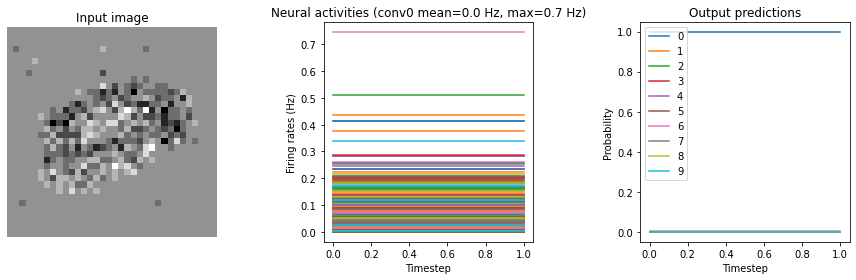

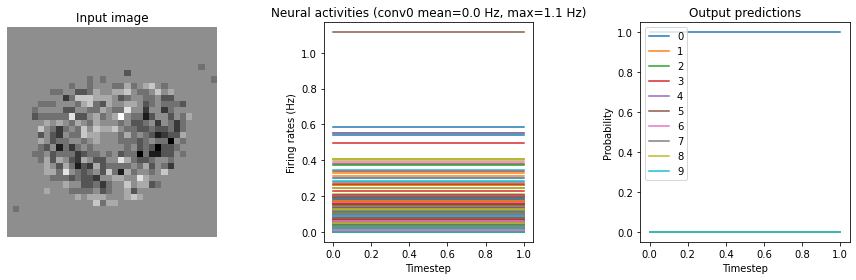

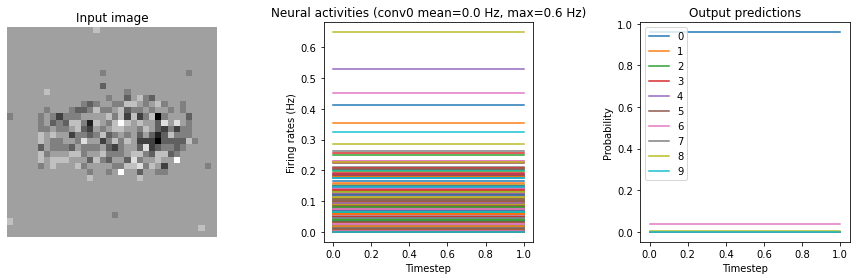

In [ ]:
run_network(activation=nengo.RectifiedLinear(), n_steps=2)

/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: Layer type ConvLSTM2D does not have a registered converter. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d_1.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling2d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"


Test Accuracy: 14.20%


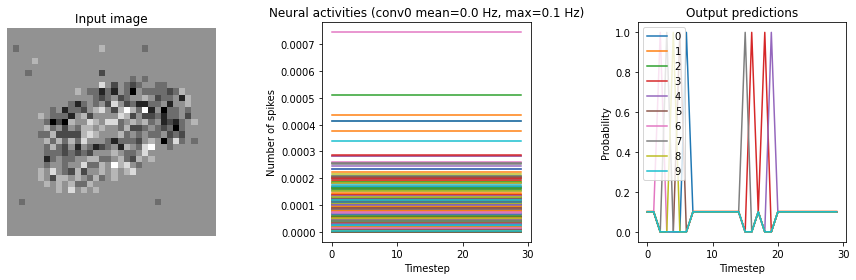

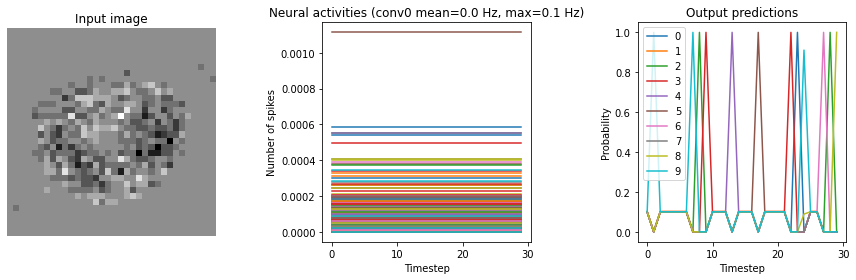

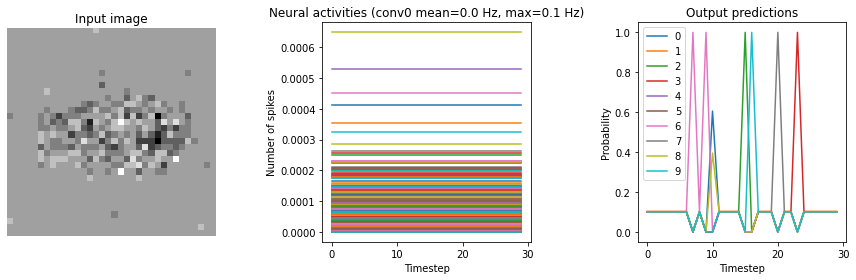

In [ ]:
run_network(activation=nengo.SpikingRectifiedLinear(), n_steps=30)

Synapse=0.001


/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: Layer type ConvLSTM2D does not have a registered converter. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d_1.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling2d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"


Test Accuracy: 23.98%


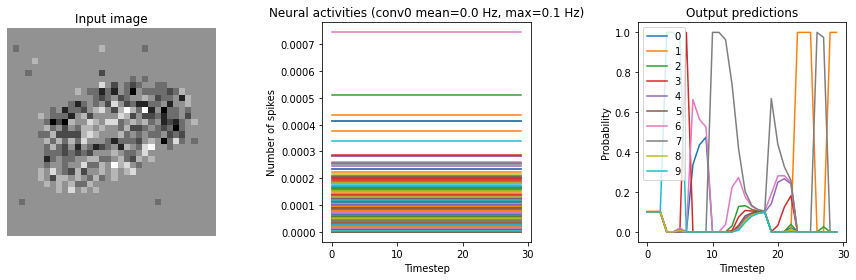

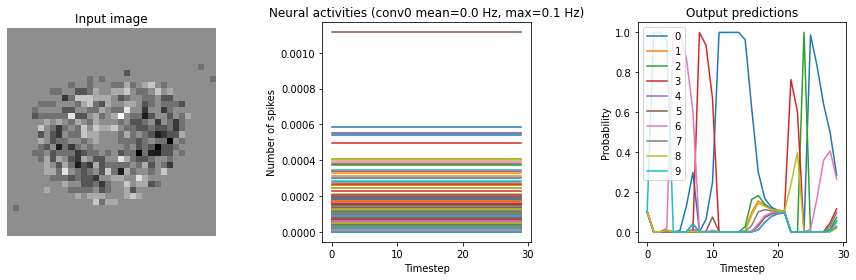

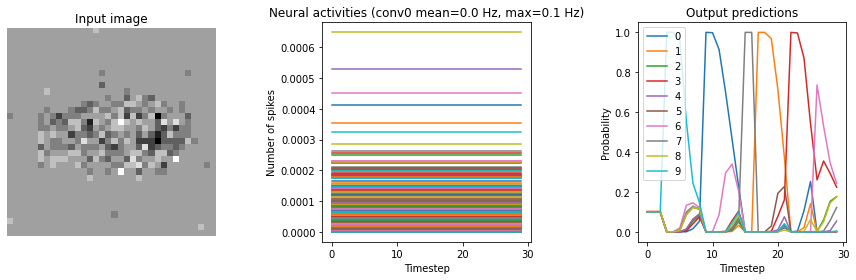

Synapse=0.005


/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: Layer type ConvLSTM2D does not have a registered converter. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d_1.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling2d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"


Test Accuracy: 34.82%


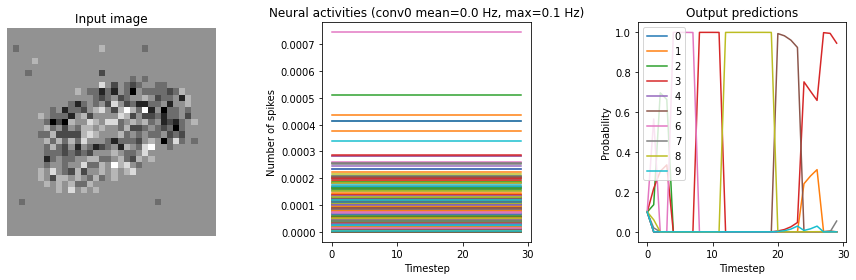

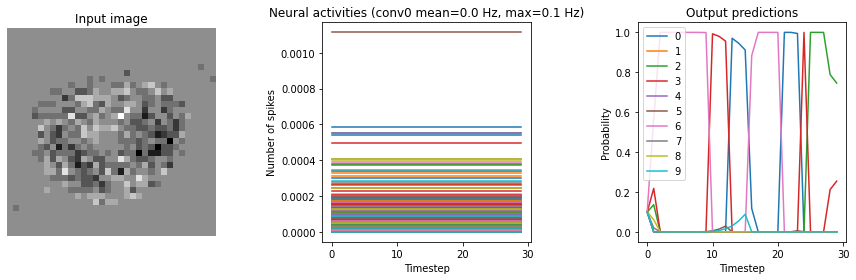

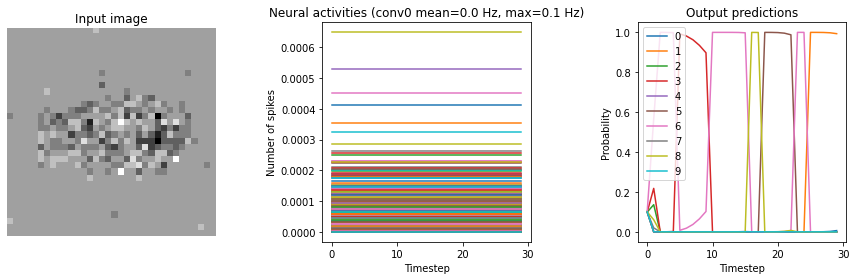

Synapse=0.010


/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: Layer type ConvLSTM2D does not have a registered converter. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d_1.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling2d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"


Test Accuracy: 40.12%


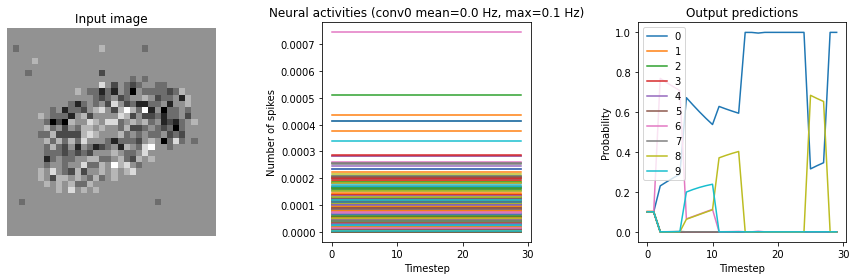

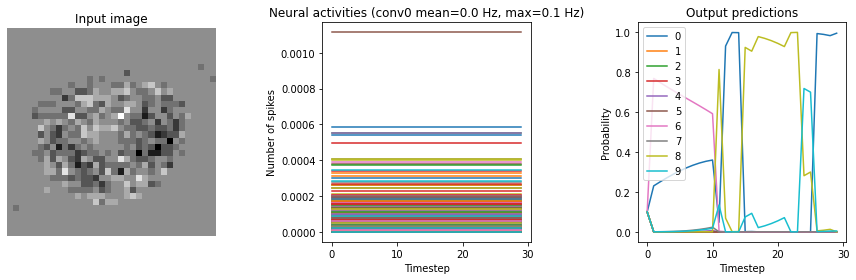

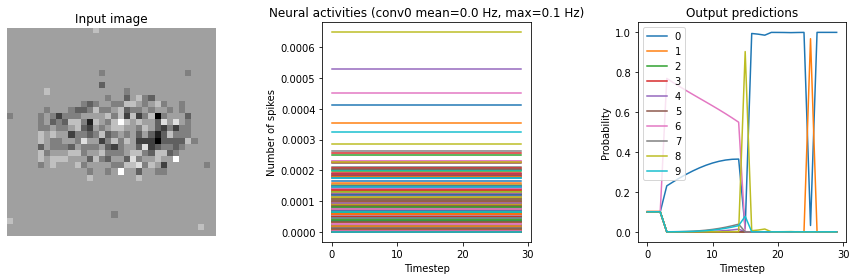

In [ ]:
for s in [0.001, 0.005, 0.010]:
    print(f"Synapse={s:.3f}")
    run_network(
        activation=nengo.SpikingRectifiedLinear(),
        synapse=s,
        n_steps=30
    )
    plt.show()

Synapse=0.010


/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: Layer type ConvLSTM2D does not have a registered converter. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d_1.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling2d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"


Test Accuracy: 33.94%


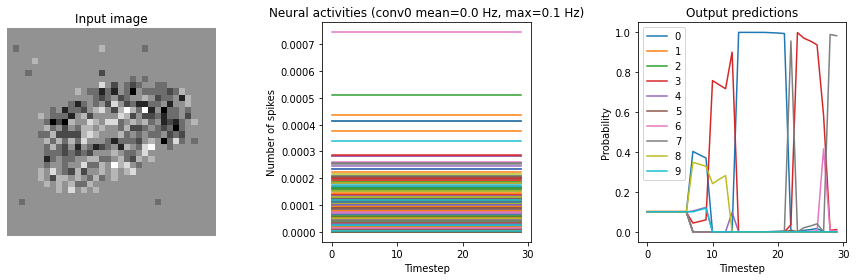

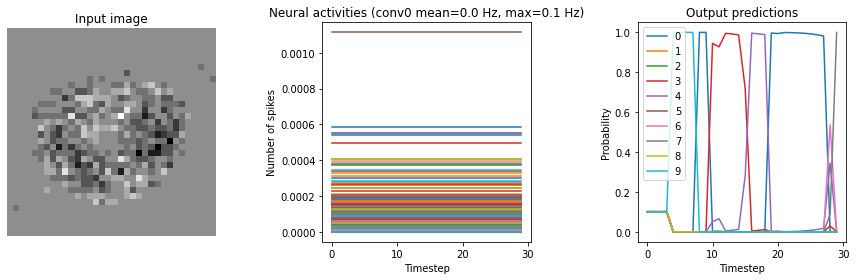

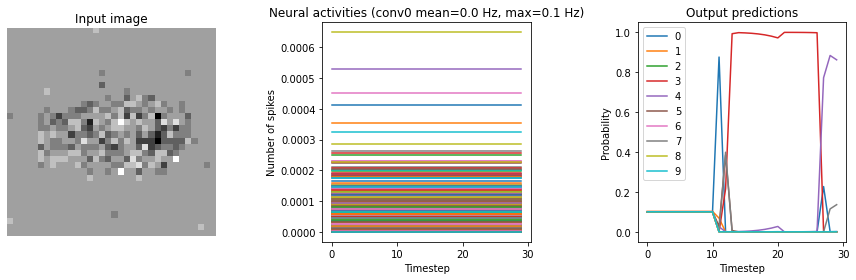

Synapse=0.055


/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: Layer type ConvLSTM2D does not have a registered converter. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d_1.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling2d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"


Test Accuracy: 54.20%


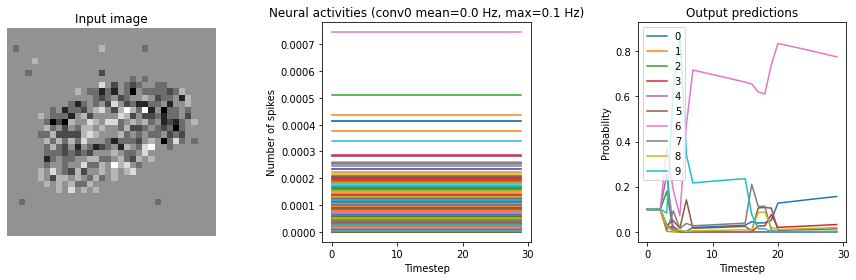

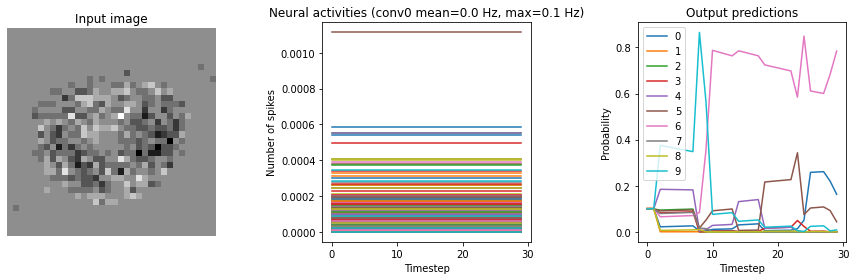

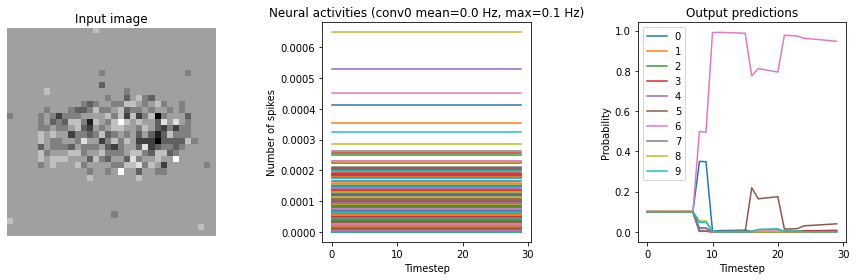

Synapse=0.100


/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: Layer type ConvLSTM2D does not have a registered converter. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d_1.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling2d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"


Test Accuracy: 54.14%


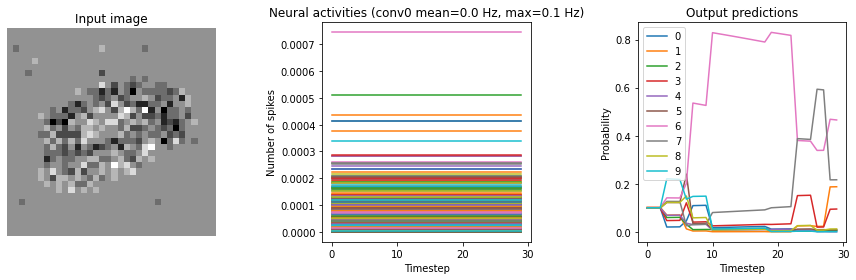

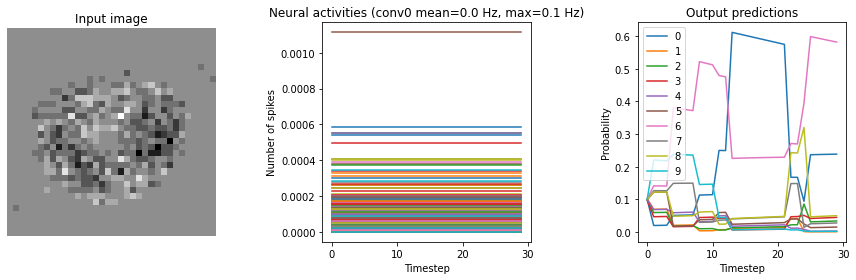

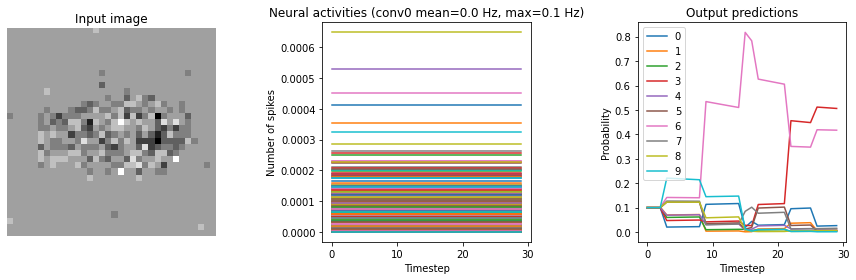

In [ ]:
for s in [0.010, 0.055, 0.100]:
    print(f"Synapse={s:.3f}")
    run_network(
        activation=nengo.SpikingRectifiedLinear(),
        synapse=s,
        n_steps=30
    )
    plt.show()

Scale=20


/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: Layer type ConvLSTM2D does not have a registered converter. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d_1.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling2d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"


Test Accuracy: 96.26%


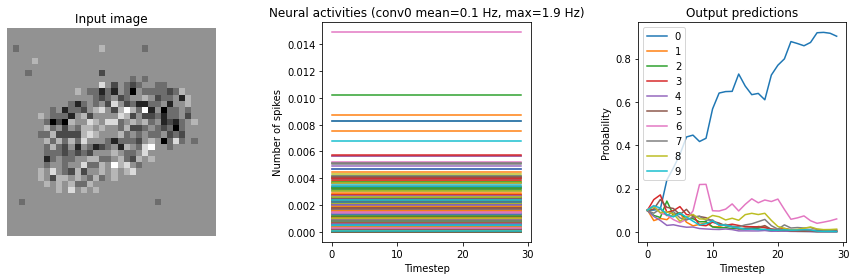

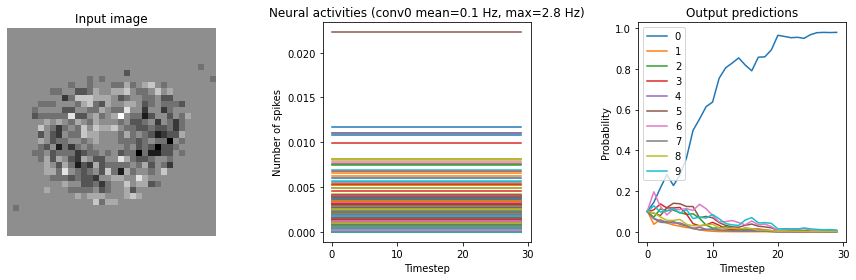

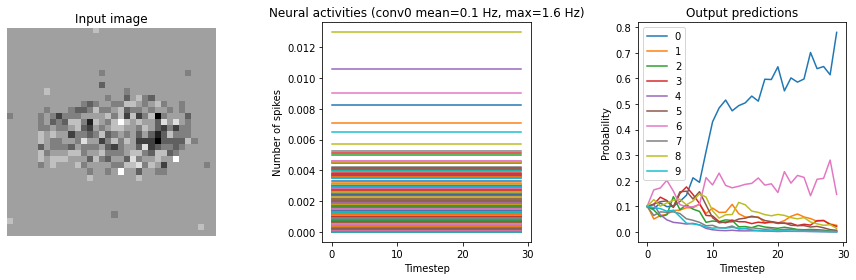

Scale=50


/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: Layer type ConvLSTM2D does not have a registered converter. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d_1.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling2d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"


Test Accuracy: 96.86%


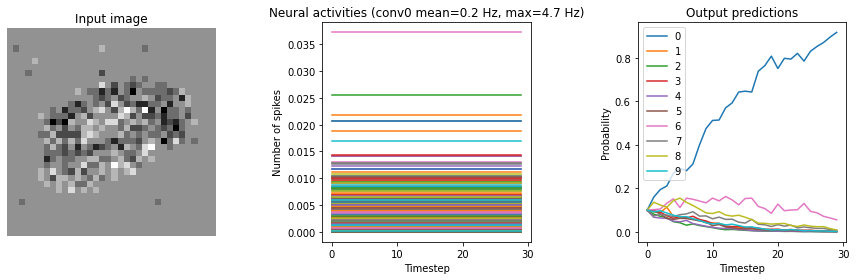

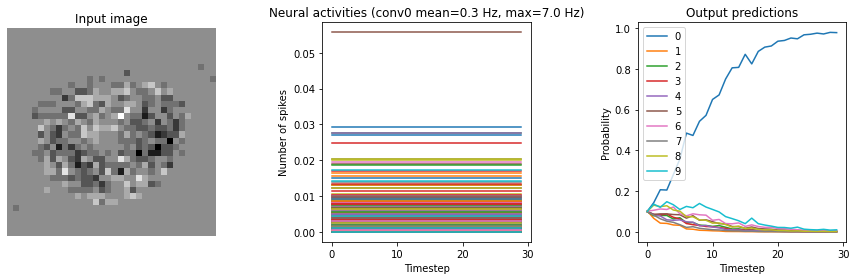

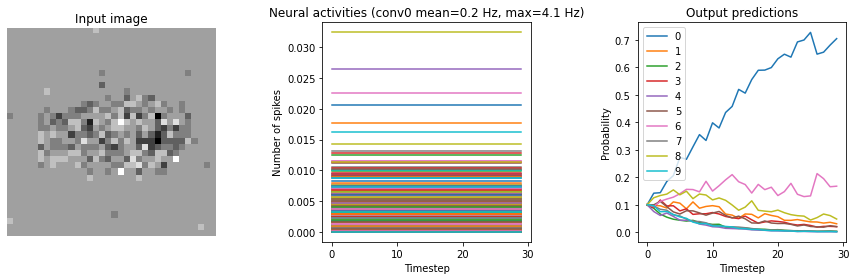

Scale=100


/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: Layer type ConvLSTM2D does not have a registered converter. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d_1.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling2d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"


Test Accuracy: 96.82%


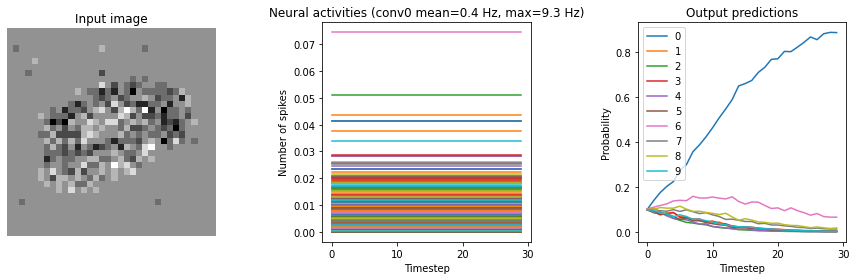

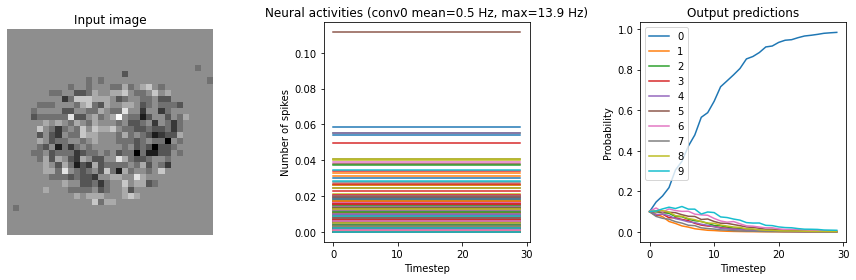

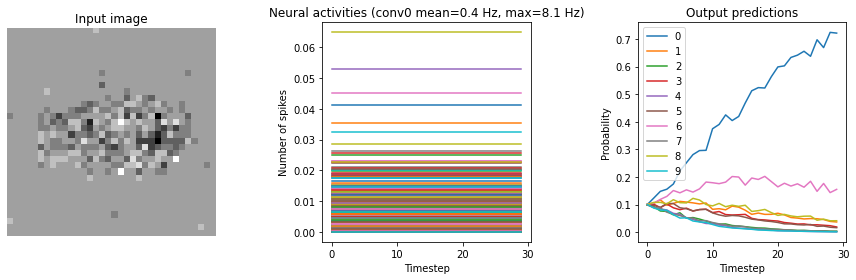

In [ ]:
for scale in [20, 50, 100]:
    print(f"Scale={scale}")
    run_network(
        activation=nengo.SpikingRectifiedLinear(),
        scale_firing_rates=scale,
        synapse=0.05,
        n_steps=30
    )
    plt.show()

Test accuracy: 94.80%


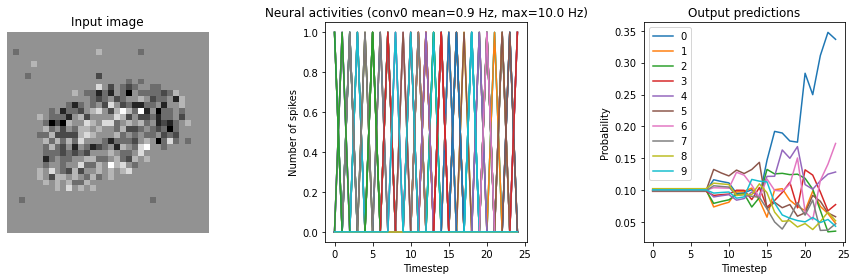

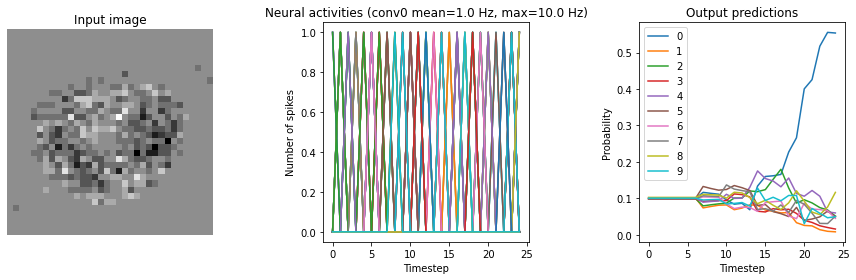

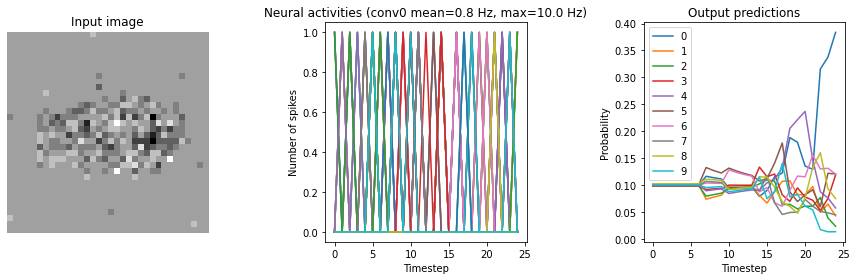

In [ ]:
run_network(
        activation=nengo.SpikingRectifiedLinear(),
        scale_firing_rates=150,
        synapse=0.006,
        n_steps=25
    )

#### results

In [ ]:
activation = nengo.SpikingRectifiedLinear()
scale_firing_rates = 150
synapse = 0.006
n_steps = 30
params_file = "keras_to_snn_params"

nengo_converter = nengo_dl.Converter(
    model,
    swap_activations={tf.nn.relu: activation},
    scale_firing_rates=scale_firing_rates,
    synapse=synapse,
    max_to_avg_pool=True
)

with nengo_converter.net:
    nengo_dl.configure_settings(planner=nengo_dl.graph_optimizer.noop_planner)

# get input/output objects
nengo_input = nengo_converter.inputs[inp]
nengo_output = nengo_converter.outputs[out]

# # repeat inputs for some number of timesteps
x_test_flat_rep = np.repeat(x_test_flat, n_steps, axis=1)

# set some options to speed up simulation
with nengo_converter.net:
    nengo_dl.configure_settings(stateful=False)

# build network, load in trained weights, run inference on test images
with nengo_dl.Simulator(
    nengo_converter.net, minibatch_size=20, progress_bar=False
) as nengo_sim:
    nengo_sim.load_params(params_file)
    data = nengo_sim.predict({nengo_input: x_test_flat_rep})

# compute accuracy on test data, using output of network on
# last timestep
predictions = np.argmax(data[nengo_output][:, -1], axis=-1)
actual = np.argmax(y_test, axis=1)
accuracy = (predictions == actual).mean()
print(f"Test accuracy: {100 * accuracy:.2f}%")

Test accuracy: 96.24%


AttributeError: ignored

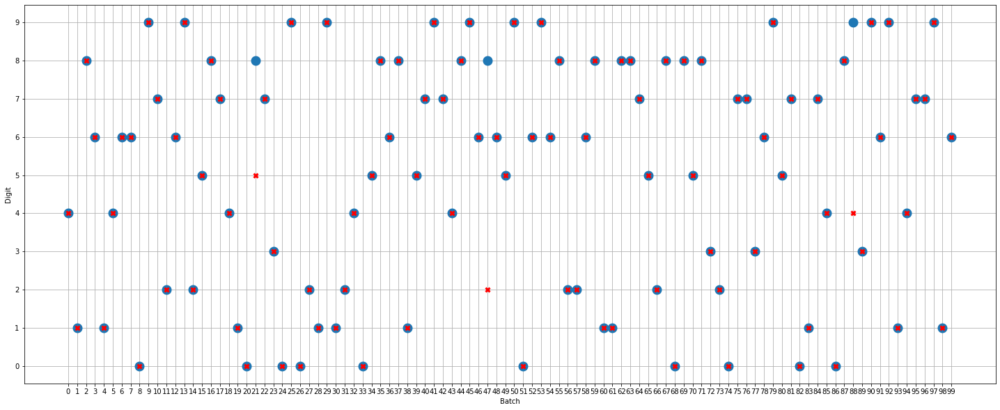

In [ ]:
import random

n_tests = 100

sampled_pred, sampled_act = zip(*random.sample(list(zip(predictions, actual)), n_tests))

plt.rcParams["figure.figsize"] = (25,10)
plt.plot(sampled_pred, 'o', mew=8, label="predictions")
plt.plot(sampled_act, 'rx', mew=3, label="actual")
plt.xlabel("Batch")
plt.xticks(list(range(0, n_tests)))
plt.ylabel("Digit")
plt.yticks(list(range(10)))
# plt.minorticks_on()
plt.grid(which="major")
# plt.grid(axis='x', which="minor")
for label in plt.xticks.get:
    label.set_visible(False)

plt.legend()
plt.show()
plt.rcParams["figure.figsize"] = plt.rcParamsDefault["figure.figsize"]

### Custom Conv LSTM

In [ ]:
from keras.layers.core import Dense, Activation, Dropout
from keras.layers.recurrent import LSTM
from keras.models import Sequential
from keras.layers import TimeDistributed, GRU
from keras.layers import Conv2D, MaxPooling2D, Flatten, Input, Reshape

def build_convnet(shape=(34, 34, 1)):
  inp = Input(shape)
  conv0 = Conv2D(128, (2,2), padding='same', activation=tf.nn.relu)(inp)
  pool0 = MaxPooling2D(pool_size=(2,2))(conv0)
  conv1 = Conv2D(256, (2,2), padding='same', activation=tf.nn.relu)(pool0)
  pool1 = MaxPooling2D(pool_size=(2,2))(conv1)
  conv2 = Conv2D(512, (2,2), padding='same', activation=tf.nn.relu)(pool1)
  pool2 = MaxPooling2D(pool_size=(2,2))(conv2)
  flat = Flatten()(pool2)
  model = tf.keras.Model(inputs=inp, outputs=flat)
  return model

nbout = 10
# Create our convnet with (34, 34, 1) input shape
convnet = build_convnet((34, 34, 1))
inp = Input(x_train_flat.shape[2])
reshape = Reshape([8,34,34,1])(inp)
# add the convnet with (8, 34, 34, 1) shape
dist = TimeDistributed(convnet)(reshape)
# here, you can also use GRU or LSTM
gru = GRU(64)(dist)
# and finally, we make a decision network
dense0 = Dense(1024, activation=tf.nn.relu)(gru)
dense1 = Dense(512, activation=tf.nn.relu)(dense0)
dense2 = Dense(128, activation=tf.nn.relu)(dense1)
dense3 = Dense(64, activation=tf.nn.relu)(dense2)
out = Dense(nbout)(dense3)
model = tf.keras.Model(inputs=inp, outputs=out)

In [ ]:
converter = nengo_dl.Converter(
    model,
    swap_activations={tf.nn.relu: tf.nn.relu},
    scale_firing_rates=1,
    synapse=None,
    max_to_avg_pool=True,
    temporal_model=True
)

# turn off the optimizer completely, as to not change the number of tensors
with converter.net:
    # nengo_dl.configure_settings(simplifications=[])
    nengo_dl.configure_settings(planner=nengo_dl.graph_optimizer.noop_planner)

with tf.device(gpu):
  do_training = True
  if do_training:
      with nengo_dl.Simulator(converter.net, minibatch_size=20) as sim:
          # run training
          sim.compile(
              optimizer=tf.optimizers.Adam(0.0001),
              loss=tf.losses.CategoricalCrossentropy(from_logits=True),
              metrics=[tf.metrics.categorical_accuracy],
          )
          sim.fit(
              {converter.inputs[inp]: x_train_flat},
              {converter.outputs[out]: y_train_time},
              validation_data=(
                  {converter.inputs[inp]: x_val_flat},
                  {converter.outputs[out]: y_val_time},
              ),
              epochs=15,
          )

          # save the parameters to file
          sim.save_params("keras_to_snn_params")
  else:
    with nengo_dl.Simulator(converter.net, minibatch_size=20) as sim:
      # download pretrained weights
      sim.load_params("keras_to_snn_params")
      print("Loaded pretrained weights")

del x_train_flat
del x_val_flat
del y_train_time
del y_val_time

ValidationError: ignored

In [ ]:
run_network(activation=nengo.RectifiedLinear(), n_steps=2)

TypeError: ignored

/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: Layer type ConvLSTM2D does not have a registered converter. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d_1.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling2d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"


Test Accuracy: 14.20%


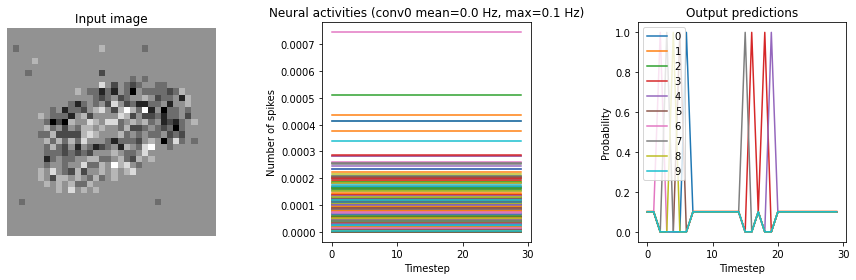

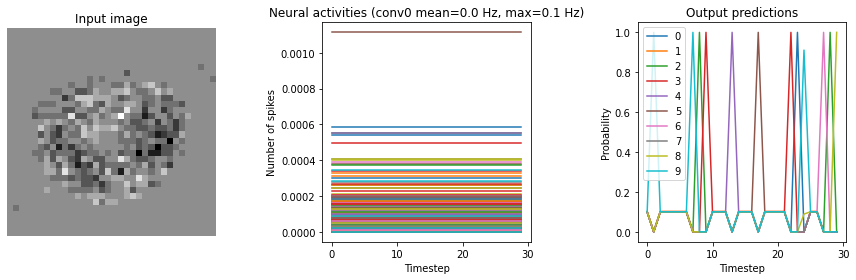

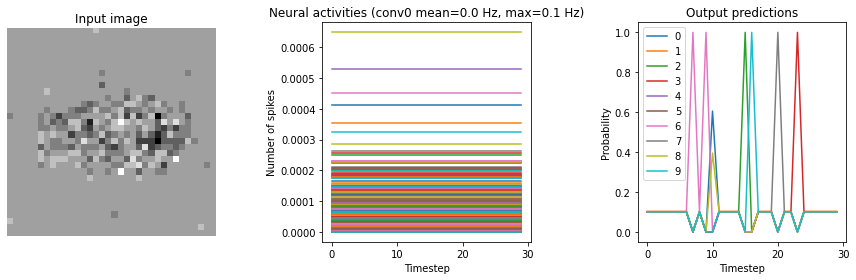

In [ ]:
run_network(activation=nengo.SpikingRectifiedLinear(), n_steps=30)

Synapse=0.001


/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: Layer type ConvLSTM2D does not have a registered converter. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d_1.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling2d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"


Test Accuracy: 23.98%


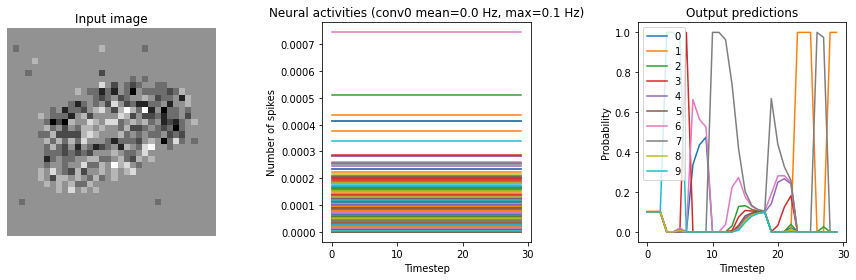

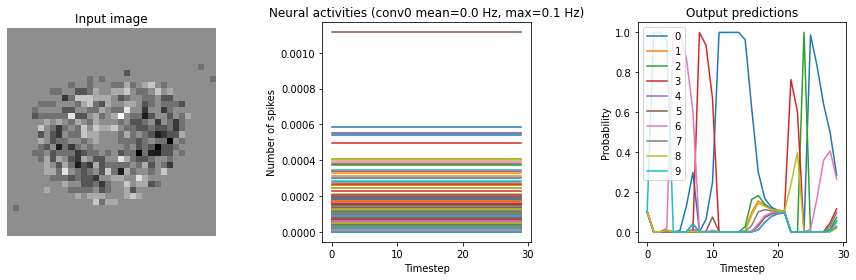

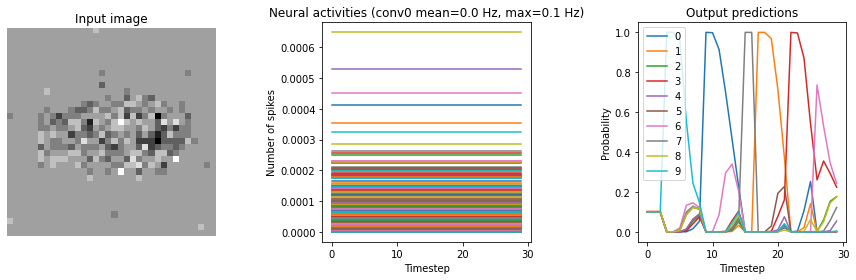

Synapse=0.005


/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: Layer type ConvLSTM2D does not have a registered converter. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d_1.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling2d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"


Test Accuracy: 34.82%


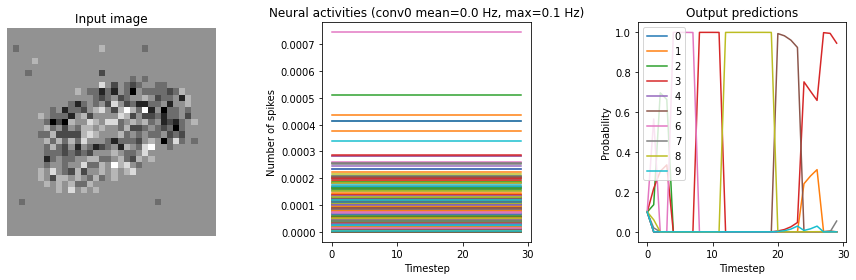

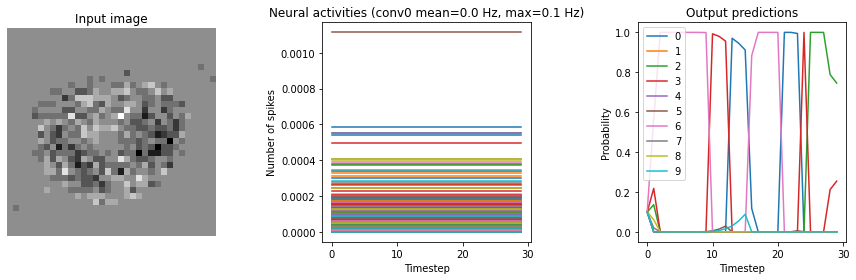

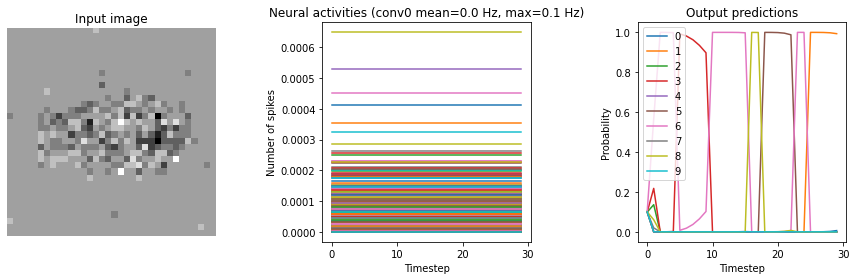

Synapse=0.010


/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: Layer type ConvLSTM2D does not have a registered converter. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d_1.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling2d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"


Test Accuracy: 40.12%


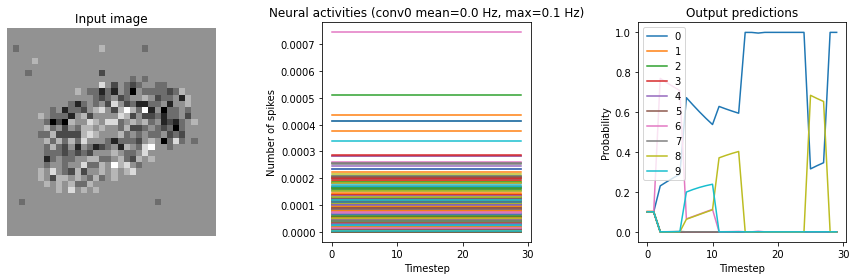

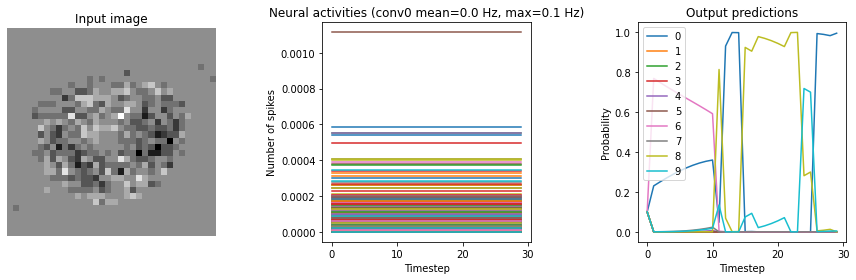

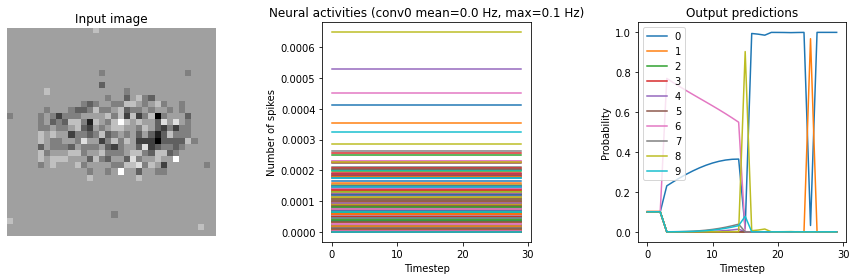

In [ ]:
for s in [0.001, 0.005, 0.010]:
    print(f"Synapse={s:.3f}")
    run_network(
        activation=nengo.SpikingRectifiedLinear(),
        synapse=s,
        n_steps=30
    )
    plt.show()

Synapse=0.010


/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: Layer type ConvLSTM2D does not have a registered converter. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d_1.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling2d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"


Test Accuracy: 33.94%


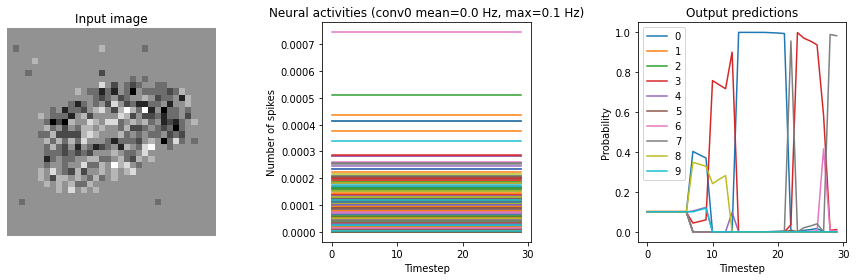

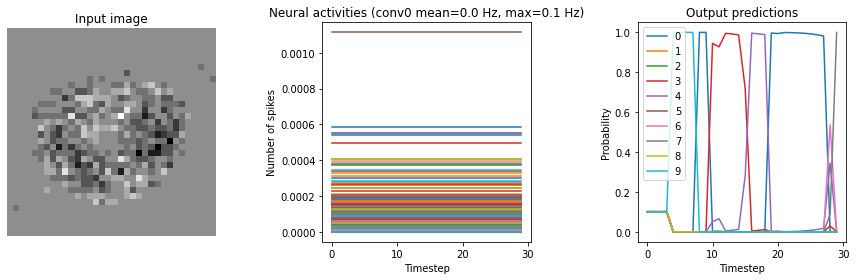

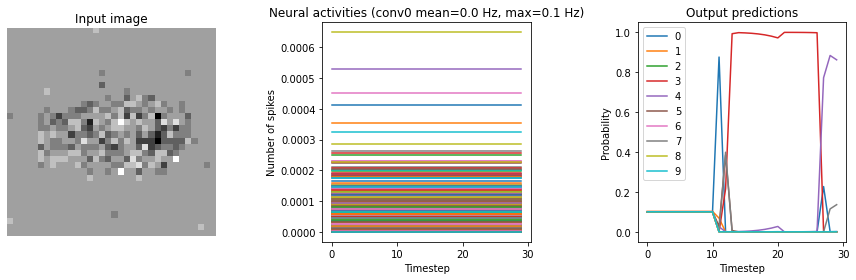

Synapse=0.055


/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: Layer type ConvLSTM2D does not have a registered converter. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d_1.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling2d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"


Test Accuracy: 54.20%


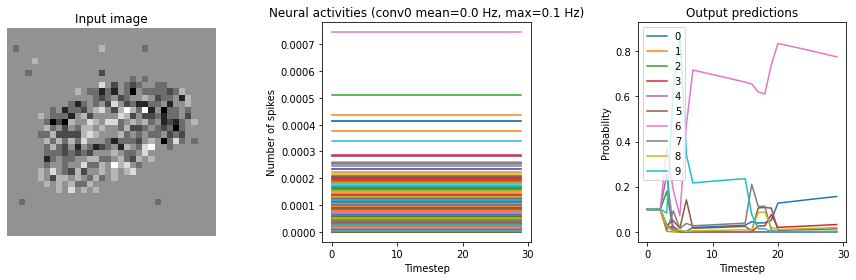

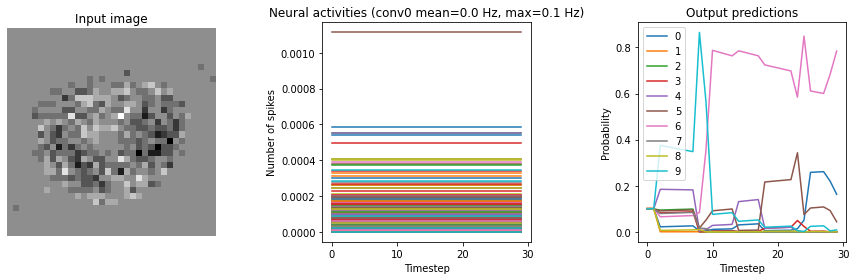

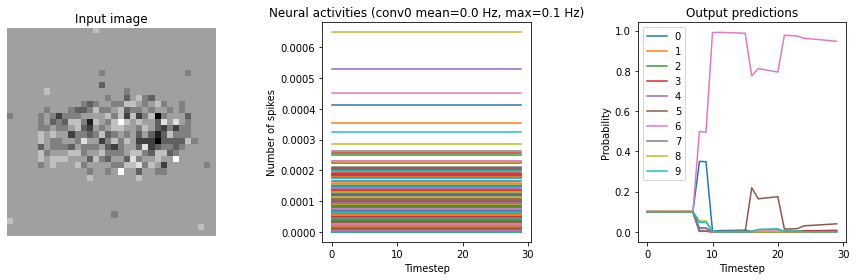

Synapse=0.100


/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: Layer type ConvLSTM2D does not have a registered converter. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d_1.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling2d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"


Test Accuracy: 54.14%


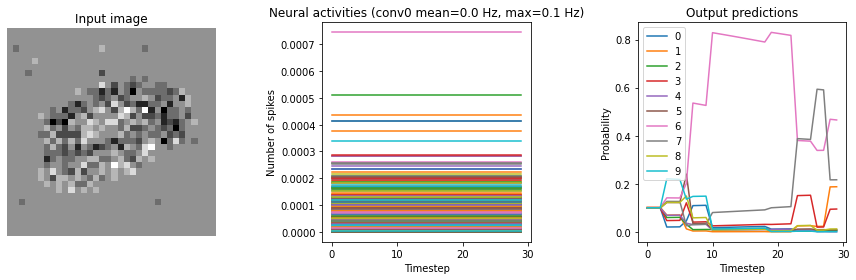

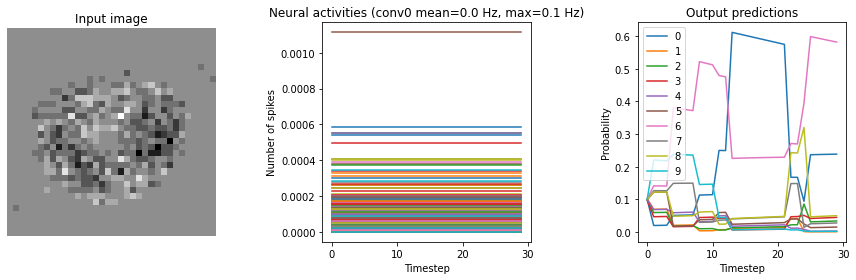

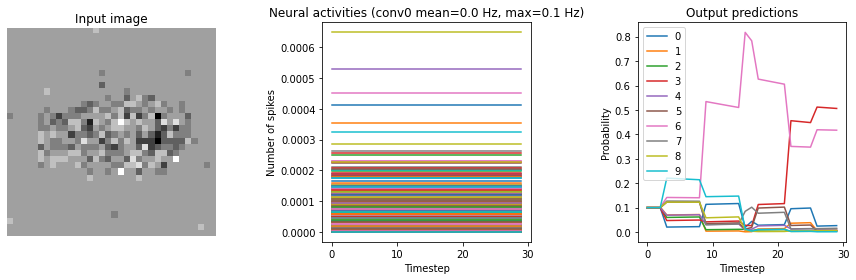

In [ ]:
for s in [0.010, 0.055, 0.100]:
    print(f"Synapse={s:.3f}")
    run_network(
        activation=nengo.SpikingRectifiedLinear(),
        synapse=s,
        n_steps=30
    )
    plt.show()

Scale=20


/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: Layer type ConvLSTM2D does not have a registered converter. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d_1.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling2d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"


Test Accuracy: 96.26%


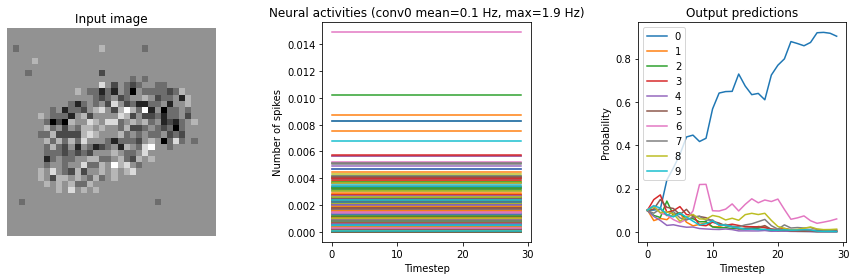

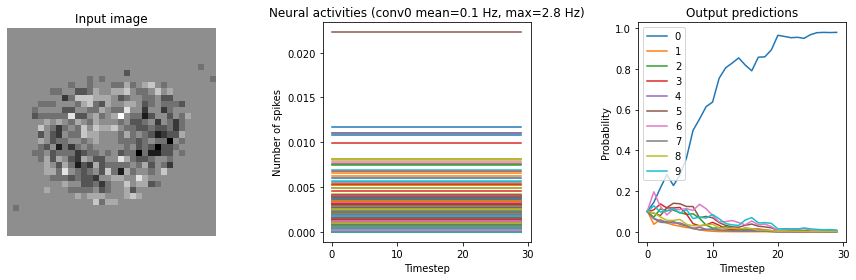

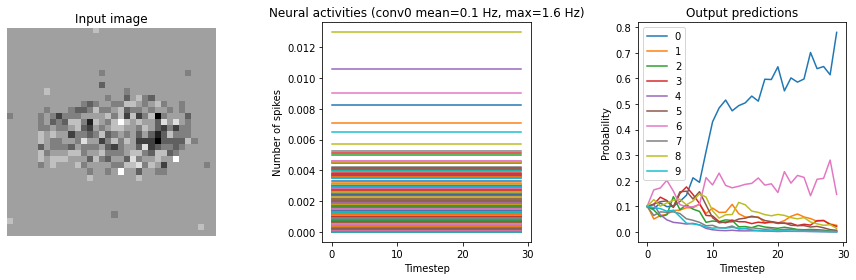

Scale=50


/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: Layer type ConvLSTM2D does not have a registered converter. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d_1.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling2d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"


Test Accuracy: 96.86%


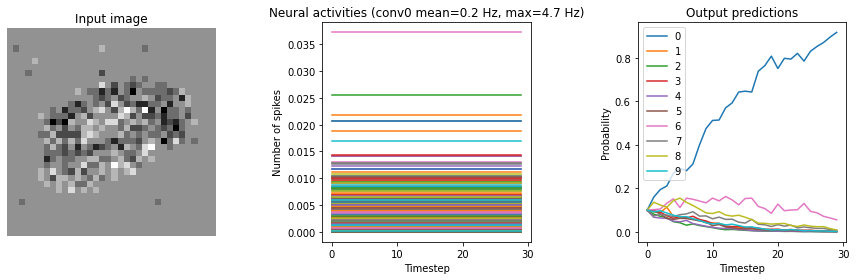

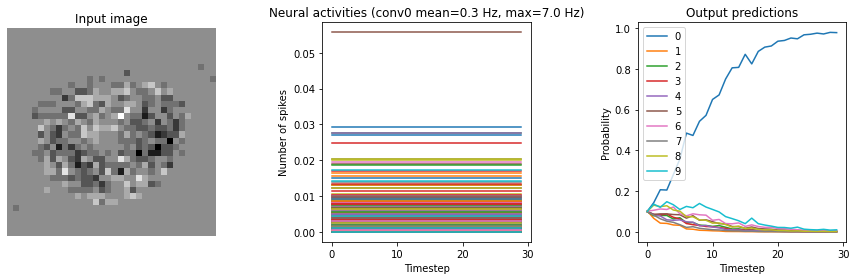

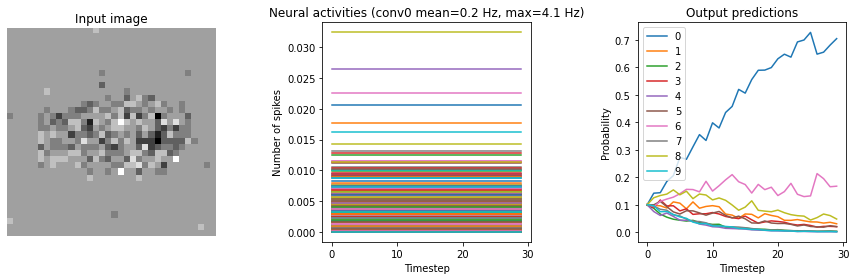

Scale=100


/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: Layer type ConvLSTM2D does not have a registered converter. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling3d_1.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: max_pooling2d.padding has value same != valid, which is not supported. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"


Test Accuracy: 96.82%


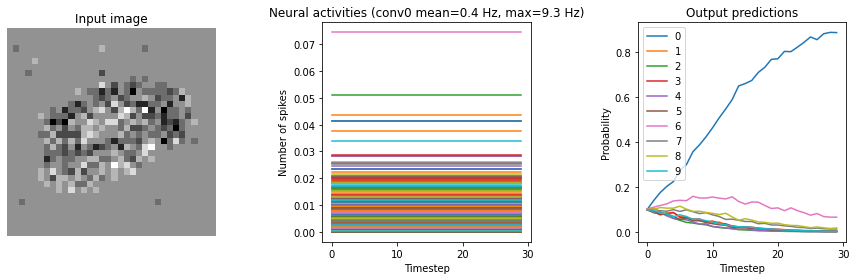

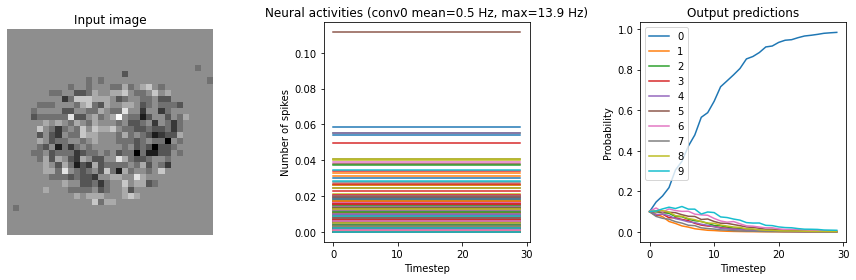

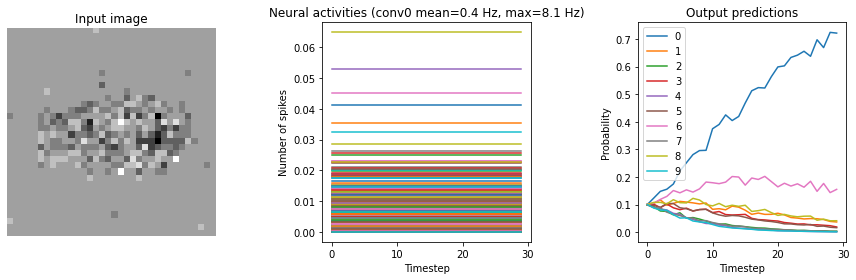

In [ ]:
for scale in [20, 50, 100]:
    print(f"Scale={scale}")
    run_network(
        activation=nengo.SpikingRectifiedLinear(),
        scale_firing_rates=scale,
        synapse=0.05,
        n_steps=30
    )
    plt.show()

Test accuracy: 94.80%


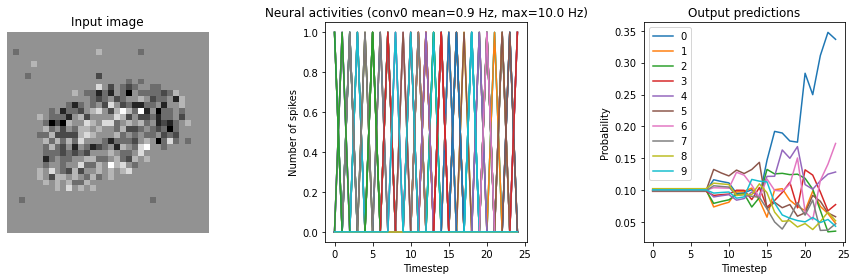

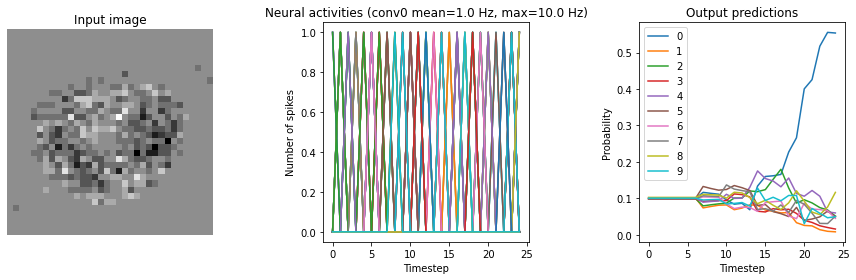

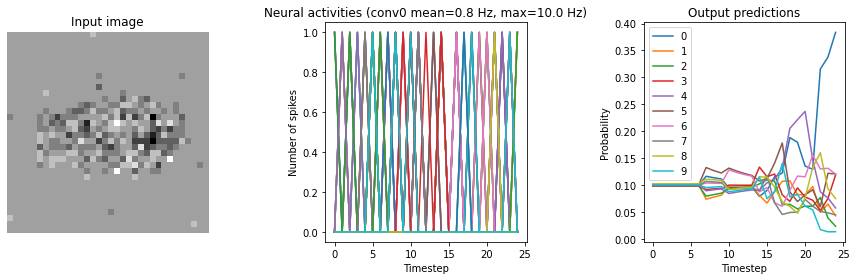

In [ ]:
run_network(
        activation=nengo.SpikingRectifiedLinear(),
        scale_firing_rates=150,
        synapse=0.006,
        n_steps=25
    )

#### results

In [ ]:
activation = nengo.SpikingRectifiedLinear()
scale_firing_rates = 150
synapse = 0.006
n_steps = 30
params_file = "keras_to_snn_params"

nengo_converter = nengo_dl.Converter(
    model,
    swap_activations={tf.nn.relu: activation},
    scale_firing_rates=scale_firing_rates,
    synapse=synapse,
    max_to_avg_pool=True
)

with nengo_converter.net:
    nengo_dl.configure_settings(planner=nengo_dl.graph_optimizer.noop_planner)

# get input/output objects
nengo_input = nengo_converter.inputs[inp]
nengo_output = nengo_converter.outputs[out]

# # repeat inputs for some number of timesteps
x_test_flat_rep = np.repeat(x_test_flat, n_steps, axis=1)

# set some options to speed up simulation
with nengo_converter.net:
    nengo_dl.configure_settings(stateful=False)

# build network, load in trained weights, run inference on test images
with nengo_dl.Simulator(
    nengo_converter.net, minibatch_size=20, progress_bar=False
) as nengo_sim:
    nengo_sim.load_params(params_file)
    data = nengo_sim.predict({nengo_input: x_test_flat_rep})

# compute accuracy on test data, using output of network on
# last timestep
predictions = np.argmax(data[nengo_output][:, -1], axis=-1)
actual = np.argmax(y_test, axis=1)
accuracy = (predictions == actual).mean()
print(f"Test accuracy: {100 * accuracy:.2f}%")

Test accuracy: 96.24%


AttributeError: ignored

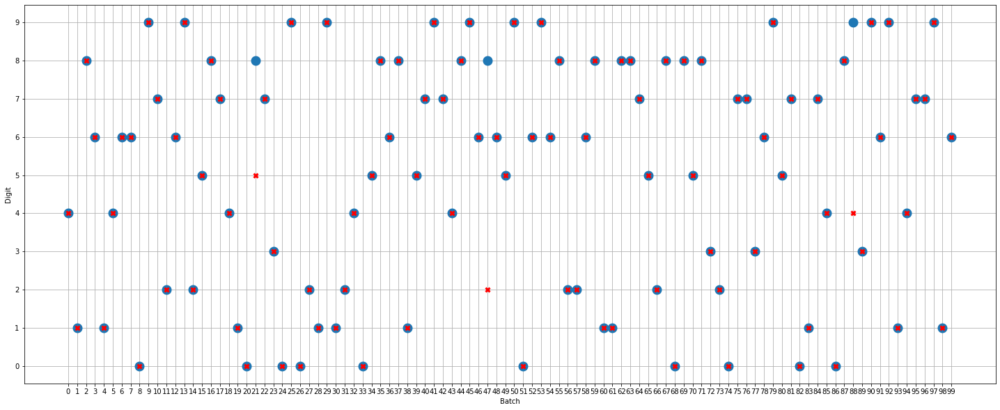

In [ ]:
import random

n_tests = 100

sampled_pred, sampled_act = zip(*random.sample(list(zip(predictions, actual)), n_tests))

plt.rcParams["figure.figsize"] = (25,10)
plt.plot(sampled_pred, 'o', mew=8, label="predictions")
plt.plot(sampled_act, 'rx', mew=3, label="actual")
plt.xlabel("Batch")
plt.xticks(list(range(0, n_tests)))
plt.ylabel("Digit")
plt.yticks(list(range(10)))
# plt.minorticks_on()
plt.grid(which="major")
# plt.grid(axis='x', which="minor")
for label in plt.xticks.get:
    label.set_visible(False)

plt.legend()
plt.show()
plt.rcParams["figure.figsize"] = plt.rcParamsDefault["figure.figsize"]

### LMU Network

In [ ]:
from nengo.utils.filter_design import cont2discrete

class LMUCell(nengo.Network):
    def __init__(self, units, order, theta, input_d, activation, **kwargs):
        super().__init__(**kwargs)

        # compute the A and B matrices according to the LMU's mathematical derivation
        # (see the paper for details)
        Q = np.arange(order, dtype=np.float64)
        R = (2 * Q + 1)[:, None] / theta
        j, i = np.meshgrid(Q, Q)

        A = np.where(i < j, -1, (-1.0) ** (i - j + 1)) * R
        B = (-1.0) ** Q[:, None] * R
        C = np.ones((1, order))
        D = np.zeros((1,))

        A, B, _, _, _ = cont2discrete((A, B, C, D), dt=1.0, method="zoh")

        with self:
            nengo_dl.configure_settings(trainable=None)

            # create objects corresponding to the x/u/m/h variables in the above diagram
            self.x = nengo.Node(size_in=input_d)
            self.u = nengo.Node(size_in=1)
            self.m = nengo.Node(size_in=order)
            # self.h = nengo_dl.TensorNode(activation, shape_in=(units,), pass_time=False)
            # nengo.RegularSpiking(nengo.Tanh(tau_ref=1)),
            self.h = nengo.Ensemble(units,
                        1,
                        neuron_type=activation,
                        gain=np.ones(units),
                        bias=np.zeros(units)).neurons

            # compute u_t from the above diagram. we have removed e_h and e_m as they
            # are not needed in this task.
            nengo.Connection(
                self.x, self.u, transform=np.ones((1, input_d)), synapse=None
            )

            # compute m_t
            # in this implementation we'll make A and B non-trainable, but they
            # could also be optimized in the same way as the other parameters.
            # note that setting synapse=0 (versus synapse=None) adds a one-timestep
            # delay, so we can think of any connections with synapse=0 as representing
            # value_{t-1}.
            conn_A = nengo.Connection(self.m, self.m, transform=A, synapse=0)
            self.config[conn_A].trainable = False
            conn_B = nengo.Connection(self.u, self.m, transform=B, synapse=None)
            self.config[conn_B].trainable = False

            # compute h_t
            nengo.Connection(
                self.x, self.h, transform=nengo_dl.dists.Glorot(), synapse=None
            )
            nengo.Connection(
                self.h, self.h, transform=nengo_dl.dists.Glorot(), synapse=0
            )
            nengo.Connection(
                self.m,
                self.h,
                transform=nengo_dl.dists.Glorot(),
                synapse=None,
            )

In [ ]:
with nengo.Network(seed=seed) as net:
    # remove some unnecessary features to speed up the training
    nengo_dl.configure_settings(
        trainable=None,
        stateful=False,
        keep_history=False,
    )

    # input node
    inp = nengo.Node(np.zeros(x_train_flat.shape[2]))

    # lmu cell
    lmu = LMUCell(
        units=212,
        order=256,
        theta=x_train_flat.shape[1],
        input_d=x_train_flat.shape[2],
        activation=nengo.Tanh(tau_ref=2)
        # activation=nengo.RectifiedLinear()
    )
    conn = nengo.Connection(inp, lmu.x, synapse=None)
    net.config[conn].trainable = False

    # dense linear readout
    out = nengo.Node(size_in=10)
    nengo.Connection(lmu.h, out, transform=nengo_dl.dists.Glorot(), synapse=None)

    # record output. note that we set keep_history=False above, so this will
    # only record the output on the last timestep (which is all we need
    # on this task)
    p = nengo.Probe(out)

In [ ]:
do_training = True

with nengo_dl.Simulator(net, minibatch_size=16, unroll_simulation=1) as sim:
    sim.compile(
        loss=tf.losses.CategoricalCrossentropy(from_logits=True),
        optimizer=tf.optimizers.Adam(),
        metrics=["accuracy"],
    )

    data = sim.predict(np.repeat(x_test_flat, 8, axis=1))
    # compute accuracy on test data, using output of network on
    # last timestep
    predictions = np.argmax(data[next(iter(data))][:, -1], axis=-1)
    actual = np.argmax(y_test, axis=1)
    matches = np.array([predictions[i] == actual[i] for i in range(len(predictions))])
    print(f"Test Accuracy: {100 * matches.mean():.2f}%")

    # test_acc = sim.evaluate(x_test_flat, y_test_time, verbose=0)["probe_accuracy"]
    # print(f"Initial test accuracy: {test_acc * 100:.2f}%")

    if do_training:
        sim.fit(x_train_flat, y_train_time, validation_data=(x_val_flat, y_val_time), epochs=10)
        sim.save_params("lmu_params")
    else:
        sim.load_params("lmu_params")


    data = sim.predict(np.repeat(x_test_flat, 8, axis=1))
    # compute accuracy on test data, using output of network on
    # last timestep
    predictions = np.argmax(data[next(iter(data))][:, -1], axis=-1)
    actual = np.argmax(y_test, axis=1)
    matches = np.array([predictions[i] == actual[i] for i in range(len(predictions))])
    print(f"Test Accuracy: {100 * matches.mean():.2f}%")

    # test_acc = sim.evaluate(test_images, test_labels, verbose=0)["probe_accuracy"]
    # print(f"Final test accuracy: {test_acc * 100:.2f}")

Build finished in 0:00:00                                                      
Optimization finished in 0:00:00                                               
Construction finished in 0:00:00                                               


/usr/local/lib/python3.7/dist-packages/nengo_dl/simulator.py:1922: UserWarning: Number of elements in input data (5000) is not evenly divisible by Simulator.minibatch_size (16); input data will be truncated.
  f"Number of elements in input data ({data_batch}) is not "


Test Accuracy: 14.24%


/usr/local/lib/python3.7/dist-packages/nengo_dl/simulator.py:1025: UserWarning: Running for one timestep, but the network contains synaptic filters (which will introduce at least a one-timestep delay); did you mean to set synapse=None?
  "Running for one timestep, but the network contains "


Epoch 1/10
1500/1500 [==============================] - 18s 9ms/step - loss: 0.4837 - probe_loss: 0.4837 - probe_accuracy: 0.8510 - val_loss: 0.3652 - val_probe_loss: 0.3652 - val_probe_accuracy: 0.8797
Epoch 2/10
1500/1500 [==============================] - 13s 9ms/step - loss: 0.1756 - probe_loss: 0.1756 - probe_accuracy: 0.9482 - val_loss: 0.3257 - val_probe_loss: 0.3257 - val_probe_accuracy: 0.8920
Epoch 3/10
1500/1500 [==============================] - 13s 9ms/step - loss: 0.0620 - probe_loss: 0.0620 - probe_accuracy: 0.9855 - val_loss: 0.3586 - val_probe_loss: 0.3586 - val_probe_accuracy: 0.8903
Epoch 4/10
1500/1500 [==============================] - 13s 9ms/step - loss: 0.0242 - probe_loss: 0.0242 - probe_accuracy: 0.9960 - val_loss: 0.3477 - val_probe_loss: 0.3477 - val_probe_accuracy: 0.8992
Epoch 5/10
1500/1500 [==============================] - 13s 9ms/step - loss: 0.0057 - probe_loss: 0.0057 - probe_accuracy: 0.9995 - val_loss: 0.3678 - val_probe_loss: 0.3678 - val_probe_ac

In [ ]:
sf=10

with nengo.Network(seed=seed) as net:
    # remove some unnecessary features to speed up the training
    nengo_dl.configure_settings(
        trainable=None,
        stateful=False,
        keep_history=False,
    )

    # input node
    inp = nengo.Node(np.zeros(x_train_flat.shape[2]))

    # lmu cell
    lmu = LMUCell(
        units=212,
        order=256,
        theta=x_train_flat.shape[1],
        input_d=x_train_flat.shape[2],
        activation=nengo.RegularSpiking(nengo.Tanh(tau_ref=1), amplitude=1/sf)
        # activation=nengo.SpikingRectifiedLinear(amplitude=1)
    )
    conn = nengo.Connection(inp, lmu.x, synapse=None)
    net.config[conn].trainable = False

    # dense linear readout
    out = nengo.Node(size_in=10)
    nengo.Connection(lmu.h, out, transform=nengo_dl.dists.Glorot(), synapse=0.08)

    # record output. note that we set keep_history=False above, so this will
    # only record the output on the last timestep (which is all we need
    # on this task)
    p = nengo.Probe(out)

with nengo_dl.Simulator(net, minibatch_size=16) as sim:
    sim.load_params("lmu_params")
    data = sim.predict(np.repeat(x_test_flat, 30, axis=1)*sf)
    # compute accuracy on test data, using output of network on
    # last timestep
    predictions = np.argmax(data[next(iter(data))][:, -1], axis=-1)
    actual = np.argmax(y_test, axis=1)
    matches = np.array([predictions[i] == actual[i] for i in range(len(predictions))])
    print(f"Test Accuracy: {100 * matches.mean():.2f}%")

Build finished in 0:00:00                                                      
Optimization finished in 0:00:00                                               
Construction finished in 0:00:00                                               


/usr/local/lib/python3.7/dist-packages/nengo_dl/simulator.py:1922: UserWarning: Number of elements in input data (5000) is not evenly divisible by Simulator.minibatch_size (16); input data will be truncated.
  f"Number of elements in input data ({data_batch}) is not "


Test Accuracy: 24.44%


In [ ]:
sf=10

with nengo.Network(seed=seed) as net:
    # remove some unnecessary features to speed up the training
    nengo_dl.configure_settings(
        trainable=None,
        stateful=False,
        keep_history=False,
    )

    # input node
    inp = nengo.Node(np.zeros(x_train_flat.shape[2]))

    # lmu cell
    lmu = LMUCell(
        units=212,
        order=256,
        theta=x_train_flat.shape[1],
        input_d=x_train_flat.shape[2],
        activation=nengo.RegularSpiking(nengo.Tanh(tau_ref=1), amplitude=1/sf)
        # activation=nengo.SpikingRectifiedLinear(amplitude=1)
    )
    conn = nengo.Connection(inp, lmu.x, synapse=None)
    net.config[conn].trainable = False

    # dense linear readout
    out = nengo.Node(size_in=10)
    nengo.Connection(lmu.h, out, transform=nengo_dl.dists.Glorot(), synapse=0.08)

    # record output. note that we set keep_history=False above, so this will
    # only record the output on the last timestep (which is all we need
    # on this task)
    p = nengo.Probe(out)

with nengo_dl.Simulator(net, minibatch_size=16) as sim:
    sim.load_params("lmu_params")
    data = sim.predict(np.repeat(x_test_flat, 30, axis=1)*sf)
    # compute accuracy on test data, using output of network on
    # last timestep
    predictions = np.argmax(data[next(iter(data))][:, -1], axis=-1)
    actual = np.argmax(y_test, axis=1)
    matches = np.array([predictions[i] == actual[i] for i in range(len(predictions))])
    print(f"Test Accuracy: {100 * matches.mean():.2f}%")

Build finished in 0:00:00                                                      
Optimization finished in 0:00:00                                               
Construction finished in 0:00:00                                               


/usr/local/lib/python3.7/dist-packages/nengo_dl/simulator.py:1922: UserWarning: Number of elements in input data (5000) is not evenly divisible by Simulator.minibatch_size (16); input data will be truncated.
  f"Number of elements in input data ({data_batch}) is not "


Test Accuracy: 40.34%


In [ ]:
data[next(iter(data))]

(24000, 1, 9248)


In [ ]:
import tensorflow as tf
!pip install -q keras-lmu
import keras_lmu
from tensorflow.keras.layers import Input, Reshape, Flatten
from keras.layers.core import Dense


lmu_layer = keras_lmu.LMU(
    memory_d=3,
    order=256,
    theta=784,
    hidden_cell=tf.keras.layers.SimpleRNNCell(units=10),
)

inp = Input(x_train_flat.shape[1:])
# reshape = Reshape([8,34,34,1])(inp)
lmus = lmu_layer(inp)
# flat0 = Flatten()(lmus)
out = Dense(10)(lmus)

model = tf.keras.Model(inputs=inp, outputs=out)

In [ ]:
converter = nengo_dl.Converter(
    model,
    swap_activations={tf.nn.relu: tf.nn.relu},
    scale_firing_rates=1,
    synapse=None,
    max_to_avg_pool=True
)

# turn off the optimizer completely, as to not change the number of tensors
with converter.net:
    # nengo_dl.configure_settings(simplifications=[])
    nengo_dl.configure_settings(planner=nengo_dl.graph_optimizer.noop_planner)

with tf.device(gpu):
  do_training = True
  if do_training:
      with nengo_dl.Simulator(converter.net, minibatch_size=20) as sim:
          # run training
          sim.compile(
              optimizer=tf.optimizers.Adam(0.0001),
              loss=tf.losses.CategoricalCrossentropy(from_logits=True),
              metrics=[tf.metrics.categorical_accuracy],
          )
          sim.fit(
              {converter.inputs[inp]: x_train_flat},
              {converter.outputs[out]: y_train_time},
              validation_data=(
                  {converter.inputs[inp]: x_val_flat},
                  {converter.outputs[out]: y_val_time},
              ),
              epochs=15,
          )

          # save the parameters to file
          sim.save_params("keras_to_snn_params")
  else:
    with nengo_dl.Simulator(converter.net, minibatch_size=20) as sim:
      # download pretrained weights
      sim.load_params("keras_to_snn_params")
      print("Loaded pretrained weights")

del x_train_flat
del x_val_flat
del y_train_time
del y_val_time

Build finished in 0:00:00                                                      
Optimization finished in 0:00:00                                               
|#                        Constructing graph                          | 0:00:00


/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: Layer type LMU does not have a registered converter. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:141: UserWarning: swap_activations contained {<function relu at 0x7f0d7233c7a0>}, but there were no layers in the model with that activation type
  f"swap_activations contained {self.swap_activations.unused_keys()}, "


AssertionError: ignored

# DVS128 Gesture
https://gitlab.com/inivation/dv/dv-python#open-a-recording-made-with-dv

## Working with Data

### Saving Data

In [ ]:
!unzip -q /content/drive/MyDrive/DVS128Gesture/'DVS  Gesture dataset.zip' -d /content/datasets/DVS128Gesture
!mv /content/datasets/DVS128Gesture/'DVS  Gesture dataset' /content/datasets/DVS128Gesture/download

In [ ]:
!pip -q install spikingjelly
from spikingjelly.datasets.dvs128_gesture import DVS128Gesture

root_dir = "/content/datasets/DVS128Gesture"
train_set = DVS128Gesture(root_dir, train=True, data_type='frame', frames_number=20,split_by='number')
test_set = DVS128Gesture(root_dir, train=False, data_type='frame', frames_number=20,split_by='number')

The [/content/datasets/DVS128Gesture/download] directory for saving downloaded files already exists, check files...
Mkdir [/content/datasets/DVS128Gesture/extract].
Extract [/content/datasets/DVS128Gesture/download/DvsGesture.tar.gz] to [/content/datasets/DVS128Gesture/extract].
Mkdir [/content/datasets/DVS128Gesture/events_np].
Start to convert the origin data from [/content/datasets/DVS128Gesture/extract] to [/content/datasets/DVS128Gesture/events_np] in np.ndarray format.
Mkdir [('/content/datasets/DVS128Gesture/events_np/train', '/content/datasets/DVS128Gesture/events_np/test').
Mkdir ['4', '10', '8', '5', '9', '7', '3', '6', '1', '2', '0'] in [/content/datasets/DVS128Gesture/events_np/train] and ['4', '10', '8', '5', '9', '7', '3', '6', '1', '2', '0'] in [/content/datasets/DVS128Gesture/events_np/test].
Start the ThreadPoolExecutor with max workers = [4].
Start to split [/content/datasets/DVS128Gesture/extract/DvsGesture/user01_led.aedat] to samples.
Start to split [/content/datas

In [ ]:
import pickle
import shutil

open_file = open("/content/DVS_train.pkl", "wb")
pickle.dump(train_set, open_file)
open_file.close()

open_file = open("/content/DVS_test.pkl", "wb")
pickle.dump(test_set, open_file)
open_file.close()

shutil.make_archive("DVS128Gesture", 'zip', "/content/datasets/DVS128Gesture/frames_number_20_split_by_number/")

!mv /content/DVS_train.pkl /content/drive/MyDrive/DVS128Gesture
!mv /content/DVS_test.pkl /content/drive/MyDrive/DVS128Gesture
!mv DVS128Gesture.zip /content/drive/MyDrive/DVS128Gesture

### Loading Data

In [ ]:
!rm -rf /content/datasets
!mkdir /content/datasets
!mkdir /content/datasets/DVS128Gesture
!mkdir /content/datasets/DVS128Gesture/frames_number_20_split_by_number
!unzip -q /content/drive/MyDrive/DVS128Gesture/DVS128Gesture.zip -d /content/datasets/DVS128Gesture/frames_number_20_split_by_number
!cp /content/drive/MyDrive/DVS128Gesture/DVS_train.pkl /content/DVS_train.pkl
!cp /content/drive/MyDrive/DVS128Gesture/DVS_test.pkl /content/DVS_test.pkl

In [ ]:
import pickle
!pip -q install spikingjelly
from spikingjelly.datasets.dvs128_gesture import DVS128Gesture

open_file = open("/content/DVS_train.pkl", "rb")
train_set = pickle.load(open_file)
open_file.close()

open_file = open("/content/DVS_test.pkl", "rb")
test_set = pickle.load(open_file)
open_file.close()

In [ ]:
import numpy as np
from keras.utils import np_utils
from sklearn.model_selection import train_test_split

x_train = [frames for frames, _ in train_set]
y_train = [label for _, label in train_set]
x_test = [frames for frames, _ in test_set]
y_test = [label for _, label in test_set]

x_train = np.array(x_train)
train_set = x_train.astype('float32')
train_set -= np.mean(x_train)
train_set /= np.max(x_train)

x_test = np.array(x_test)
test_set = x_test.astype('float32')
test_set -= np.mean(x_train)
test_set /= np.max(x_train)

x_train = train_set
x_test = test_set
x_train = np.moveaxis(x_train, -3, -1)
x_test = np.moveaxis(x_test, -3, -1)

y_train = np.array(y_train)
y_train = np_utils.to_categorical(y_train, 11)

y_test = np.array(y_test)
y_test = np_utils.to_categorical(y_test, 11)

# Spliting the dataset for testing and training
x_train, x_val, y_train, y_val =  train_test_split(x_train, y_train, test_size=0.2, random_state=4)

print('Image shape: {0}'.format(x_train.shape[1:]))
print('Output shape: {0}'.format(y_train.shape))
print('Total number of training samples: {0}'.format(x_train.shape[0]))
print('Total number of validation samples: {0}'.format(x_val.shape[0]))
print('Total number of test samples: {0}'.format(x_test.shape[0]))

Image shape: (20, 128, 128, 2)
Output shape: (940, 11)
Total number of training samples: 940
Total number of validation samples: 236
Total number of test samples: 288


In [ ]:
x_train_flat = x_train.reshape(x_train.shape[0], 1, x_train.shape[1] * x_train.shape[2] * x_train.shape[3] * x_train.shape[4])
x_val_flat = x_val.reshape(x_val.shape[0], 1, x_val.shape[1] * x_val.shape[2] * x_val.shape[3] * x_val.shape[4])
x_test_flat = x_test.reshape(x_test.shape[0], 1, x_test.shape[1] * x_test.shape[2] * x_test.shape[3] * x_test.shape[4])

y_train_time = y_train.reshape(y_train.shape[0], 1, y_train.shape[1])
y_val_time = y_val.reshape(y_val.shape[0], 1, y_val.shape[1])

print('Input shape: {0}'.format(x_train_flat.shape))
print('Output shape: {0}'.format(y_train_time.shape))

del x_train
del x_val
del x_test
del y_train
del y_val

Input shape: (940, 1, 655360)
Output shape: (940, 1, 11)


## Classification Networks

### 3D Convolutional Net

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
import numpy as np
from keras.layers.core import Dense, Dropout, Activation, Flatten
from keras.layers.convolutional import Convolution3D, MaxPooling3D
from tensorflow.keras.layers import BatchNormalization, Input, Reshape
from tensorflow.keras.optimizers import Adam
from keras.callbacks import TensorBoard, EarlyStopping
import keras
import tensorflow as tf

# Number of classes to predict
nb_classes = 11
# Number of convolutional filters to use at each layer
nb_filters = 16
# Level of pooling to perform at each layer (POOL x POOL)
nb_pool = 2
# Level of convolution to perform at each layer (CONV x CONV)
nb_conv = 5

# Defining the 3D Convolution Neural Network model
inp = Input(x_train_flat.shape[2])
reshape = Reshape([20,128,128,2])(inp)
conv0 = Convolution3D(nb_filters,kernel_size=nb_conv,input_shape=(20, 128, 128, 2), activation=tf.nn.relu, padding='same')(reshape)
# norm0 = BatchNormalization()(conv0)
conv1 = Convolution3D(nb_filters,kernel_size=nb_conv,input_shape=(20, 128, 128, 2), activation=tf.nn.relu,padding='same')(conv0)
# norm1 = BatchNormalization()(conv1)
pool0 = MaxPooling3D(pool_size=nb_pool)(conv1)

# drop0 = Dropout(0.25)(pool0)

conv2 = Convolution3D(nb_filters*2,kernel_size=nb_conv,activation=tf.nn.relu,padding='same')(pool0)
# norm2 = BatchNormalization()(conv2)
pool1 = MaxPooling3D(pool_size=nb_pool)(conv2)

# drop1 = Dropout(0.25)(pool1)

conv3 = Convolution3D(nb_filters*4,kernel_size=nb_conv,activation=tf.nn.relu,padding='same')(pool1)
# norm3 = BatchNormalization()(conv3)
conv4 = Convolution3D(nb_filters*4,kernel_size=nb_conv,activation=tf.nn.relu,padding='same')(conv3)
# norm4 = BatchNormalization()(conv4)
pool2 = MaxPooling3D(pool_size=nb_pool)(conv4)

# drop2 = Dropout(0.25)(pool2)

flat0 = Flatten()(pool2)
dense0 = Dense(128,kernel_initializer = 'he_normal',activation=tf.nn.relu)(flat0)
# norm5 = BatchNormalization()(dense0)
# drop3 = Dropout(0.5)(norm5)
out = Dense(nb_classes,kernel_initializer ='he_normal')(dense0)

model = tf.keras.Model(inputs=inp, outputs=out)

In [ ]:
converter = nengo_dl.Converter(
    model,
    swap_activations={tf.nn.relu: tf.nn.relu},
    scale_firing_rates=1,
    synapse=None,
    max_to_avg_pool=True
)

# turn off the optimizer completely, as to not change the number of tensors
with converter.net:
    # nengo_dl.configure_settings(simplifications=[])
    nengo_dl.configure_settings(planner=nengo_dl.graph_optimizer.noop_planner)

with tf.device(gpu):
  do_training = False
  if do_training:
      with nengo_dl.Simulator(converter.net, minibatch_size=20) as sim:
          # run training
          sim.compile(
              optimizer=tf.optimizers.Adam(0.0001),
              loss=tf.losses.CategoricalCrossentropy(from_logits=True),
              metrics=[tf.metrics.categorical_accuracy],
          )
          sim.fit(
              {converter.inputs[inp]: x_train_flat},
              {converter.outputs[out]: y_train_time},
              validation_data=(
                  {converter.inputs[inp]: x_val_flat},
                  {converter.outputs[out]: y_val_time},
              ),
              epochs=28,
          )

          # save the parameters to file
          sim.save_params("keras_to_snn_params")
  else:
    with nengo_dl.Simulator(converter.net, minibatch_size=20) as sim:
      # download pretrained weights
      sim.load_params("keras_to_snn_params")
      print("Loaded pretrained weights")

del x_train_flat
del x_val_flat
del y_train_time
del y_val_time

Build finished in 0:01:09                                                      
Optimization finished in 0:00:00                                               
Construction finished in 0:00:01                                               
Loaded pretrained weights


/usr/local/lib/python3.7/dist-packages/nengo_dl/simulator.py:1922: UserWarning: Number of elements in input data (288) is not evenly divisible by Simulator.minibatch_size (20); input data will be truncated.
  f"Number of elements in input data ({data_batch}) is not "


Test Accuracy: 73.93%


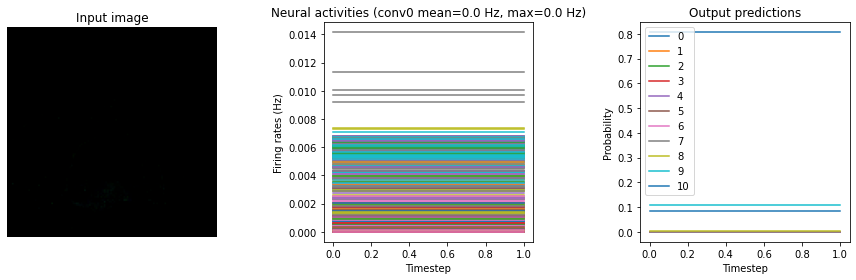

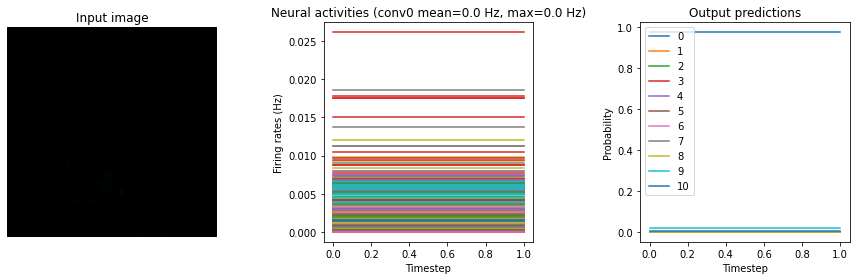

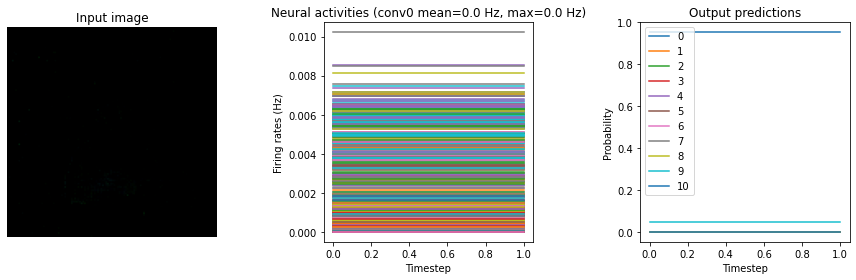

In [ ]:
run_network(activation=nengo.RectifiedLinear(), n_steps=2, dataset="dvs")

/usr/local/lib/python3.7/dist-packages/nengo_dl/simulator.py:1922: UserWarning: Number of elements in input data (288) is not evenly divisible by Simulator.minibatch_size (20); input data will be truncated.
  f"Number of elements in input data ({data_batch}) is not "


Test Accuracy: 10.36%


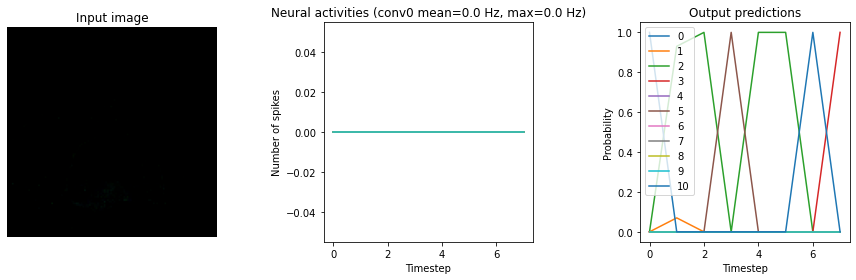

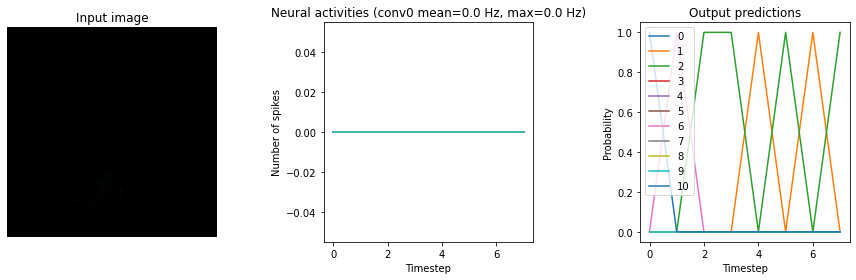

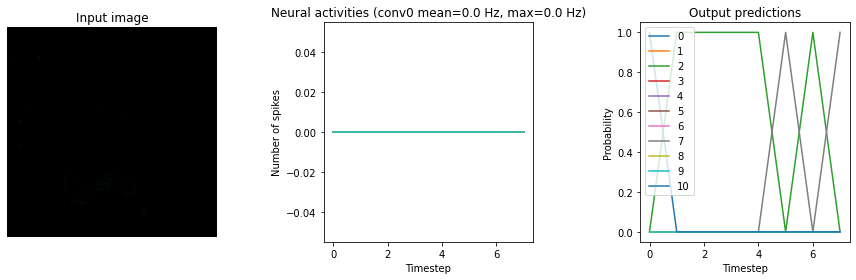

In [ ]:
run_network(activation=nengo.SpikingRectifiedLinear(), n_steps=8, dataset="dvs")

Synapse=0.0001


/usr/local/lib/python3.7/dist-packages/nengo_dl/simulator.py:1922: UserWarning: Number of elements in input data (288) is not evenly divisible by Simulator.minibatch_size (20); input data will be truncated.
  f"Number of elements in input data ({data_batch}) is not "


Test Accuracy: 15.36%


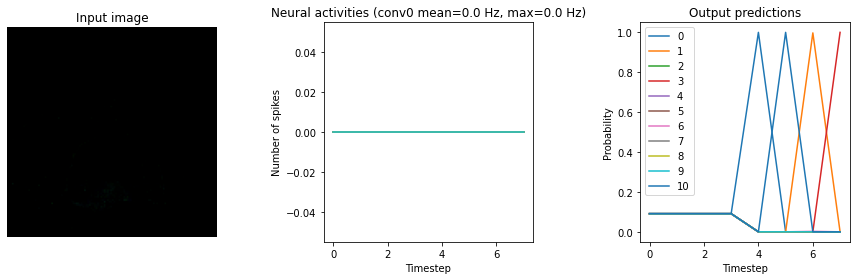

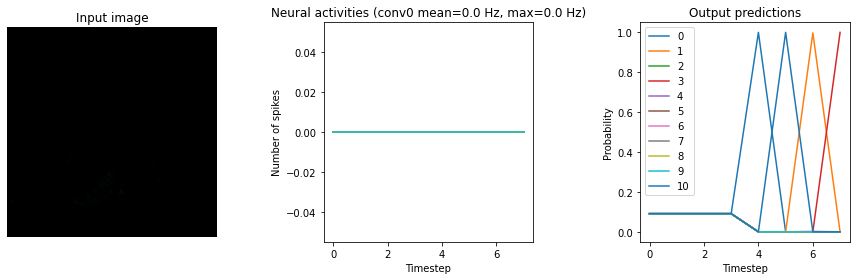

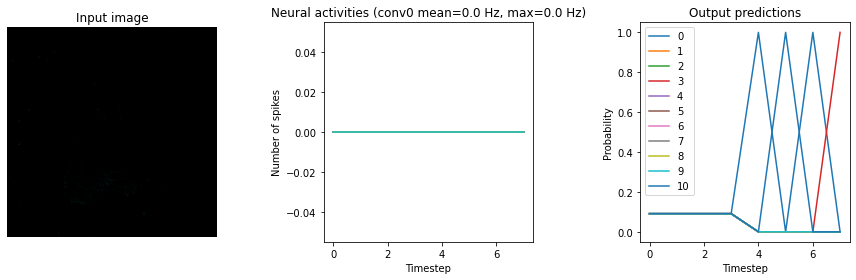

Synapse=0.0005


/usr/local/lib/python3.7/dist-packages/nengo_dl/simulator.py:1922: UserWarning: Number of elements in input data (288) is not evenly divisible by Simulator.minibatch_size (20); input data will be truncated.
  f"Number of elements in input data ({data_batch}) is not "


Test Accuracy: 8.57%


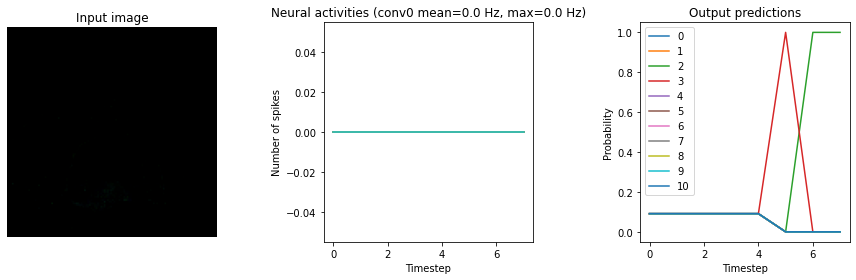

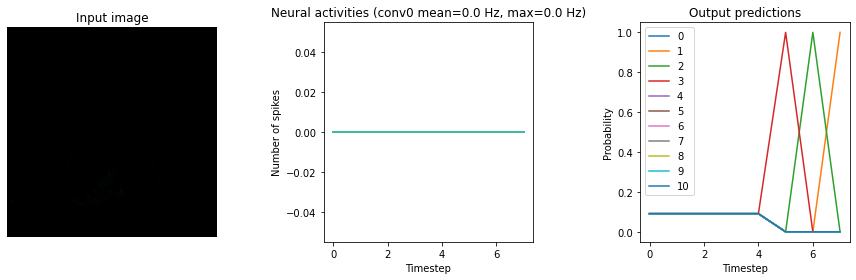

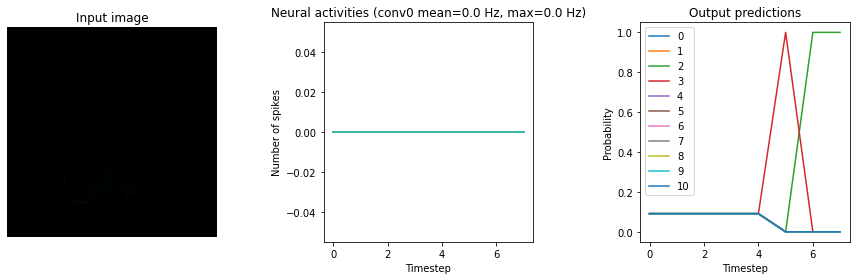

Synapse=0.0010


/usr/local/lib/python3.7/dist-packages/nengo_dl/simulator.py:1922: UserWarning: Number of elements in input data (288) is not evenly divisible by Simulator.minibatch_size (20); input data will be truncated.
  f"Number of elements in input data ({data_batch}) is not "


Test Accuracy: 9.64%


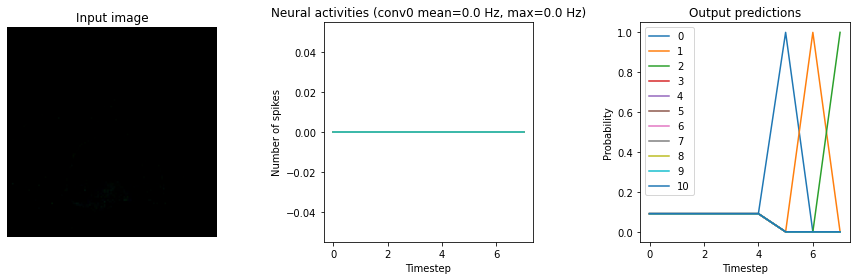

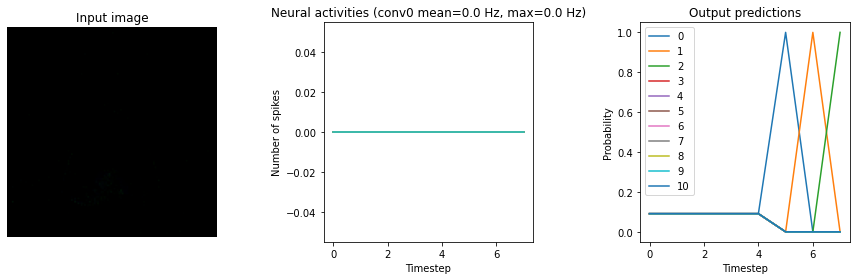

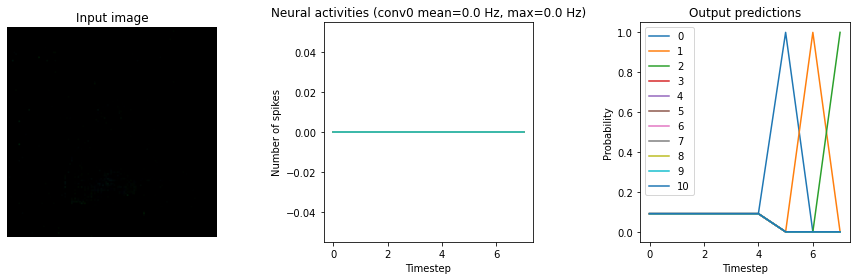

In [ ]:
for s in [0.0001, 0.0005, 0.0010]:
    print(f"Synapse={s:.4f}")
    run_network(
        activation=nengo.SpikingRectifiedLinear(),
        synapse=s,
        n_steps=8,
        dataset="dvs"
    )
    plt.show()

Scale=250


/usr/local/lib/python3.7/dist-packages/nengo_dl/simulator.py:1922: UserWarning: Number of elements in input data (288) is not evenly divisible by Simulator.minibatch_size (10); input data will be truncated.
  f"Number of elements in input data ({data_batch}) is not "


Test Accuracy: 46.07%


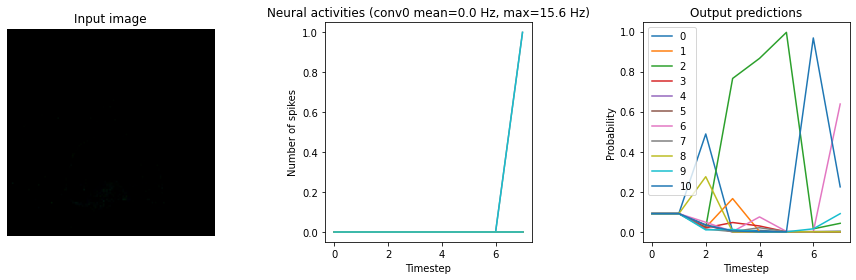

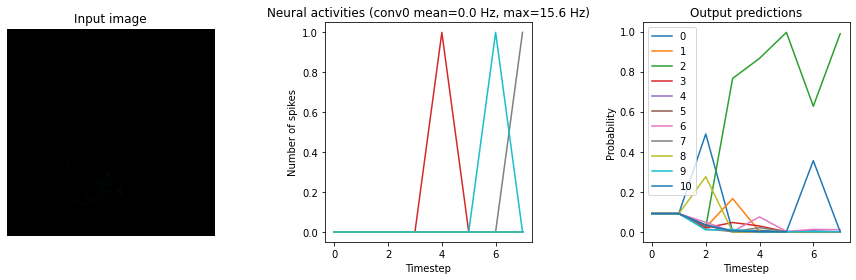

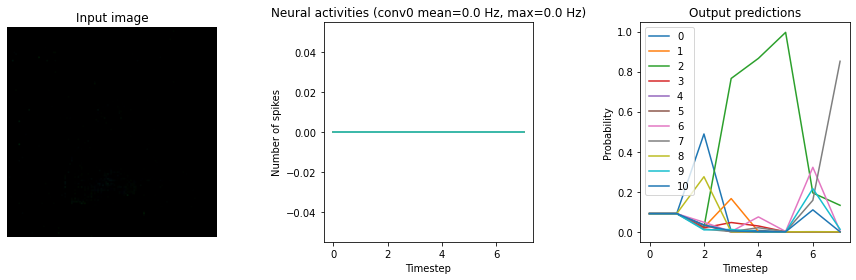

Scale=500


/usr/local/lib/python3.7/dist-packages/nengo_dl/simulator.py:1922: UserWarning: Number of elements in input data (288) is not evenly divisible by Simulator.minibatch_size (10); input data will be truncated.
  f"Number of elements in input data ({data_batch}) is not "


Test Accuracy: 57.50%


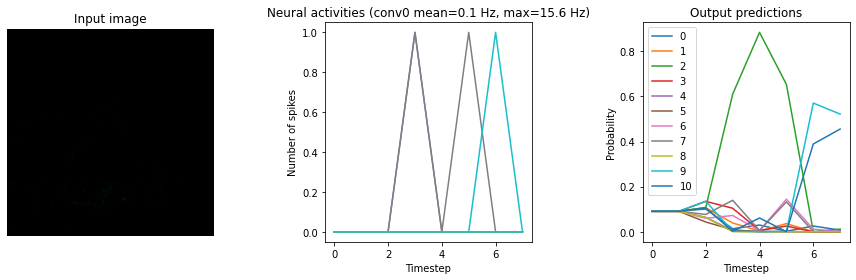

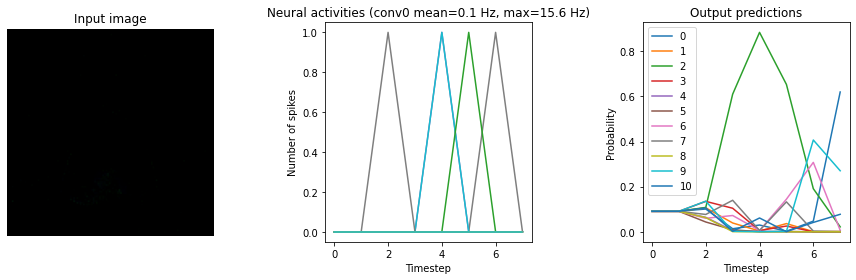

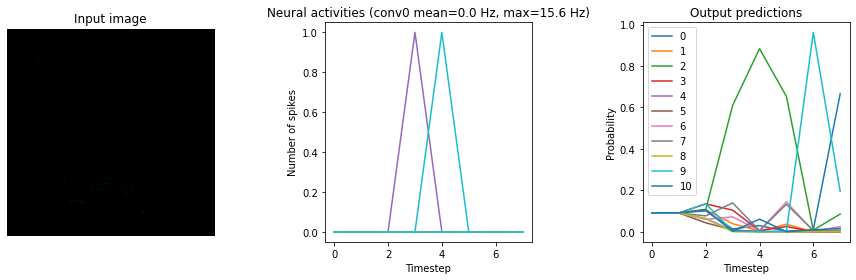

Scale=1000


/usr/local/lib/python3.7/dist-packages/nengo_dl/simulator.py:1922: UserWarning: Number of elements in input data (288) is not evenly divisible by Simulator.minibatch_size (10); input data will be truncated.
  f"Number of elements in input data ({data_batch}) is not "


Test Accuracy: 68.21%


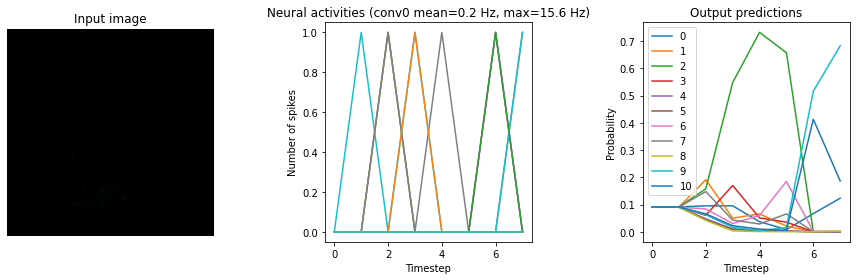

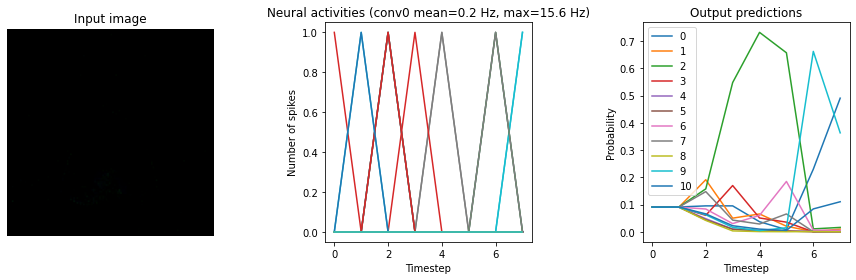

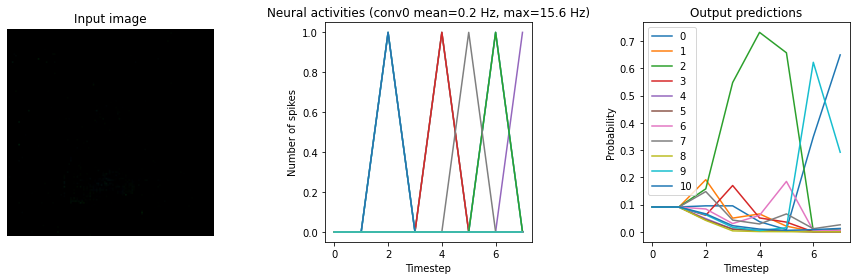

In [ ]:
for scale in [250, 500, 1000]:
    print(f"Scale={scale}")
    run_network(
        activation=nengo.SpikingRectifiedLinear(),
        scale_firing_rates=scale,
        synapse=0.0001,
        n_steps=8,
        dataset="dvs",
        batch_size=10
    )
    plt.show()

/usr/local/lib/python3.7/dist-packages/nengo_dl/simulator.py:1922: UserWarning: Number of elements in input data (288) is not evenly divisible by Simulator.minibatch_size (10); input data will be truncated.
  f"Number of elements in input data ({data_batch}) is not "


Test Accuracy: 70.00%


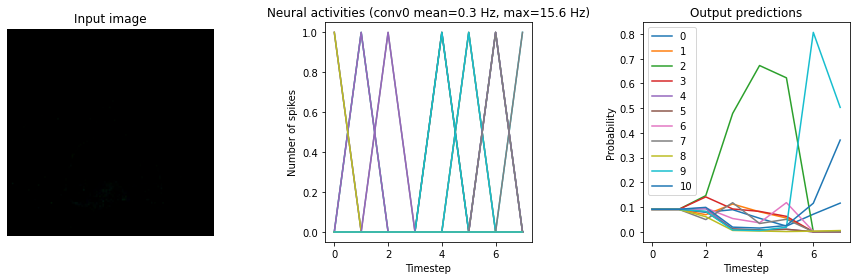

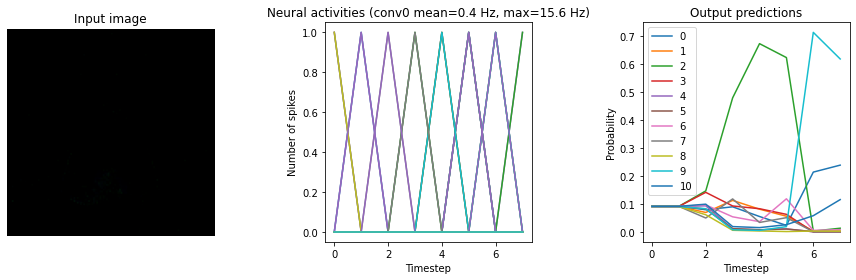

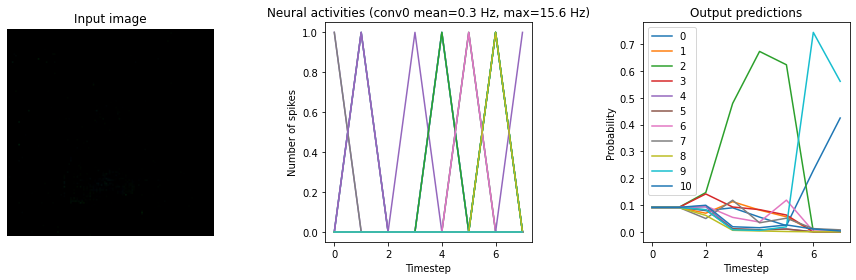

In [ ]:
run_network(
        activation=nengo.SpikingRectifiedLinear(),
        scale_firing_rates=1500,
        synapse=0.0001,
        n_steps=8,
        dataset="dvs",
        batch_size=10
    )

#### results

In [ ]:
activation = nengo.SpikingRectifiedLinear()
scale_firing_rates = 150
synapse = 0.006
n_steps = 30
params_file = "keras_to_snn_params"

nengo_converter = nengo_dl.Converter(
    model,
    swap_activations={tf.nn.relu: activation},
    scale_firing_rates=scale_firing_rates,
    synapse=synapse,
    max_to_avg_pool=True
)

with nengo_converter.net:
    nengo_dl.configure_settings(planner=nengo_dl.graph_optimizer.noop_planner)

# get input/output objects
nengo_input = nengo_converter.inputs[inp]
nengo_output = nengo_converter.outputs[out]

# # repeat inputs for some number of timesteps
x_test_flat_rep = np.repeat(x_test_flat, n_steps, axis=1)

# set some options to speed up simulation
with nengo_converter.net:
    nengo_dl.configure_settings(stateful=False)

# build network, load in trained weights, run inference on test images
with nengo_dl.Simulator(
    nengo_converter.net, minibatch_size=20, progress_bar=False
) as nengo_sim:
    nengo_sim.load_params(params_file)
    data = nengo_sim.predict({nengo_input: x_test_flat_rep})

# compute accuracy on test data, using output of network on
# last timestep
predictions = np.argmax(data[nengo_output][:, -1], axis=-1)
actual = np.argmax(y_test, axis=1)
accuracy = (predictions == actual).mean()
print(f"Test accuracy: {100 * accuracy:.2f}%")

Test accuracy: 96.24%


AttributeError: ignored

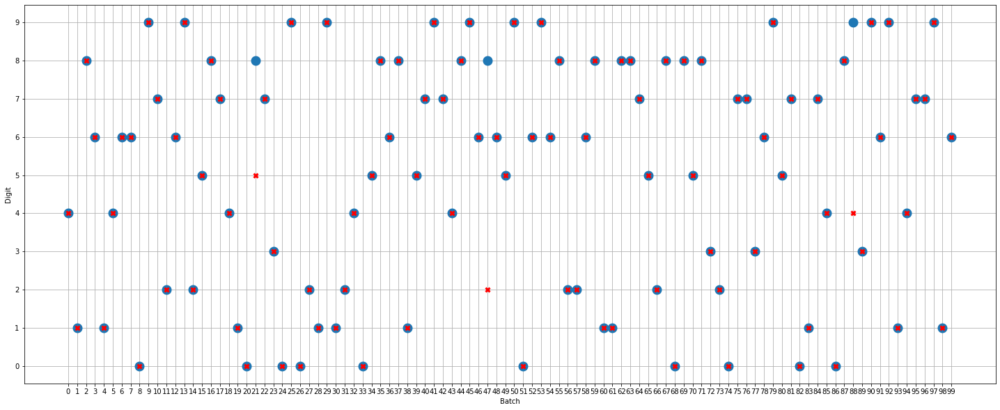

In [ ]:
import random

n_tests = 100

sampled_pred, sampled_act = zip(*random.sample(list(zip(predictions, actual)), n_tests))

plt.rcParams["figure.figsize"] = (25,10)
plt.plot(sampled_pred, 'o', mew=8, label="predictions")
plt.plot(sampled_act, 'rx', mew=3, label="actual")
plt.xlabel("Batch")
plt.xticks(list(range(0, n_tests)))
plt.ylabel("Digit")
plt.yticks(list(range(10)))
# plt.minorticks_on()
plt.grid(which="major")
# plt.grid(axis='x', which="minor")
for label in plt.xticks.get:
    label.set_visible(False)

plt.legend()
plt.show()
plt.rcParams["figure.figsize"] = plt.rcParamsDefault["figure.figsize"]

### LMU Network

In [ ]:
from nengo.utils.filter_design import cont2discrete

class LMUCell(nengo.Network):
    def __init__(self, units, order, theta, input_d, activation, **kwargs):
        super().__init__(**kwargs)

        # compute the A and B matrices according to the LMU's mathematical derivation
        # (see the paper for details)
        Q = np.arange(order, dtype=np.float64)
        R = (2 * Q + 1)[:, None] / theta
        j, i = np.meshgrid(Q, Q)

        A = np.where(i < j, -1, (-1.0) ** (i - j + 1)) * R
        B = (-1.0) ** Q[:, None] * R
        C = np.ones((1, order))
        D = np.zeros((1,))

        A, B, _, _, _ = cont2discrete((A, B, C, D), dt=1.0, method="zoh")

        with self:
            nengo_dl.configure_settings(trainable=None)

            # create objects corresponding to the x/u/m/h variables in the above diagram
            self.x = nengo.Node(size_in=input_d)
            self.u = nengo.Node(size_in=1)
            self.m = nengo.Node(size_in=order)
            # self.h = nengo_dl.TensorNode(activation, shape_in=(units,), pass_time=False)
            # nengo.RegularSpiking(nengo.Tanh(tau_ref=1)),
            self.h = nengo.Ensemble(units,
                        1,
                        neuron_type=activation,
                        gain=np.ones(units),
                        bias=np.zeros(units)).neurons

            # compute u_t from the above diagram. we have removed e_h and e_m as they
            # are not needed in this task.
            nengo.Connection(
                self.x, self.u, transform=np.ones((1, input_d)), synapse=None
            )

            # compute m_t
            # in this implementation we'll make A and B non-trainable, but they
            # could also be optimized in the same way as the other parameters.
            # note that setting synapse=0 (versus synapse=None) adds a one-timestep
            # delay, so we can think of any connections with synapse=0 as representing
            # value_{t-1}.
            conn_A = nengo.Connection(self.m, self.m, transform=A, synapse=0)
            self.config[conn_A].trainable = False
            conn_B = nengo.Connection(self.u, self.m, transform=B, synapse=None)
            self.config[conn_B].trainable = False

            # compute h_t
            nengo.Connection(
                self.x, self.h, transform=nengo_dl.dists.Glorot(), synapse=None
            )
            nengo.Connection(
                self.h, self.h, transform=nengo_dl.dists.Glorot(), synapse=0
            )
            nengo.Connection(
                self.m,
                self.h,
                transform=nengo_dl.dists.Glorot(),
                synapse=None,
            )

In [ ]:
with nengo.Network(seed=seed) as net:
    # remove some unnecessary features to speed up the training
    nengo_dl.configure_settings(
        trainable=None,
        stateful=False,
        keep_history=False,
    )

    # input node
    inp = nengo.Node(np.zeros(x_train_flat.shape[2]))

    # lmu cell
    lmu = LMUCell(
        units=414,
        order=512,
        theta=x_train_flat.shape[1],
        input_d=x_train_flat.shape[2],
        activation=nengo.Tanh(tau_ref=2)
        # activation=nengo.RectifiedLinear()
    )
    conn = nengo.Connection(inp, lmu.x, synapse=None)
    net.config[conn].trainable = False

    # dense linear readout
    out = nengo.Node(size_in=11)
    nengo.Connection(lmu.h, out, transform=nengo_dl.dists.Glorot(), synapse=None)

    # record output. note that we set keep_history=False above, so this will
    # only record the output on the last timestep (which is all we need
    # on this task)
    p = nengo.Probe(out)

In [ ]:
do_training = True

with nengo_dl.Simulator(net, minibatch_size=16, unroll_simulation=1) as sim:
    sim.compile(
        loss=tf.losses.CategoricalCrossentropy(from_logits=True),
        optimizer=tf.optimizers.Adam(),
        metrics=["accuracy"],
    )

    data = sim.predict(np.repeat(x_test_flat, 2, axis=1))
    # compute accuracy on test data, using output of network on
    # last timestep
    predictions = np.argmax(data[next(iter(data))][:, -1], axis=-1)
    actual = np.argmax(y_test, axis=1)
    matches = np.array([predictions[i] == actual[i] for i in range(len(predictions))])
    print(f"Test Accuracy: {100 * matches.mean():.2f}%")

    # test_acc = sim.evaluate(x_test_flat, y_test_time, verbose=0)["probe_accuracy"]
    # print(f"Initial test accuracy: {test_acc * 100:.2f}%")

    if do_training:
        sim.fit(x_train_flat, y_train_time, validation_data=(x_val_flat, y_val_time), epochs=20)
        sim.save_params("lmu_params")
    else:
        sim.load_params("lmu_params")


    data = sim.predict(np.repeat(x_test_flat, 2, axis=1))
    # compute accuracy on test data, using output of network on
    # last timestep
    predictions = np.argmax(data[next(iter(data))][:, -1], axis=-1)
    actual = np.argmax(y_test, axis=1)
    matches = np.array([predictions[i] == actual[i] for i in range(len(predictions))])
    print(f"Test Accuracy: {100 * matches.mean():.2f}%")

    # test_acc = sim.evaluate(test_images, test_labels, verbose=0)["probe_accuracy"]
    # print(f"Final test accuracy: {test_acc * 100:.2f}")

Build finished in 0:00:03                                                      
Optimization finished in 0:00:00                                               
Construction finished in 0:00:01                                               
Test Accuracy: 7.29%


/usr/local/lib/python3.7/dist-packages/nengo_dl/simulator.py:1922: UserWarning: Number of elements in input data (236) is not evenly divisible by Simulator.minibatch_size (16); input data will be truncated.
  f"Number of elements in input data ({data_batch}) is not "
/usr/local/lib/python3.7/dist-packages/nengo_dl/simulator.py:1922: UserWarning: Number of elements in input data (940) is not evenly divisible by Simulator.minibatch_size (16); input data will be truncated.
  f"Number of elements in input data ({data_batch}) is not "
/usr/local/lib/python3.7/dist-packages/nengo_dl/simulator.py:1025: UserWarning: Running for one timestep, but the network contains synaptic filters (which will introduce at least a one-timestep delay); did you mean to set synapse=None?
  "Running for one timestep, but the network contains "


Epoch 1/20
58/58 [==============================] - 20s 191ms/step - loss: 1.7228 - probe_loss: 1.7228 - probe_accuracy: 0.4159 - val_loss: 1.3190 - val_probe_loss: 1.3190 - val_probe_accuracy: 0.5134
Epoch 2/20
58/58 [==============================] - 8s 136ms/step - loss: 1.0750 - probe_loss: 1.0750 - probe_accuracy: 0.6336 - val_loss: 1.0672 - val_probe_loss: 1.0672 - val_probe_accuracy: 0.6295
Epoch 3/20
58/58 [==============================] - 8s 137ms/step - loss: 0.8331 - probe_loss: 0.8331 - probe_accuracy: 0.7263 - val_loss: 1.0391 - val_probe_loss: 1.0391 - val_probe_accuracy: 0.6161
Epoch 4/20
58/58 [==============================] - 8s 137ms/step - loss: 0.6941 - probe_loss: 0.6941 - probe_accuracy: 0.7877 - val_loss: 0.9798 - val_probe_loss: 0.9798 - val_probe_accuracy: 0.6384
Epoch 5/20
58/58 [==============================] - 8s 136ms/step - loss: 0.5956 - probe_loss: 0.5956 - probe_accuracy: 0.8190 - val_loss: 0.9244 - val_probe_loss: 0.9244 - val_probe_accuracy: 0.6920

In [ ]:
sf=10

with nengo.Network(seed=seed) as net:
    # remove some unnecessary features to speed up the training
    nengo_dl.configure_settings(
        trainable=None,
        stateful=False,
        keep_history=False,
    )

    # input node
    inp = nengo.Node(np.zeros(x_train_flat.shape[2]))

    # lmu cell
    lmu = LMUCell(
        units=212,
        order=256,
        theta=x_train_flat.shape[1],
        input_d=x_train_flat.shape[2],
        activation=nengo.RegularSpiking(nengo.Tanh(tau_ref=1), amplitude=1/sf)
        # activation=nengo.SpikingRectifiedLinear(amplitude=1)
    )
    conn = nengo.Connection(inp, lmu.x, synapse=None)
    net.config[conn].trainable = False

    # dense linear readout
    out = nengo.Node(size_in=10)
    nengo.Connection(lmu.h, out, transform=nengo_dl.dists.Glorot(), synapse=0.08)

    # record output. note that we set keep_history=False above, so this will
    # only record the output on the last timestep (which is all we need
    # on this task)
    p = nengo.Probe(out)

with nengo_dl.Simulator(net, minibatch_size=16) as sim:
    sim.load_params("lmu_params")
    data = sim.predict(np.repeat(x_test_flat, 30, axis=1)*sf)
    # compute accuracy on test data, using output of network on
    # last timestep
    predictions = np.argmax(data[next(iter(data))][:, -1], axis=-1)
    actual = np.argmax(y_test, axis=1)
    matches = np.array([predictions[i] == actual[i] for i in range(len(predictions))])
    print(f"Test Accuracy: {100 * matches.mean():.2f}%")

Build finished in 0:00:00                                                      
Optimization finished in 0:00:00                                               
Construction finished in 0:00:00                                               


/usr/local/lib/python3.7/dist-packages/nengo_dl/simulator.py:1922: UserWarning: Number of elements in input data (5000) is not evenly divisible by Simulator.minibatch_size (16); input data will be truncated.
  f"Number of elements in input data ({data_batch}) is not "


Test Accuracy: 24.44%


In [ ]:
sf=10

with nengo.Network(seed=seed) as net:
    # remove some unnecessary features to speed up the training
    nengo_dl.configure_settings(
        trainable=None,
        stateful=False,
        keep_history=False,
    )

    # input node
    inp = nengo.Node(np.zeros(x_train_flat.shape[2]))

    # lmu cell
    lmu = LMUCell(
        units=212,
        order=256,
        theta=x_train_flat.shape[1],
        input_d=x_train_flat.shape[2],
        activation=nengo.RegularSpiking(nengo.Tanh(tau_ref=1), amplitude=1/sf)
        # activation=nengo.SpikingRectifiedLinear(amplitude=1)
    )
    conn = nengo.Connection(inp, lmu.x, synapse=None)
    net.config[conn].trainable = False

    # dense linear readout
    out = nengo.Node(size_in=10)
    nengo.Connection(lmu.h, out, transform=nengo_dl.dists.Glorot(), synapse=0.08)

    # record output. note that we set keep_history=False above, so this will
    # only record the output on the last timestep (which is all we need
    # on this task)
    p = nengo.Probe(out)

with nengo_dl.Simulator(net, minibatch_size=16) as sim:
    sim.load_params("lmu_params")
    data = sim.predict(np.repeat(x_test_flat, 30, axis=1)*sf)
    # compute accuracy on test data, using output of network on
    # last timestep
    predictions = np.argmax(data[next(iter(data))][:, -1], axis=-1)
    actual = np.argmax(y_test, axis=1)
    matches = np.array([predictions[i] == actual[i] for i in range(len(predictions))])
    print(f"Test Accuracy: {100 * matches.mean():.2f}%")

Build finished in 0:00:00                                                      
Optimization finished in 0:00:00                                               
Construction finished in 0:00:00                                               


/usr/local/lib/python3.7/dist-packages/nengo_dl/simulator.py:1922: UserWarning: Number of elements in input data (5000) is not evenly divisible by Simulator.minibatch_size (16); input data will be truncated.
  f"Number of elements in input data ({data_batch}) is not "


Test Accuracy: 40.34%


In [ ]:
data[next(iter(data))]

(24000, 1, 9248)


In [ ]:
import tensorflow as tf
!pip install -q keras-lmu
import keras_lmu
from tensorflow.keras.layers import Input, Reshape, Flatten
from keras.layers.core import Dense


lmu_layer = keras_lmu.LMU(
    memory_d=3,
    order=256,
    theta=784,
    hidden_cell=tf.keras.layers.SimpleRNNCell(units=10),
)

inp = Input(x_train_flat.shape[1:])
# reshape = Reshape([8,34,34,1])(inp)
lmus = lmu_layer(inp)
# flat0 = Flatten()(lmus)
out = Dense(10)(lmus)

model = tf.keras.Model(inputs=inp, outputs=out)

In [ ]:
converter = nengo_dl.Converter(
    model,
    swap_activations={tf.nn.relu: tf.nn.relu},
    scale_firing_rates=1,
    synapse=None,
    max_to_avg_pool=True
)

# turn off the optimizer completely, as to not change the number of tensors
with converter.net:
    # nengo_dl.configure_settings(simplifications=[])
    nengo_dl.configure_settings(planner=nengo_dl.graph_optimizer.noop_planner)

with tf.device(gpu):
  do_training = True
  if do_training:
      with nengo_dl.Simulator(converter.net, minibatch_size=20) as sim:
          # run training
          sim.compile(
              optimizer=tf.optimizers.Adam(0.0001),
              loss=tf.losses.CategoricalCrossentropy(from_logits=True),
              metrics=[tf.metrics.categorical_accuracy],
          )
          sim.fit(
              {converter.inputs[inp]: x_train_flat},
              {converter.outputs[out]: y_train_time},
              validation_data=(
                  {converter.inputs[inp]: x_val_flat},
                  {converter.outputs[out]: y_val_time},
              ),
              epochs=15,
          )

          # save the parameters to file
          sim.save_params("keras_to_snn_params")
  else:
    with nengo_dl.Simulator(converter.net, minibatch_size=20) as sim:
      # download pretrained weights
      sim.load_params("keras_to_snn_params")
      print("Loaded pretrained weights")

del x_train_flat
del x_val_flat
del y_train_time
del y_val_time

Build finished in 0:00:00                                                      
Optimization finished in 0:00:00                                               
|#                        Constructing graph                          | 0:00:00


/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:325: UserWarning: Layer type LMU does not have a registered converter. Falling back to TensorNode.
  f"{error_msg + '. ' if error_msg else ''}"
/usr/local/lib/python3.7/dist-packages/nengo_dl/converter.py:141: UserWarning: swap_activations contained {<function relu at 0x7f0d7233c7a0>}, but there were no layers in the model with that activation type
  f"swap_activations contained {self.swap_activations.unused_keys()}, "


AssertionError: ignored

# Random Tests

In [ ]:
!rm -rf /content/rpg_e2vid/data/DVS128Gesture
!rm -rf /content/datasets/DVS128Gesture
!mkdir /content/datasets
!unzip -q /content/drive/MyDrive/DVS128Gesture/'DVS  Gesture dataset.zip' -d /content/tmp
!tar -xzf /content/tmp/'DVS  Gesture dataset'/DvsGesture.tar.gz -C /content/datasets
!rm -rf tmp

In [ ]:
!pip3 install -q dv
from dv import LegacyAedatFile
import os
import shutil
from typing import NamedTuple

class Event(NamedTuple):
    x_location: int
    y_location: int
    polarity: int
    timestamp: int

def read_aedat_events(input_file):
  events = []
  with LegacyAedatFile(input_file) as f:
    for event in f:
      events.append(Event(event.x, event.y, event.polarity, event.timestamp))

  return events

def segment_events(event_list, segments, visualise):
  sorted_events = sorted(event_list, key=lambda e: e.timestamp, reverse=False)
  timestamp_range = sorted_events[-1].timestamp - sorted_events[0].timestamp
  if visualise:
    print("{0} -> {1} ms = {2} ms".format(sorted_events[0].timestamp, sorted_events[-1].timestamp, timestamp_range))

  segmented_events = []
  for i in range(segments):
    segmented_events.append(list(filter(
        lambda event: event.timestamp < (i+1)*(sorted_events[-1].timestamp/segments)
        and event.timestamp > (i)*(sorted_events[-1].timestamp/segments), event_list)))
    if i%3 == 1 and visualise == 1:
      visualise_events(segmented_events[-1])

  return segmented_events

def get_intensity(event_list, max_x, max_y):
  off_events = list(filter(lambda event: event.polarity == 0, event_list))
  on_events = list(filter(lambda event: event.polarity == 1, event_list))

  intensity = [[0 for _ in range(max_x)] for _ in range(max_y)]

  for e in on_events:
    intensity[e.x_location][e.y_location] += 1

  for e in off_events:
    intensity[e.x_location][e.y_location] -= 1

  return intensity

max_samples = 1

def load_dvs_samples(train):
  folder = "train" if train else "test"

  with open("/content/datasets/DvsGesture/trials_to_{0}.txt".format(folder)) as file:
      lines = file.readlines()
      train_files = [line.rstrip() for line in lines]
  print("Loading {0}ing samples:".format(folder))
  count = 0
  videos = []
  for file_name in train_files:
    if count < (max_samples if train else max_samples /4):
      input_directory = "/content/datasets/DvsGesture/{0}".format(file_name)
      print("- {0}".format(file_name))
      e = read_aedat_events(input_directory)
      s = segment_events(e, 20, False)
      i = [get_intensity(s_i, 128, 128) for s_i in s]
      videos.append(i)
    count = count + 1

    return videos

videos = load_dvs_samples(train=True)

Loading training samples:
- user01_fluorescent.aedat


In [ ]:
import numpy as np

print(np.array(videos).shape)

(1, 100, 128, 128)


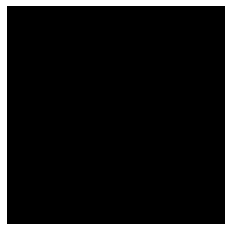

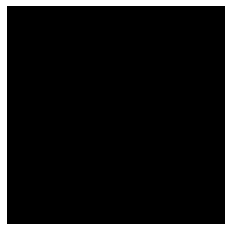

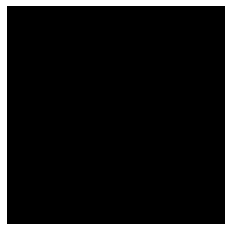

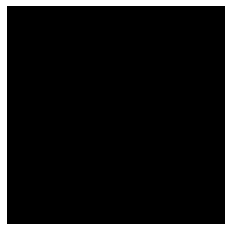

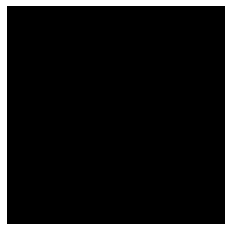

...

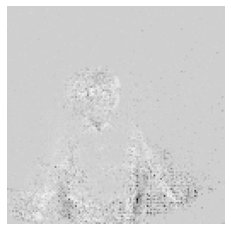

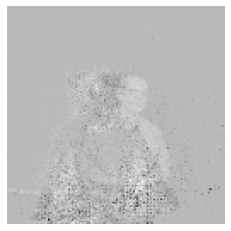

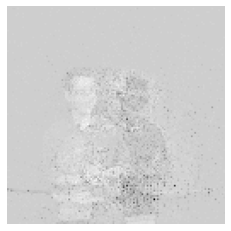

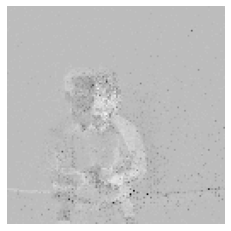

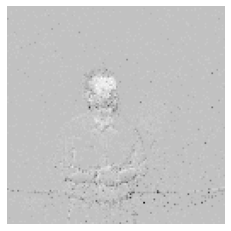

In [ ]:
import matplotlib.pyplot as plt
from scipy import ndimage

for frame in videos[0]:
  plt.imshow(ndimage.rotate(frame, -90), cmap='gray')
  plt.axis("off")
  plt.show()

## Working with Data


### Helper Functions

In [ ]:
from typing import NamedTuple
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import seaborn as sns
import pandas as pd

class Event(NamedTuple):
    x_location: int
    y_location: int
    polarity: int
    timestamp: int

def read_events(filepath):
  file = open(filepath, "rb")

  events = []

  # reading 5 bytes (40 bits) at a time
  event = int.from_bytes(file.read(5), byteorder="little", signed=False)

  i = 0
  while event:
    # interpreting binary data
    location_mask = 0b11111111
    x_location = location_mask & event
    y_location = location_mask & (event>>8)
    polarity = 0b1 & (event>>16)
    timestamp_mask = 0b11111111111111111111111
    timestamp = timestamp_mask & (event>>17)

    # appending to list of events
    events.append(Event(x_location, y_location, polarity, timestamp))

    # reading next event
    event = int.from_bytes(file.read(5), byteorder="little", signed=False)
    i += 1

  file.close()
  return events

def visualise_events(event_list):
  off_events = list(filter(lambda event: event.polarity == 0, event_list))
  on_events = list(filter(lambda event: event.polarity == 1, event_list))

  fig = plt.figure(figsize=(8,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.set_xlabel("x_location (pixels)")
  ax.set_ylabel("timestamp (ms)")
  ax.set_zlabel("y_location (pixels)")

  ax.scatter(
      [e.x_location for e in off_events],
      [e.timestamp for e in off_events],
      [e.y_location for e in off_events],
      c="blue",
      label="off events")

  ax.scatter(
      [e.x_location for e in on_events],
      [e.timestamp for e in on_events],
      [e.y_location for e in on_events],
      c="red",
      label="on events")

  ax.legend()
  plt.show()

def segment_events(event_list, segments, visualise):
  sorted_events = sorted(event_list, key=lambda e: e.timestamp, reverse=False)
  timestamp_range = sorted_events[-1].timestamp - sorted_events[0].timestamp
  if visualise:
    print("{0} -> {1} ms = {2} ms".format(sorted_events[0].timestamp, sorted_events[-1].timestamp, timestamp_range))

  segmented_events = []
  for i in range(segments):
    segmented_events.append(list(filter(
        lambda event: event.timestamp < (i+1)*(sorted_events[-1].timestamp/segments)
        and event.timestamp > (i)*(sorted_events[-1].timestamp/segments), events)))
    if i%3 == 1 and visualise == 1:
      visualise_events(segmented_events[-1])

  return segmented_events

def visualise_on_off_events(event_list):
  off_events = list(filter(lambda event: event.polarity == 0, event_list))
  on_events = list(filter(lambda event: event.polarity == 1, event_list))

  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
  ax1.set_xlabel("x_location (pixels)")
  ax1.set_ylabel("y_location (pixels)")
  ax2.set_xlabel("x_location (pixels)")
  ax2.set_ylabel("y_location (pixels)")

  ax1.set_title("On Events")

  ax1.scatter(
      [e.x_location for e in on_events],
      [e.y_location for e in on_events],
      c="red",
      label="on events")

  ax2.set_title("Off Events")

  ax2.scatter(
      [e.x_location for e in off_events],
      [e.y_location for e in off_events],
      c="blue",
      label="off events")

  ax1.grid()
  ax2.grid()

  plt.show()

def get_intensity(event_list, max_x, max_y):
  off_events = list(filter(lambda event: event.polarity == 0, event_list))
  on_events = list(filter(lambda event: event.polarity == 1, event_list))

  intensity_pos = [[0 for _ in range(max_x + 1)] for _ in range(max_y + 1)]
  intensity_neg = [[0 for _ in range(max_x + 1)] for _ in range(max_y + 1)]

  for e in on_events:
    intensity_pos[e.x_location][e.y_location] = 1

  for e in off_events:
    intensity_neg[e.x_location][e.y_location] = 1

  return np.array([intensity_pos, intensity_neg])


def visulaise_intensity_map(event_list, max_x, max_y):
  intensity = get_intensity(event_list, max_x, max_y)

  fig = plt.figure(figsize=(8,6))
  ax = fig.add_subplot(111)
  ax.set_xlabel("x_location (pixels)")
  ax.set_ylabel("y_location (pixels)")

  # Create a dataset
  df = pd.DataFrame(intensity)

  # Default heatmap
  ax = sns.heatmap(df)
  ax.invert_yaxis()
  # p1 = sns.heatmap(df)
  plt.show()

### Downloading Data

In [ ]:
# Loading N-MNIST dataset
import zipfile
!wget -O "MNIST_testing.zip" "https://data.mendeley.com/public-files/datasets/468j46mzdv/files/05a4d654-7e03-4c15-bdfa-9bb2bcbea494/file_downloaded"
with zipfile.ZipFile("MNIST_testing.zip", 'r') as zip_ref:
    zip_ref.extractall("/content/NMNIST")
!rm "MNIST_testing.zip"
!wget -O "MNIST_training.zip" "https://data.mendeley.com/public-files/datasets/468j46mzdv/files/39c25547-014b-4137-a934-9d29fa53c7a0/file_downloaded"
with zipfile.ZipFile("MNIST_training.zip", 'r') as zip_ref:
    zip_ref.extractall("/content/NMNIST")
!rm "MNIST_training.zip"

--2022-06-15 19:11:57--  https://data.mendeley.com/public-files/datasets/468j46mzdv/files/05a4d654-7e03-4c15-bdfa-9bb2bcbea494/file_downloaded
Resolving data.mendeley.com (data.mendeley.com)... 162.159.130.86, 162.159.133.86
Connecting to data.mendeley.com (data.mendeley.com)|162.159.130.86|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://md-datasets-public-files-prod.s3.eu-west-1.amazonaws.com/a99d0fee-a95b-4231-ad22-988fdb0a2411 [following]
--2022-06-15 19:11:58--  https://md-datasets-public-files-prod.s3.eu-west-1.amazonaws.com/a99d0fee-a95b-4231-ad22-988fdb0a2411
Resolving md-datasets-public-files-prod.s3.eu-west-1.amazonaws.com (md-datasets-public-files-prod.s3.eu-west-1.amazonaws.com)... 52.218.117.194
Connecting to md-datasets-public-files-prod.s3.eu-west-1.amazonaws.com (md-datasets-public-files-prod.s3.eu-west-1.amazonaws.com)|52.218.117.194|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 169674850 (162M) [applica

In [ ]:
# !cp -r /content/NMNIST /content/drive/MyDrive

Each example is a separate binary file consisting of a list of events. Each event occupies 40 bits as described below:

- bit 39 - 32: Xaddress (in pixels)

- bit 31 - 24: Yaddress (in pixels)

- bit 23: Polarity (0 for OFF, 1 for ON)

- bit 22 - 0: Timestamp (in microseconds)

### Preprocessing Data

In [ ]:
from keras.utils import np_utils
import os
import pickle

max_no = 10000/20

x_train = []
y_train = []
print('Loading training samples')
for act_class in range(10):
  # print(' class {0}'.format(act_class))
  # directory = "/content/drive/MyDrive/NMNIST/Train/{0}".format(act_class)
  directory = "/content/NMNIST/Train/{0}/".format(act_class)
  # iterate over files in
  # that directory
  count = 0
  for sample in os.listdir(directory):
      f = os.path.join(directory, sample)
      # checking if it is a file
      if os.path.isfile(f) and count < 6 * max_no:
          # print(f)
          events = read_events(f)
          max_x = 33
          max_y = 33
          segmented_events = segment_events(events, 8, False)
          intensity_maps = []
          for segment in segmented_events:
            intensity_maps.append(get_intensity(segment, max_x, max_y))
          x_train.append(intensity_maps)
          y_train.append(np_utils.to_categorical(act_class, 10))
      else:
        pass
      count = count + 1
  # print('   {0} samples loaded'.format(number_of_samples))

x_test = []
y_test = []
print('Loading testing samples')
for act_class in range(10):
  # print(' class {0}'.format(act_class))
  # directory = "/content/drive/MyDrive/NMNIST/Test/{0}".format(act_class)
  directory = "/content/NMNIST/Test/{0}/".format(act_class)
  # iterate over files in
  # that directory
  count = 0
  for sample in os.listdir(directory):
      f = os.path.join(directory, sample)
      # checking if it is a file
      if os.path.isfile(f) and count < max_no:
          # print(f)
          events = read_events(f)
          max_x = 33
          max_y = 33
          segmented_events = segment_events(events, 8, False)
          intensity_maps = []
          for segment in segmented_events:
            intensity_maps.append(get_intensity(segment, max_x, max_y))
          x_test.append(intensity_maps)
          y_test.append(np_utils.to_categorical(act_class, 10))
      else:
        pass
      count = count + 1
  # print('   {0} samples loaded'.format(number_of_samples))

x_train = np.array(x_train)
y_train = np.array(y_train)
x_test = np.array(x_test)
y_test = np.array(y_test)

Loading training samples
Loading testing samples


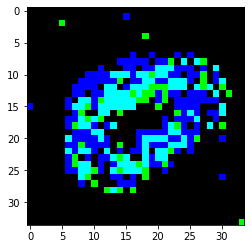

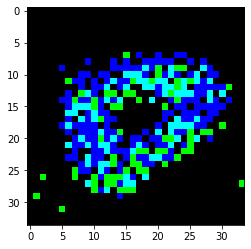

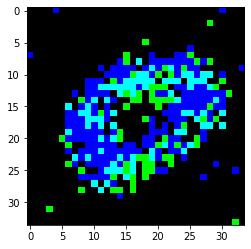

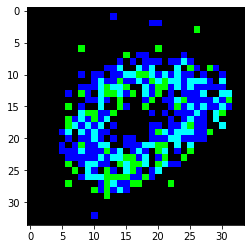

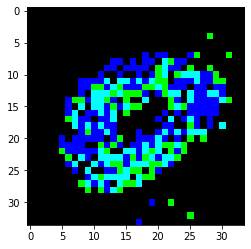

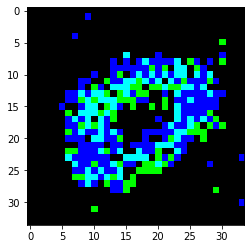

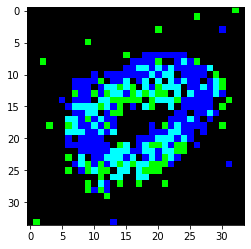

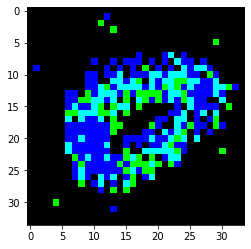

In [ ]:
import cv2

for i in range(len(x_train[0])):
  merged = np.array([np.zeros(shape=(34, 34)),x_train[0][i][0],x_train[0][i][1]])
  merged = np.moveaxis(merged, 0, -1)
  plt.imshow(merged)
  plt.show()

In [ ]:
x_train = np.moveaxis(x_train, -3, -1)
x_test = np.moveaxis(x_test, -3, -1)
train_events = {"x": x_train, "y": y_train}
test_events = {"x": x_test, "y": y_test}
all_events = {"train": train_events, "test": test_events}

In [ ]:
from sklearn.model_selection import train_test_split

train_set = x_train.astype('float32')
train_set -= np.mean(x_train)
train_set /= np.max(x_train)
test_set = x_test.astype('float32')
test_set -= np.mean(x_train)
test_set /= np.max(x_train)
x_train = train_set
x_test = test_set
del test_set
del train_set
del train_events
del test_events
del all_events

# Spliting the dataset for testing and training
x_train, x_val, y_train, y_val =  train_test_split(x_train, y_train, test_size=0.2, random_state=4)

print('Image shape: {0}'.format(x_train.shape[1:]))
print('Output shape: {0}'.format(y_train.shape))
print('Total number of training samples: {0}'.format(x_train.shape[0]))
print('Total number of validation samples: {0}'.format(x_val.shape[0]))
print('Total number of test samples: {0}'.format(x_test.shape[0]))

Image shape: (8, 34, 34, 2)
Output shape: (24000, 10)
Total number of training samples: 24000
Total number of validation samples: 6000
Total number of test samples: 5000


### Saving Data

In [ ]:
open_file = open("/content/drive/MyDrive/NMNIST/event_list_classic.pkl", "wb")
pickle.dump(all_events, open_file, protocol=4)
open_file.close()

### Loading Data

In [ ]:
import pickle
import numpy as np
from sklearn.model_selection import train_test_split

open_file = open("/content/drive/MyDrive/NMNIST/event_list_classic.pkl", "rb")
events = pickle.load(open_file)
open_file.close()

x_train = events["train"]["x"]
x_train = x_train.reshape(x_train.shape[0], x_train.shape[1], x_train.shape[2], x_train.shape[3], 1)
train_set = x_train.astype('float32')
train_set -= np.mean(x_train)
train_set /= np.max(x_train)

x_test = events["test"]["x"]
x_test = x_test.reshape(x_test.shape[0], x_test.shape[1], x_test.shape[2], x_test.shape[3], 1)
test_set = x_test.astype('float32')
test_set -= np.mean(x_train)
test_set /= np.max(x_train)

x_train = train_set
x_test = test_set
del test_set
del train_set

y_train = events["train"]["y"]
y_test = events["test"]["y"]

# Spliting the dataset for testing and training
x_train, x_val, y_train, y_val =  train_test_split(x_train, y_train, test_size=0.2, random_state=4)

print('Image shape: {0}'.format(x_train.shape[1:]))
print('Output shape: {0}'.format(y_train.shape))
print('Total number of training samples: {0}'.format(x_train.shape[0]))
print('Total number of validation samples: {0}'.format(x_val.shape[0]))
print('Total number of test samples: {0}'.format(x_test.shape[0]))

Image shape: (8, 34, 34, 1)
Output shape: (24000, 10)
Total number of training samples: 24000
Total number of validation samples: 6000
Total number of test samples: 5000


### Custom Conv3D Network

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
import numpy as np
from keras.models import Sequential
from keras.layers.core import Dense, Dropout, Activation, Flatten
from keras.layers.convolutional import Convolution3D, MaxPooling3D
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.optimizers import Adam
from keras.utils import np_utils
from keras.callbacks import TensorBoard, EarlyStopping
from sklearn.model_selection import train_test_split
import keras

# Initialing the Training Parameters
batch_size = 32
nb_classes = 10
nb_epoch = 120

# Number of convolutional filters to use at each layer
nb_filters = 32
# Level of pooling to perform at each layer (POOL x POOL)
nb_pool = 2
# Level of convolution to perform at each layer (CONV x CONV)
nb_conv = 5

# Defining the 3D Convolution Neural Network model
model = Sequential()
model.add(Convolution3D(nb_filters,kernel_size=nb_conv,input_shape=x_train.shape[1:], activation='relu',padding='same'))
model.add(BatchNormalization())
model.add(Convolution3D(nb_filters,kernel_size=nb_conv,input_shape=x_train.shape[1:], activation='relu',padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling3D(pool_size=nb_pool,padding='same'))

model.add(Dropout(0.25))

model.add(Convolution3D(nb_filters*2,kernel_size=nb_conv,activation='relu',padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling3D(pool_size=nb_pool,padding='same'))

model.add(Dropout(0.25))

model.add(Convolution3D(nb_filters*4,kernel_size=nb_conv,activation='relu',padding='same'))
model.add(BatchNormalization())
model.add(Convolution3D(nb_filters*4,kernel_size=nb_conv,activation='relu',padding='same'))
model.add(BatchNormalization())
model.add(MaxPooling3D(pool_size=nb_pool,padding='same'))

model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(128,kernel_initializer = 'he_normal',activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))
model.add(Dense(nb_classes,kernel_initializer = 'he_normal'))
model.add(Activation('softmax'))

opt=Adam(lr=0.0001)

model.summary()

# Compile the model
model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

# Spliting the dataset for testing and training
x_train_new, x_val_new, y_train_new, y_val_new =  train_test_split(x_train, y_train, test_size=0.2, random_state=4)

logdir = "logs/scalars/conv3d_nmnist"

# Training  the model along with creating callbacks to tensorboard for graphical visualization of training process
tbcallback = keras.callbacks.TensorBoard(log_dir=logdir, histogram_freq=0, write_graph=True, write_images=True)
early_stopping = EarlyStopping(monitor='val_accuracy', patience=4, restore_best_weights=True)
hist = model.fit(x_train_new, y_train_new, validation_data=(x_val_new,y_val_new),
          batch_size=batch_size,epochs = nb_epoch,shuffle=True,verbose=1,callbacks=[tbcallback, early_stopping])

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d (Conv3D)             (None, 8, 34, 34, 32)     8032      
                                                                 
 batch_normalization (BatchN  (None, 8, 34, 34, 32)    128       
 ormalization)                                                   
                                                                 
 conv3d_1 (Conv3D)           (None, 8, 34, 34, 32)     128032    
                                                                 
 batch_normalization_1 (Batc  (None, 8, 34, 34, 32)    128       
 hNormalization)                                                 
                                                                 
 max_pooling3d (MaxPooling3D  (None, 4, 17, 17, 32)    0         
 )                                                               
                                                        

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


 max_pooling3d_1 (MaxPooling  (None, 2, 9, 9, 64)      0         
 3D)                                                             
                                                                 
 dropout_1 (Dropout)         (None, 2, 9, 9, 64)       0         
                                                                 
 conv3d_3 (Conv3D)           (None, 2, 9, 9, 128)      1024128   
                                                                 
 batch_normalization_3 (Batc  (None, 2, 9, 9, 128)     512       
 hNormalization)                                                 
                                                                 
 conv3d_4 (Conv3D)           (None, 2, 9, 9, 128)      2048128   
                                                                 
 batch_normalization_4 (Batc  (None, 2, 9, 9, 128)     512       
 hNormalization)                                                 
                                                                 
 max_pooli

In [ ]:
from keras.models import load_model

model.save('/content/drive/MyDrive/models/conv3d_nmnist_classic.h5')  # creates a HDF5 file 'my_model.h5'
# del model  # deletes the existing model

#### Results

In [ ]:
from keras.models import load_model

model = load_model('/content/drive/MyDrive/models/conv3d_nmnist_classic.h5')

In [ ]:
score = model.evaluate(x_test, y_test)
y_pred = model.predict(x_test)

print('Test loss:', score[0])
print('Test accuracy:', score[1])

157/157 [==============================] - 4s 24ms/step - loss: 0.0407 - accuracy: 0.9874
Test loss: 0.040693506598472595
Test accuracy: 0.9873999953269958


In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_test.argmax(axis=1), y_pred.argmax(axis=1)))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99       500
           1       0.99      1.00      0.99       500
           2       0.99      0.99      0.99       500
           3       0.98      1.00      0.99       500
           4       0.99      0.99      0.99       500
           5       0.99      0.97      0.98       500
           6       0.99      0.99      0.99       500
           7       0.99      0.97      0.98       500
           8       0.97      0.99      0.98       500
           9       0.98      0.98      0.98       500

    accuracy                           0.99      5000
   macro avg       0.99      0.99      0.99      5000
weighted avg       0.99      0.99      0.99      5000



[Text(0, 0.5, '0'),
 Text(0, 1.5, '1'),
 Text(0, 2.5, '2'),
 Text(0, 3.5, '3'),
 Text(0, 4.5, '4'),
 Text(0, 5.5, '5'),
 Text(0, 6.5, '6'),
 Text(0, 7.5, '7'),
 Text(0, 8.5, '8'),
 Text(0, 9.5, '9')]

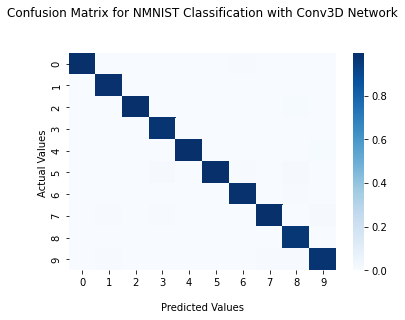

In [ ]:
from sklearn.metrics import confusion_matrix
import numpy as np
from keras.utils import np_utils
import seaborn as sns

#Create confusion matrix and normalizes it over predicted (columns)
result = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), normalize='pred')

ax = sns.heatmap(result, annot=False, cmap='Blues')

ax.set_title('Confusion Matrix for NMNIST Classification with Conv3D Network\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels([i for i in range(10)])
ax.yaxis.set_ticklabels([i for i in range(10)])

### Conv2D LTSM Network

In [ ]:
import tensorflow as tf
from tensorflow.keras import models, layers
from tensorflow.keras.optimizers import Adam
from keras.callbacks import EarlyStopping
from keras.callbacks import TensorBoard
import keras
from sklearn.model_selection import train_test_split

timesteps = 8
width = 34
height = 34
channels = 2
action_num = 10

model = models.Sequential(
    [
        layers.Input(
            shape=(timesteps, width, height, channels)
        ),
        layers.ConvLSTM2D(
            filters=64, kernel_size=(3, 3), padding="same", return_sequences=True, dropout=0.1, recurrent_dropout=0.1
        ),
        layers.MaxPool3D(
            pool_size=(1, 2, 2), strides=(1, 2, 2), padding="same"
        ),
        layers.BatchNormalization(),
        layers.ConvLSTM2D(
            filters=32, kernel_size=(3, 3), padding="same", return_sequences=True, dropout=0.1, recurrent_dropout=0.1
        ),
        layers.MaxPool3D(
            pool_size=(1, 2, 2), strides=(1, 2, 2), padding="same"
        ),
        layers.BatchNormalization(),
        layers.ConvLSTM2D(
            filters=16, kernel_size=(3, 3), padding="same", return_sequences=False, dropout=0.1, recurrent_dropout=0.1
        ),
        layers.MaxPool2D(
            pool_size=(2, 2), strides=(2, 2), padding="same"
        ),
        layers.BatchNormalization(),
        layers.Flatten(),
        layers.Dense(256, activation='relu'),
        layers.Dense(action_num, activation='softmax')
    ]
)

model.compile(loss='categorical_crossentropy',
              optimizer=Adam(lr=1e-4),
              metrics=['accuracy'])

model.summary()

early_stopping = EarlyStopping(monitor='val_accuracy', patience=4, restore_best_weights=True)

history = model.fit(x_train, y_train, batch_size=32, epochs=40, validation_data=(x_val, y_val), callbacks=[early_stopping])

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_6 (ConvLSTM2D)  (None, 8, 34, 34, 64)     152320    
                                                                 
 max_pooling3d_7 (MaxPooling  (None, 8, 17, 17, 64)    0         
 3D)                                                             
                                                                 
 batch_normalization_12 (Bat  (None, 8, 17, 17, 64)    256       
 chNormalization)                                                
                                                                 
 conv_lstm2d_7 (ConvLSTM2D)  (None, 8, 17, 17, 32)     110720    
                                                                 
 max_pooling3d_8 (MaxPooling  (None, 8, 9, 9, 32)      0         
 3D)                                                             
                                                      

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/40
750/750 [==============================] - 139s 173ms/step - loss: 0.5138 - accuracy: 0.8449 - val_loss: 0.2228 - val_accuracy: 0.9312
Epoch 2/40
750/750 [==============================] - 133s 177ms/step - loss: 0.1946 - accuracy: 0.9370 - val_loss: 0.1460 - val_accuracy: 0.9553
Epoch 3/40
750/750 [==============================] - 138s 184ms/step - loss: 0.1404 - accuracy: 0.9547 - val_loss: 0.1367 - val_accuracy: 0.9597
Epoch 4/40
750/750 [==============================] - 134s 179ms/step - loss: 0.1105 - accuracy: 0.9638 - val_loss: 0.1169 - val_accuracy: 0.9647
Epoch 5/40
750/750 [==============================] - 126s 169ms/step - loss: 0.0929 - accuracy: 0.9698 - val_loss: 0.0980 - val_accuracy: 0.9697
Epoch 6/40
750/750 [==============================] - 134s 179ms/step - loss: 0.0781 - accuracy: 0.9742 - val_loss: 0.0899 - val_accuracy: 0.9723
Epoch 7/40
750/750 [==============================] - 135s 180ms/step - loss: 0.0691 - accuracy: 0.9778 - val_loss: 0.0825 -

In [ ]:
from keras.models import load_model

model.save('/content/drive/MyDrive/models/conv_lstm_nmnist_classic.h5')  # creates a HDF5 file 'my_model.h5'
# del model  # deletes the existing model

#### Results

In [ ]:
from keras.models import load_model

model = load_model('/content/drive/MyDrive/models/conv_lstm_nmnist_classic.h5')

In [ ]:
score = model.evaluate(x_test, y_test)
y_pred = model.predict(x_test)

print('Test loss:', score[0])
print('Test accuracy:', score[1])

157/157 [==============================] - 7s 45ms/step - loss: 0.0799 - accuracy: 0.9764
Test loss: 0.0798872709274292
Test accuracy: 0.9764000177383423


In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_test.argmax(axis=1), y_pred.argmax(axis=1)))

              precision    recall  f1-score   support

           0       0.97      1.00      0.98       500
           1       0.99      0.99      0.99       500
           2       0.99      0.99      0.99       500
           3       0.99      0.96      0.97       500
           4       0.99      0.95      0.97       500
           5       0.97      0.98      0.98       500
           6       0.99      0.97      0.98       500
           7       0.97      0.98      0.97       500
           8       0.96      0.97      0.97       500
           9       0.94      0.98      0.96       500

    accuracy                           0.98      5000
   macro avg       0.98      0.98      0.98      5000
weighted avg       0.98      0.98      0.98      5000



[Text(0, 0.5, '0'),
 Text(0, 1.5, '1'),
 Text(0, 2.5, '2'),
 Text(0, 3.5, '3'),
 Text(0, 4.5, '4'),
 Text(0, 5.5, '5'),
 Text(0, 6.5, '6'),
 Text(0, 7.5, '7'),
 Text(0, 8.5, '8'),
 Text(0, 9.5, '9')]

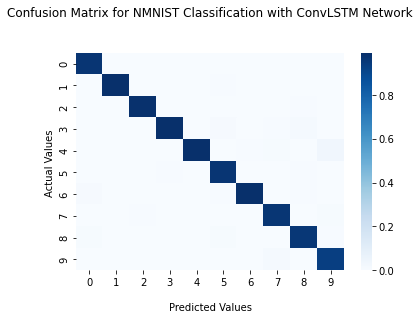

In [ ]:
from sklearn.metrics import confusion_matrix
import numpy as np
from keras.utils import np_utils
import seaborn as sns

#Create confusion matrix and normalizes it over predicted (columns)
result = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), normalize='pred')

ax = sns.heatmap(result, annot=False, cmap='Blues')

ax.set_title('Confusion Matrix for NMNIST Classification with ConvLSTM Network\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels([i for i in range(10)])
ax.yaxis.set_ticklabels([i for i in range(10)])

### Custom LTSM Network 1

In [ ]:
from keras.layers import Conv2D, MaxPooling2D, Flatten

def build_convnet(shape=(34, 34, 1)):
  model = Sequential()
  model.add(Conv2D(128, (2,2), padding='same', input_shape=shape))
  model.add(Activation('relu'))

  model.add(MaxPooling2D(pool_size=(2,2)))

  model.add(Conv2D(256, (2,2), padding='same'))
  model.add(Activation('relu'))

  model.add(MaxPooling2D(pool_size=(2,2)))

  model.add(Conv2D(512, (2,2), padding='same'))
  model.add(Activation('relu'))

  model.add(MaxPooling2D(pool_size=(2,2)))

  model.add(Flatten())

  return model

In [ ]:
from keras.layers.core import Dense, Activation, Dropout
from keras.layers.recurrent import LSTM
from keras.models import Sequential
from keras.layers import TimeDistributed, GRU

def action_model(shape=(8, 34, 34, 1), nbout=10):
    # Create our convnet with (34, 34, 1) input shape
    print("done")
    convnet = build_convnet(shape[1:])

    # then create our final model
    model = Sequential()
    # add the convnet with (8, 34, 34, 1) shape
    model.add(TimeDistributed(convnet, input_shape=shape))
    # here, you can also use GRU or LSTM
    model.add(GRU(64))
    # and finally, we make a decision network
    model.add(Dense(1024, activation='relu'))
    model.add(Dropout(.5))
    model.add(Dense(512, activation='relu'))
    model.add(Dropout(.5))
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(.5))
    model.add(Dense(64, activation='relu'))
    model.add(Dense(nbout, activation='softmax'))
    return model

In [ ]:
from keras.callbacks import EarlyStopping
from keras.callbacks import TensorBoard
import keras
from sklearn.model_selection import train_test_split
from tensorflow.keras.optimizers import Adam

model = action_model(x_train.shape[1:], 10)
opt = Adam(lr=0.0001, decay=1e-6)

model.summary()

model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

early_stopping = EarlyStopping(monitor='val_accuracy', patience=4, restore_best_weights=True)

history = model.fit(x_train, y_train, batch_size=32, epochs=60, validation_data=(x_val, y_val), callbacks=[early_stopping])

done
Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed (TimeDistr  (None, 8, 8192)          657280    
 ibuted)                                                         
                                                                 
 gru (GRU)                   (None, 64)                1585536   
                                                                 
 dense_8 (Dense)             (None, 1024)              66560     
                                                                 
 dropout_4 (Dropout)         (None, 1024)              0         
                                                                 
 dense_9 (Dense)             (None, 512)               524800    
                                                                 
 dropout_5 (Dropout)         (None, 512)               0         
                                                 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/60
750/750 [==============================] - 35s 42ms/step - loss: 1.3929 - accuracy: 0.4793 - val_loss: 0.4274 - val_accuracy: 0.8598
Epoch 2/60
750/750 [==============================] - 29s 39ms/step - loss: 0.4020 - accuracy: 0.8838 - val_loss: 0.2028 - val_accuracy: 0.9452
Epoch 3/60
750/750 [==============================] - 29s 39ms/step - loss: 0.2605 - accuracy: 0.9284 - val_loss: 0.1695 - val_accuracy: 0.9490
Epoch 4/60
750/750 [==============================] - 30s 40ms/step - loss: 0.1997 - accuracy: 0.9450 - val_loss: 0.1267 - val_accuracy: 0.9633
Epoch 5/60
750/750 [==============================] - 30s 40ms/step - loss: 0.1694 - accuracy: 0.9537 - val_loss: 0.1602 - val_accuracy: 0.9568
Epoch 6/60
750/750 [==============================] - 29s 39ms/step - loss: 0.1437 - accuracy: 0.9616 - val_loss: 0.1065 - val_accuracy: 0.9717
Epoch 7/60
750/750 [==============================] - 29s 39ms/step - loss: 0.1240 - accuracy: 0.9660 - val_loss: 0.1166 - val_accuracy:

In [ ]:
from keras.models import load_model

model.save('/content/drive/MyDrive/models/custom_conv_lstm_nmnist_classic.h5')  # creates a HDF5 file 'my_model.h5'
# del model  # deletes the existing model

#### Results

In [ ]:
from keras.models import load_model

model = load_model('/content/drive/MyDrive/models/custom_conv_lstm_nmnist.h5')

In [ ]:
score = model.evaluate(x_test, y_test, verbose=0)
y_pred = model.predict(x_test)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 0.09929852932691574
Test accuracy: 0.9769999980926514


In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_test.argmax(axis=1), y_pred.argmax(axis=1)))

              precision    recall  f1-score   support

           0       0.98      0.99      0.99       500
           1       0.98      0.99      0.99       500
           2       0.99      0.97      0.98       500
           3       0.99      0.96      0.97       500
           4       0.99      0.98      0.98       500
           5       0.98      0.97      0.97       500
           6       0.98      0.99      0.98       500
           7       0.96      0.99      0.98       500
           8       0.94      0.97      0.95       500
           9       0.98      0.96      0.97       500

    accuracy                           0.98      5000
   macro avg       0.98      0.98      0.98      5000
weighted avg       0.98      0.98      0.98      5000



[Text(0, 0.5, '0'),
 Text(0, 1.5, '1'),
 Text(0, 2.5, '2'),
 Text(0, 3.5, '3'),
 Text(0, 4.5, '4'),
 Text(0, 5.5, '5'),
 Text(0, 6.5, '6'),
 Text(0, 7.5, '7'),
 Text(0, 8.5, '8'),
 Text(0, 9.5, '9')]

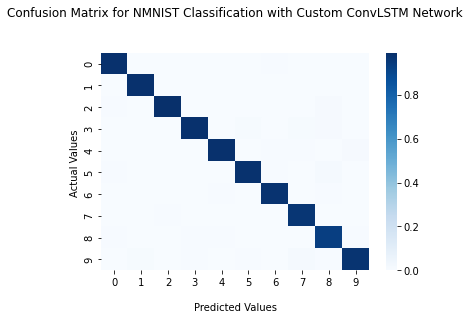

In [ ]:
from sklearn.metrics import confusion_matrix
import numpy as np
from keras.utils import np_utils
import seaborn as sns

#Create confusion matrix and normalizes it over predicted (columns)
result = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), normalize='pred')

ax = sns.heatmap(result, annot=False, cmap='Blues')

ax.set_title('Confusion Matrix for NMNIST Classification with Custom ConvLSTM Network\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels([i for i in range(10)])
ax.yaxis.set_ticklabels([i for i in range(10)])

# Random Plots

In [ ]:
# import pandas for data wrangling
import pandas as pd
# Import matplotlib
import matplotlib.pyplot as plt

firing_rates = ["∞", str(0.1)]
firing_rates.extend([str(i/10) for i in list(range(2, 13))])
firing_rates.extend(["." for i in range(3)])
relative_accuracy = [96.44, 10.70, 34.78, 75.22, 82.14, 88.76, 92.56, 92.98, 93.67, 94.23, 94.80, 95.01, 95.15]
relative_accuracy.extend([0, 0, 0])
relative_accuracy = [i * (100.0 / 96.44) for i in relative_accuracy]

# Build a dataset
df = pd.DataFrame(
        {
            'Name': firing_rates,
            'Value': relative_accuracy
        })

# Show 3 first rows
df.head(3)

,Name,Value
0,∞,100.000000
1,0.1,11.094981
2,0.2,36.063874


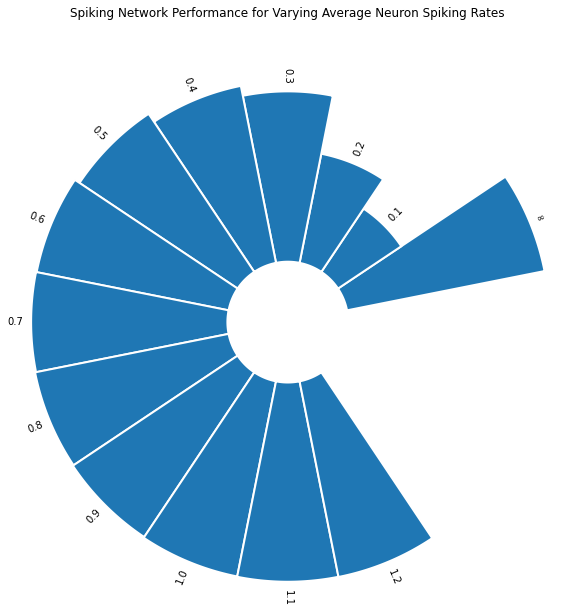

In [ ]:
# set figure size
plt.figure(figsize=(20,10))

# plot polar axis
ax = plt.subplot(111, polar=True)

# remove grid
plt.axis('off')

# Set the coordinates limits
upperLimit = 100
lowerLimit = 30

# Compute max and min in the dataset
max = df['Value'].max()

# Let's compute heights: they are a conversion of each item value in those new coordinates
# In our example, 0 in the dataset will be converted to the lowerLimit (10)
# The maximum will be converted to the upperLimit (100)
slope = (max - lowerLimit) / max
heights = slope * df.Value + lowerLimit

# Compute the width of each bar. In total we have 2*Pi = 360°
width = 2*np.pi / len(df.index)

# Compute the angle each bar is centered on:
indexes = list(range(1, len(df.index)+1))
angles = [element * width for element in indexes]

# Draw bars
bars = ax.bar(
    x=angles[:-3],
    height=heights[:-3],
    width=width,
    bottom=lowerLimit,
    linewidth=2,
    edgecolor="white")

# little space between the bar and the label
labelPadding = 4

# Add labels
for bar, angle, height, label in zip(bars,angles, heights, df["Name"]):

    # Labels are rotated. Rotation must be specified in degrees :(
    rotation = np.rad2deg(angle)

    # Flip some labels upside down
    alignment = ""
    if angle >= np.pi/2 and angle < 3*np.pi/2:
        alignment = "right"
        rotation = rotation + 180
    else:
        alignment = "left"

    # Finally add the labels
    ax.text(
        x=angle,
        y=lowerLimit + bar.get_height() + labelPadding,
        s=label,
        ha=alignment,
        va='center',
        rotation=rotation,
        rotation_mode="anchor")

ax.set_title('Spiking Network Performance for Varying Average Neuron Spiking Rates');

plt.grid()

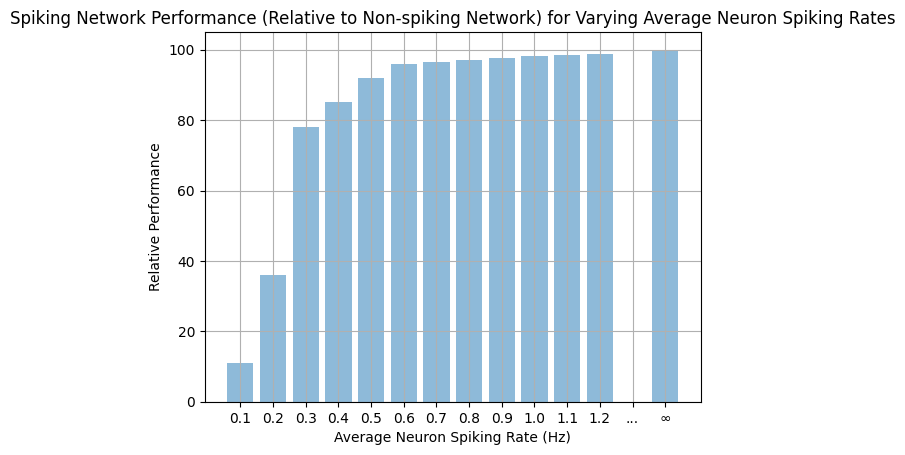

In [ ]:
import matplotlib.pyplot as plt; plt.rcdefaults()
import numpy as np
import matplotlib.pyplot as plt

# objects = ('Python', 'C++', 'Java', 'Perl', 'Scala', 'Lisp')
# performance = [10,8,6,4,2,1]

firing_rates = [str(0.1)]
firing_rates.extend([str(i/10) for i in list(range(2, 13))])
firing_rates.extend(["...", "∞"])
y_pos = np.arange(len(firing_rates))
relative_accuracy = [10.70, 34.78, 75.22, 82.14, 88.76, 92.56, 92.98, 93.67, 94.23, 94.80, 95.01, 95.15, 0, 96.44]
relative_accuracy = [i * (100.0 / 96.44) for i in relative_accuracy]

plt.bar(y_pos, relative_accuracy, align='center', alpha=0.5)
plt.xticks(y_pos, firing_rates)
plt.ylabel('Relative Performance')
plt.xlabel('Average Neuron Spiking Rate (Hz)')
plt.title('Spiking Network Performance (Relative to Non-spiking Network) for Varying Average Neuron Spiking Rates')

plt.grid()
plt.show()

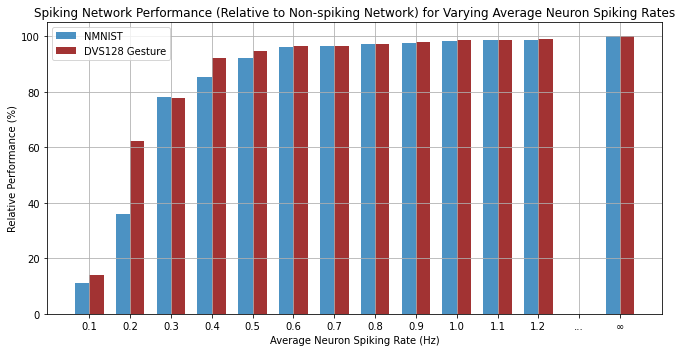

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# data to plot
firing_rates = [str(0.1)]
firing_rates.extend([str(i/10) for i in list(range(2, 13))])
firing_rates.extend(["...", "∞"])
# y_pos = np.arange(len(firing_rates))
relative_accuracy = [10.70, 34.78, 75.22, 82.14, 88.76, 92.56, 92.98, 93.67, 94.23, 94.80, 95.01, 95.15, 0, 96.44]
relative_accuracy = [i * (100.0 / 96.44) for i in relative_accuracy]

relative_accuracy_2 = [10.36, 46.07, 57.50, 68.21, 70.00, 71.21, 71.40, 71.98, 72.40, 72.87, 72.93, 73.12, 0, 73.93]
relative_accuracy_2 = [i * (100.0 / 73.93) for i in relative_accuracy_2]

# create plot
fig, ax = plt.subplots(figsize=(10, 5))
index = np.arange(len(firing_rates))
bar_width = 0.35
opacity = 0.8

rects1 = plt.bar(index, relative_accuracy, bar_width,
alpha=opacity,
label='NMNIST')

rects2 = plt.bar(index + bar_width, relative_accuracy_2, bar_width,
alpha=opacity,
color='darkred',
label='DVS128 Gesture')

plt.ylabel('Relative Performance (%)')
plt.xlabel('Average Neuron Spiking Rate (Hz)')
plt.title('Spiking Network Performance (Relative to Non-spiking Network) for Varying Average Neuron Spiking Rates')
plt.xticks(index + bar_width/2, firing_rates)
plt.legend()

plt.grid()
plt.tight_layout()
plt.show()